In [1]:
# Initialize Notebook
from IPython.core.display import HTML,Image
#%run ../library/v1.0.5/init.ipy
HTML('''<script> code_show=true;  function code_toggle() {  if (code_show){  $('div.input').hide();  } else {  $('div.input').show();  }  code_show = !code_show }  $( document ).ready(code_toggle); </script> <form action="javascript:code_toggle()"><input type="submit" value="Toggle Code"></form>''')

In [4]:
from IPython.core.display import HTML,Image
import gc, argparse, sys, os, errno
from functools import reduce
import h5py
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import os
from tqdm import tqdm_notebook as tqdm
import scipy
import sklearn
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')
from bokeh.io import output_notebook, show
output_notebook()
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.metrics import auc
from sklearn.preprocessing import RobustScaler,MinMaxScaler,StandardScaler
from sklearn.neighbors import NearestNeighbors
tableau20 = np.array([(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),  
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),  
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),  
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),  
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)])/255.
from bokeh.palettes import Category20c
styles = ["white","dark",'whitegrid',"darkgrid"]
contexts = ['paper','talk','poster','notebook']
sns.set_context(contexts[2])
sns.set_style(styles[0])
#plt.rc('font', family='serif')
#plt.rc('xtick', labelsize='x-small')
#plt.rc('ytick', labelsize='x-small')
#rcParams['font.weight'] = 'bold'
from ipywidgets import interact, FloatSlider,IntSlider, RadioButtons,Dropdown,Tab,Text

Populating the interactive namespace from numpy and matplotlib


Loading BokehJS ...

In [5]:
cd /home/xieyufeng/ex

/home/xieyufeng/ex


# Statistics

In [6]:
! chmod 777 /home/xieyufeng/ex/jupyter/plot_python-scirep-yufeng.ipynb

In [3]:
dataset='scirep'
sequencing_type = 'short'

file_counts = 'output/'+dataset+'/summary/read_counts.txt'
file_length_path = 'output/'+dataset+'/stats/mapped_read_length_by_sample/'
file_length_path_insert = 'output/'+dataset+'/stats/mapped_insert_size_by_sample/'
plot_save_path = 'output/'+dataset+'/plots/'
if sequencing_type == 'short':
    exp_mx_name = 'domains_combined'
elif sequencing_type =='long':
    exp_mx_name = 'featurecounts'

In [8]:
#Get table
def get_counts_ratio_table(file_counts,sequencing_type='short'):
    df = pd.read_table(file_counts, index_col=0)
    if sequencing_type == 'short':
        rna_types = [s.split('.')[0] for s in df.index.tolist() if s.endswith('.mapped')]
        rna_types = 'rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other'.split(',')
        mapped_ratio = {}
        mapped_count = {}
        for sample_id in df.columns.tolist():
            mapped_ratio[sample_id] = {}
            mapped_count[sample_id] = {}
            clean_counts = float(df.loc['clean.unmapped', sample_id])
            for rna_type in rna_types:
                mapped_ratio[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]/(
                    clean_counts - df.loc['other.unmapped', sample_id])
                mapped_count[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]
            for region in ('promoter', 'enhancer', 'intron','repeats','circRNA'):
                mapped_ratio[sample_id]['other'] -= mapped_ratio[sample_id][region]
                mapped_count[sample_id]['other'] -= mapped_count[sample_id][region]
        mapped_count = pd.DataFrame.from_records(mapped_count)        
        mapped_ratio = pd.DataFrame.from_records(mapped_ratio)
        mapped_count = mapped_count.loc[rna_types, :]
        mapped_ratio = mapped_ratio.loc[rna_types, :]
        return mapped_count.T, mapped_ratio.T
    elif sequencing_type =='long':
        index_1 = np.array(['rRNA','genome','remove_duplicates'])
        index_2 = np.array(['Y_RNA','circRNA','lncRNA','mRNA','snRNA','snoRNA','srpRNA','tucpRNA'])
        mapped_count_1 = df.loc[index_1]
        mapped_ratio_1 = mapped_count_1/df.loc['clean']
        mapped_count_2 = df.loc[index_2]
        mapped_ratio_2 = mapped_count_2/df.loc['remove_duplicates']
        return mapped_count_1.T, mapped_ratio_1.T,mapped_count_2.T, mapped_ratio_2.T
def get_length_table(file_length_path,sequencing_type='short'):
    length_table = {}
    for i in os.listdir(file_length_path):
        if sequencing_type =='short':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:52]
        elif sequencing_type =='long':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:152]
    sample_names = np.array(os.listdir(file_length_path))
    length_table_sum = length_table[sample_names[0]]
    for i in sample_names[1:]:
        length_table_sum += length_table[i]
    return length_table_sum/length_table_sum.sum(axis=0)



In [9]:
if sequencing_type == 'short': 
    table_count, table_ratio = get_counts_ratio_table(file_counts)
    length_table = get_length_table(file_length_path,sequencing_type=sequencing_type)
    rnanames=np.array(table_ratio.columns).astype('str')
elif sequencing_type == 'long': 
    table_count_1, table_ratio_1,table_count_2, table_ratio_2 = \
                    get_counts_ratio_table(file_counts,sequencing_type='long')
    rnanames_1=np.array(table_ratio_1.columns).astype('str')
    rnanames_2=np.array(table_ratio_2.columns).astype('str')
    length_table_1 = get_length_table(file_length_path,sequencing_type=sequencing_type)
    length_table_2 = get_length_table(file_length_path_insert,sequencing_type=sequencing_type)
    

In [7]:
table_count

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,2710145,2367858,2231703,159856,10063,1192989,72924,3161,50810,43985,15358,14683,18811,94482,131789,106,123532
Sample_1S10,1629968,2451143,2103127,88542,6048,931195,30802,2062,44639,40118,15321,13011,17792,97522,119503,90,148167
Sample_1S11,2272879,2824300,2436573,127084,8580,966880,45675,2884,60928,56902,21435,18018,24105,131103,151540,149,212277
Sample_1S12,3030702,2979583,2456711,144582,12183,1070268,59131,4395,53842,44830,13799,13926,21054,96823,138275,106,80860
Sample_1S13,1778928,2501530,2760974,89736,6507,1790410,43011,2848,42612,29171,10634,11857,12715,64569,99143,64,76453
Sample_1S14,2197443,1946642,3302499,105208,8307,1870826,48432,11469,47500,29478,10894,12070,13735,69761,116931,85,76892
Sample_1S15,1517066,1509001,2653245,87267,5619,1548449,29950,2063,38637,25290,10008,10798,11706,61580,96194,75,73083
Sample_1S16,1919819,2473806,2690755,120872,6775,1429103,39193,2814,44822,34236,12671,12423,14650,77495,114293,82,96340
Sample_1S17,3053709,2529547,3287205,143721,10873,1613219,60127,3880,56579,41107,13741,15784,18812,101591,150893,138,97079
Sample_1S18,1888862,1687399,2106196,99025,6954,1074847,40128,2761,51276,42820,15698,14413,18072,91231,117204,118,129377


## Diversity & Abudance

In [26]:
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'
original_mx = pd.read_table(original_mx_file,index_col=0)

In [57]:
original_mx

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
feature,,,,,,,,,,,,,,,,,,,,,
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,9,14,3,1,6,1,6,8,14,6,...,18,3,6,5,11,1,1,7,12,10
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,283,503,214,153,451,165,435,564,659,421,...,733,185,224,685,837,186,166,294,647,498
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,2460,6617,2140,1718,3872,1757,4559,6526,6476,7779,...,11828,1815,2512,6301,7514,1539,1457,2386,5836,4888
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,230,340,147,219,207,122,189,278,335,458,...,504,174,278,308,367,124,128,265,395,219
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,56569,55954,51215,55669,23908,25192,32174,58741,53344,45357,...,63867,37678,43107,37548,61921,16446,16151,59529,59295,57452
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,29,53,32,20,29,12,25,39,69,60,...,56,26,15,49,85,11,18,27,57,24
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,3312,5772,2920,2358,2902,1783,3801,5788,5670,5491,...,8338,2396,3010,5211,6180,1286,1449,3413,7459,8590
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,2222,3826,1630,1255,2124,1065,1916,2713,3902,5412,...,4763,1629,2012,2946,3725,987,944,2687,4298,1958
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,946,1625,736,572,1082,637,1307,1933,1647,2050,...,3332,866,997,1786,2042,570,502,950,1767,1571


### Abudance

In [38]:
expression_mx

NameError: name 'expression_mx' is not defined

In [311]:
table_ratio

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,0.293234,0.256199,0.241467,0.017296,0.001089,0.129080,0.007890,0.000342,0.005498,0.004759,0.001662,0.001589,0.002035,0.010223,0.014259,0.000011,0.013366
Sample_1S10,0.210616,0.316724,0.271755,0.011441,0.000781,0.120324,0.003980,0.000266,0.005768,0.005184,0.001980,0.001681,0.002299,0.012601,0.015442,0.000012,0.019145
Sample_1S11,0.242795,0.301699,0.260281,0.013575,0.000917,0.103285,0.004879,0.000308,0.006508,0.006078,0.002290,0.001925,0.002575,0.014005,0.016188,0.000016,0.022676
Sample_1S12,0.296515,0.291514,0.240358,0.014145,0.001192,0.104712,0.005785,0.000430,0.005268,0.004386,0.001350,0.001362,0.002060,0.009473,0.013528,0.000010,0.007911
Sample_1S13,0.190848,0.268371,0.296205,0.009627,0.000698,0.192080,0.004614,0.000306,0.004572,0.003130,0.001141,0.001272,0.001364,0.006927,0.010636,0.000007,0.008202
Sample_1S14,0.222680,0.197265,0.334662,0.010661,0.000842,0.189582,0.004908,0.001162,0.004813,0.002987,0.001104,0.001223,0.001392,0.007069,0.011849,0.000009,0.007792
Sample_1S15,0.197534,0.196484,0.345473,0.011363,0.000732,0.201620,0.003900,0.000269,0.005031,0.003293,0.001303,0.001406,0.001524,0.008018,0.012525,0.000010,0.009516
Sample_1S16,0.211198,0.272141,0.296008,0.013297,0.000745,0.157214,0.004312,0.000310,0.004931,0.003766,0.001394,0.001367,0.001612,0.008525,0.012573,0.000009,0.010598
Sample_1S17,0.272701,0.225893,0.293553,0.012835,0.000971,0.144063,0.005369,0.000346,0.005053,0.003671,0.001227,0.001410,0.001680,0.009072,0.013475,0.000012,0.008669
Sample_1S18,0.255722,0.228447,0.285146,0.013406,0.000941,0.145517,0.005433,0.000374,0.006942,0.005797,0.002125,0.001951,0.002447,0.012351,0.015868,0.000016,0.017516


In [39]:
original_mx

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
feature,,,,,,,,,,,,,,,,,,,,,
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,9,14,3,1,6,1,6,8,14,6,...,18,3,6,5,11,1,1,7,12,10
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,283,503,214,153,451,165,435,564,659,421,...,733,185,224,685,837,186,166,294,647,498
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,2460,6617,2140,1718,3872,1757,4559,6526,6476,7779,...,11828,1815,2512,6301,7514,1539,1457,2386,5836,4888
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,230,340,147,219,207,122,189,278,335,458,...,504,174,278,308,367,124,128,265,395,219
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,56569,55954,51215,55669,23908,25192,32174,58741,53344,45357,...,63867,37678,43107,37548,61921,16446,16151,59529,59295,57452
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,29,53,32,20,29,12,25,39,69,60,...,56,26,15,49,85,11,18,27,57,24
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,3312,5772,2920,2358,2902,1783,3801,5788,5670,5491,...,8338,2396,3010,5211,6180,1286,1449,3413,7459,8590
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,2222,3826,1630,1255,2124,1065,1916,2713,3902,5412,...,4763,1629,2012,2946,3725,987,944,2687,4298,1958
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,946,1625,736,572,1082,637,1307,1933,1647,2050,...,3332,866,997,1786,2042,570,502,950,1767,1571


In [68]:
expression_mx.columns[:,2]

IndexError: too many indices for array

In [83]:
expression_mx.columns[0:2]

Index(['Sample_1S3', 'Sample_1S6'], dtype='object')

In [104]:
expression_mx = original_mx
typelist = np.unique([expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])])
type_mx = pd.DataFrame(index=typelist,columns=expression_mx.columns)
for sample in expression_mx.columns:
    sample_feature = pd.DataFrame(data=expression_mx.loc[:,sample],index=expression_mx.index)
    sample_feature['type']=[expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])]
    for i in typelist:
        #print(i,sample,sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum())
        type_mx.loc[i,sample] = sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum()
type_mx/type_mx.sum()

In [109]:
type_mx/type_mx.sum()

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
Y_RNA,0.018078,0.023447,0.015847,0.020742,0.014402,0.018691,0.018121,0.039096,0.017693,0.034633,...,0.026098,0.016804,0.014382,0.016210,0.022376,0.019934,0.012572,0.018181,0.018453,0.012715
genomic,0.037876,0.032150,0.036390,0.024388,0.023889,0.036919,0.021295,0.011016,0.026191,0.037977,...,0.020935,0.027171,0.027074,0.020608,0.019683,0.022982,0.019216,0.040597,0.059562,0.025288
lncRNA,0.006176,0.004888,0.006386,0.004491,0.004820,0.006585,0.004730,0.003681,0.004431,0.005092,...,0.004163,0.004945,0.004731,0.004075,0.004204,0.004086,0.003889,0.005941,0.006961,0.004597
mRNA,0.003917,0.002509,0.004132,0.002673,0.002250,0.004331,0.002033,0.000892,0.002192,0.003201,...,0.001666,0.003093,0.003007,0.002093,0.002520,0.002425,0.001812,0.004656,0.005930,0.002630
miRNA,0.426773,0.379583,0.403963,0.428997,0.250468,0.319964,0.262668,0.345924,0.365929,0.430274,...,0.336649,0.361607,0.363570,0.315620,0.443494,0.351113,0.274495,0.440155,0.539044,0.391718
piRNA,0.338622,0.355777,0.374116,0.353780,0.440465,0.399455,0.455473,0.401570,0.387881,0.332579,...,0.380044,0.411273,0.400093,0.416121,0.356097,0.418687,0.456518,0.318290,0.262611,0.383082
snRNA,0.011670,0.009892,0.007564,0.008368,0.004858,0.007438,0.004704,0.004508,0.008517,0.011651,...,0.006504,0.005549,0.005622,0.005771,0.009163,0.005453,0.004558,0.011258,0.009562,0.004314
snoRNA,0.000432,0.000376,0.000426,0.000526,0.000271,0.000424,0.000276,0.000265,0.000409,0.000463,...,0.000287,0.000350,0.000336,0.000289,0.000541,0.000290,0.000269,0.000413,0.000402,0.000268
srpRNA,0.001415,0.001132,0.001365,0.001539,0.000823,0.001144,0.000780,0.000700,0.001143,0.001130,...,0.000701,0.000896,0.000893,0.000867,0.001574,0.000846,0.000672,0.001382,0.001047,0.000658
tRNA,0.153809,0.189412,0.148630,0.154020,0.256936,0.203700,0.229237,0.192122,0.184831,0.141976,...,0.222330,0.167370,0.179302,0.217666,0.139817,0.173372,0.225396,0.157701,0.094410,0.173836


In [110]:
table_ratio

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,0.293234,0.256199,0.241467,0.017296,0.001089,0.129080,0.007890,0.000342,0.005498,0.004759,0.001662,0.001589,0.002035,0.010223,0.014259,0.000011,0.013366
Sample_1S10,0.210616,0.316724,0.271755,0.011441,0.000781,0.120324,0.003980,0.000266,0.005768,0.005184,0.001980,0.001681,0.002299,0.012601,0.015442,0.000012,0.019145
Sample_1S11,0.242795,0.301699,0.260281,0.013575,0.000917,0.103285,0.004879,0.000308,0.006508,0.006078,0.002290,0.001925,0.002575,0.014005,0.016188,0.000016,0.022676
Sample_1S12,0.296515,0.291514,0.240358,0.014145,0.001192,0.104712,0.005785,0.000430,0.005268,0.004386,0.001350,0.001362,0.002060,0.009473,0.013528,0.000010,0.007911
Sample_1S13,0.190848,0.268371,0.296205,0.009627,0.000698,0.192080,0.004614,0.000306,0.004572,0.003130,0.001141,0.001272,0.001364,0.006927,0.010636,0.000007,0.008202
Sample_1S14,0.222680,0.197265,0.334662,0.010661,0.000842,0.189582,0.004908,0.001162,0.004813,0.002987,0.001104,0.001223,0.001392,0.007069,0.011849,0.000009,0.007792
Sample_1S15,0.197534,0.196484,0.345473,0.011363,0.000732,0.201620,0.003900,0.000269,0.005031,0.003293,0.001303,0.001406,0.001524,0.008018,0.012525,0.000010,0.009516
Sample_1S16,0.211198,0.272141,0.296008,0.013297,0.000745,0.157214,0.004312,0.000310,0.004931,0.003766,0.001394,0.001367,0.001612,0.008525,0.012573,0.000009,0.010598
Sample_1S17,0.272701,0.225893,0.293553,0.012835,0.000971,0.144063,0.005369,0.000346,0.005053,0.003671,0.001227,0.001410,0.001680,0.009072,0.013475,0.000012,0.008669
Sample_1S18,0.255722,0.228447,0.285146,0.013406,0.000941,0.145517,0.005433,0.000374,0.006942,0.005797,0.002125,0.001951,0.002447,0.012351,0.015868,0.000016,0.017516


In [106]:
type_mx.sum()

Sample_1S3       6303776
Sample_1S6       6422572
Sample_1S9       5633372
Sample_1S12      6944185
Sample_1S15      6023739
Sample_1S18      5272679
Sample_1S21      6850026
Sample_1S24      8255747
Sample_4S2       6866970
Sample_4S5       5797259
Sample_4S8       8527539
Sample_4S11      7958519
Sample_4S14      6040546
Sample_4S17      7826870
Sample_4S20      7433251
Sample_4S23      8322526
Sample_N1        7540957
Sample_N7        5999171
Sample_N13       6261127
Sample_N19       6240556
Sample_N25       7543988
Sample_N31       7241543
Sample_N37       8940439
Sample_N43       7056043
Sample_2S1       6515877
Sample_2S4       4376387
Sample_2S7       5622492
Sample_2S10      5640637
Sample_2S13      8931510
Sample_2S16      5558411
                  ...   
Sample_Pan04     2467539
Sample_PC5       6480411
Sample_PC11      6910323
Sample_PC17      7879616
Sample_PC25      7637742
Sample_PC35      7807329
Sample_1S2       6543771
Sample_1S5       6789141
Sample_1S8       5785806


In [312]:
!pwd

/home/xieyufeng/ex


In [37]:
def div_abu_plot(expression_mx,savefig=True):
    #### Diversity matrix
    type_counts_sample = pd.DataFrame()
    for samplename in expression_mx.columns.values:
        #names_[samplename] = expression_mx[samplename].index

        filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
        names = filter_zero_samplename.index
        names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
        type_counts = np.unique(names_type, return_counts = True)
        new = pd.DataFrame({'type' : type_counts[0],
                            samplename : type_counts[1],
                           })
        new = new.set_index('type')
        type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]
    
    #expression_mx = original_mx
    typelist = np.unique([expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])])
    type_mx = pd.DataFrame(index=typelist,columns=expression_mx.columns)
    for sample in expression_mx.columns:
        sample_feature = pd.DataFrame(data=expression_mx.loc[:,sample],index=expression_mx.index)
        sample_feature['type']=[expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])]
        for i in typelist:
            #print(i,sample,sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum())
            type_mx.loc[i,sample] = sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum()
    table_ratio = (type_mx/type_mx.sum()).T
    ####mean_sd matrix
    xticks = type_counts_sample.index.tolist()
    Means = type_counts_sample.mean(axis=1).values.tolist()
    Std=type_counts_sample.std(axis=1).values.tolist()
    mean_sd = pd.DataFrame(data = {'type':xticks,'mean':Means,'std':Std})
    mean_sd = mean_sd.sort_values(by='mean',ascending=False)
    mean_sd = mean_sd.set_index('type')
    Std = [[0]*len(mean_sd['std'].tolist()),mean_sd['std'].tolist()]
    ab = table_ratio*100
    #ab['genomic'] = ab['intron'] + ab['promoter'] + ab['enhancer'] + ab['repeats'] + ab['circRNA'] +ab['other']
    xticks_ab = ab.columns.tolist()
    Means_ab = ab.mean(axis=0).values.tolist()
    Std_ab = ab.std(axis=0).values.tolist()
    mean_sd_ab = pd.DataFrame(data = {'type':xticks_ab,'mean_ab':Means_ab,'std_ab':Std_ab})
    mean_sd_ab = mean_sd_ab.set_index('type')
    N = type_counts_sample.shape[0]
    ind = np.arange(N)
    merge = pd.concat([mean_sd,mean_sd_ab],axis=1,join_axes=[mean_sd.index])
    Std_ab = [[0]*len(merge['std_ab'].tolist()),merge['std_ab'].tolist()]
    xticks = merge.index.tolist()
    ####plot
    plt.rcParams['figure.dpi'] = 300    
    fig,(ax,ax1) = plt.subplots(1,2,figsize = (7,3.5))
    ax.barh(ind,merge['mean'],0.7,xerr=Std,color='grey')
    ax.invert_xaxis()
    ax = std_plot(ax,'Number of detected genes','','Diversity',left=False,ylim=[-0.5,10.5])#,ylim=[np.min(ind),np.max(ind)]
    ax.set_yticks(ind)
    #ax.set_yticks([])
    ax1.barh(ind,merge['mean_ab'],0.7,xerr=Std_ab,color="grey",)
    ax1.set_yticks(ind)
    ax1.set_yticklabels(xticks)
    ax1 = std_plot(ax1,'Percentage of mapped reads (%)','','Abundance',ylim=[-0.5,10.5])
    if savefig is True:
        fig.savefig('diversity_abundance.eps')
    embed_pdf_figure()    

div_abu_plot(expression_mx=original_mx,table_ratio=table_ratio,savefig=True)


In [392]:
merge

,mean,std,mean_ab,std_ab
type,,,,
genomic,3408.348958,538.201006,4.168441,1.604943
miRNA,752.614583,63.760985,28.998174,5.489471
piRNA,430.458333,87.289183,27.776602,5.614804
tRNA,426.723958,0.640557,13.129709,3.990084
mRNA,425.682292,52.741175,0.444883,0.180283
lncRNA,336.260417,34.270634,0.545671,0.137569
snRNA,158.760417,0.762262,0.551182,0.205584
tucpRNA,156.557292,21.293925,0.164670,0.070907
Y_RNA,99.859375,0.566070,1.476590,0.525506


In [391]:
mean_sd_ab

,mean_ab,std_ab
type,,
rRNA,22.621420,4.247270
miRNA,28.998174,5.489471
piRNA,27.776602,5.614804
Y_RNA,1.476590,0.525506
srpRNA,0.087693,0.020476
tRNA,13.129709,3.990084
snRNA,0.551182,0.205584
snoRNA,0.034965,0.009972
lncRNA,0.545671,0.137569


In [390]:
type_counts_sample

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
type,,,,,,,,,,,,,,,,,,,,,
Y_RNA,100,99,100,100,100,100,100,100,100,100,...,100,100,100,100,100,98,97,100,100,100
genomic,3649,3604,3653,2361,3642,3648,3636,1804,3632,3602,...,3652,3646,3650,3640,2028,3558,3531,3644,3630,3635
lncRNA,353,353,351,271,353,352,348,234,352,352,...,351,353,351,347,245,340,329,351,350,351
mRNA,447,436,452,330,443,451,451,261,445,441,...,451,449,452,447,278,439,429,449,440,450
miRNA,707,742,729,743,674,729,717,762,725,791,...,810,708,678,727,790,619,567,761,780,689
piRNA,453,406,419,479,316,424,344,300,420,503,...,482,452,392,381,471,222,203,551,557,370
snRNA,159,159,159,159,159,159,158,159,159,159,...,159,159,158,159,159,155,157,159,159,158
snoRNA,62,62,61,62,62,62,62,61,62,62,...,62,62,62,62,62,61,62,62,62,55
srpRNA,94,93,93,93,94,94,93,91,94,94,...,94,94,94,93,92,93,93,93,93,94


### Diverity

In [10]:
expression_mx = original_mx

In [13]:
names = expression_mx.index
names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
type_counts = np.unique(names_type, return_counts = True)

In [83]:
type(type_counts[1][1])

numpy.int64

In [18]:
names_={}
for samplename in expression_mx.columns.values:
    names_[samplename] = expression_mx[samplename].index
    display(np.where(expression_mx[samplename]>0))
    #retain_names_[samplename] = 
names_

{'Sample_1S3': Index(['hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22',
        'hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21',
        'hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22',
        'hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22',
        'hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22',
        'hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22',
        'hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22',
        'hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22',
        'hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22',
        'hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22',
        ...
        'chrY_13897780_13897800_+|genomic|chrY_13897780_13897800_+|peak_5469|chrY|13897780|13897800',
        'chrY_18615500_18615540_-|genomic|chrY_18615500_18615540_-|peak_5470|chrY|18

In [158]:
type_counts_sample = pd.DataFrame()
for samplename in expression_mx.columns.values:
    #names_[samplename] = expression_mx[samplename].index

    filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
    names = filter_zero_samplename.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    new = pd.DataFrame({'type' : type_counts[0],
                        samplename : type_counts[1],
                       })
    new = new.set_index('type')
    type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]
    #type_counts_sample[samplename] = type_counts

In [196]:
type_counts_sample

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
type,,,,,,,,,,,,,,,,,,,,,
Y_RNA,100,99,100,100,100,100,100,100,100,100,...,100,100,100,100,100,98,97,100,100,100
genomic,3649,3604,3653,2361,3642,3648,3636,1804,3632,3602,...,3652,3646,3650,3640,2028,3558,3531,3644,3630,3635
lncRNA,353,353,351,271,353,352,348,234,352,352,...,351,353,351,347,245,340,329,351,350,351
mRNA,447,436,452,330,443,451,451,261,445,441,...,451,449,452,447,278,439,429,449,440,450
miRNA,707,742,729,743,674,729,717,762,725,791,...,810,708,678,727,790,619,567,761,780,689
piRNA,453,406,419,479,316,424,344,300,420,503,...,482,452,392,381,471,222,203,551,557,370
snRNA,159,159,159,159,159,159,158,159,159,159,...,159,159,158,159,159,155,157,159,159,158
snoRNA,62,62,61,62,62,62,62,61,62,62,...,62,62,62,62,62,61,62,62,62,55
srpRNA,94,93,93,93,94,94,93,91,94,94,...,94,94,94,93,92,93,93,93,93,94


In [162]:
xticks = type_counts_sample.index.tolist()
xticks

['Y_RNA',
 'genomic',
 'lncRNA',
 'mRNA',
 'miRNA',
 'piRNA',
 'snRNA',
 'snoRNA',
 'srpRNA',
 'tRNA',
 'tucpRNA']

In [167]:
Means = type_counts_sample.mean(axis=1).values.tolist()

In [168]:
Std=type_counts_sample.std(axis=1).values.tolist()
Std

[0.5660699686647259,
 538.201005774525,
 34.270633649168694,
 52.74117478056262,
 63.760985263014064,
 87.28918258387208,
 0.7622616069415423,
 1.0308822193089087,
 0.9201158730808245,
 0.6405568244700998,
 21.29392531812188]

In [190]:
mean_sd = pd.DataFrame(data = {'type':xticks,'mean':Means,'std':Std})

In [191]:
mean_sd

,mean,std,type
0,99.859375,0.566070,Y_RNA
1,3408.348958,538.201006,genomic
2,336.260417,34.270634,lncRNA
3,425.682292,52.741175,mRNA
4,752.614583,63.760985,miRNA
5,430.458333,87.289183,piRNA
6,158.760417,0.762262,snRNA
7,61.572917,1.030882,snoRNA
8,93.390625,0.920116,srpRNA
9,426.723958,0.640557,tRNA


In [192]:
mean_sd = mean_sd.sort_values(by='mean',ascending=False)

In [195]:
mean_sd

,mean,std,type
1,3408.348958,538.201006,genomic
4,752.614583,63.760985,miRNA
5,430.458333,87.289183,piRNA
9,426.723958,0.640557,tRNA
3,425.682292,52.741175,mRNA
2,336.260417,34.270634,lncRNA
6,158.760417,0.762262,snRNA
10,156.557292,21.293925,tucpRNA
0,99.859375,0.566070,Y_RNA
8,93.390625,0.920116,srpRNA


In [213]:
mean_sd = mean_sd.set_index('type')

In [193]:
Std = [[0]*len(mean_sd['std'].tolist()),mean_sd['std'].tolist()]

In [217]:
table_count

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,2710145,2367858,2231703,159856,10063,1192989,72924,3161,50810,43985,15358,14683,18811,94482,131789,106,123532
Sample_1S10,1629968,2451143,2103127,88542,6048,931195,30802,2062,44639,40118,15321,13011,17792,97522,119503,90,148167
Sample_1S11,2272879,2824300,2436573,127084,8580,966880,45675,2884,60928,56902,21435,18018,24105,131103,151540,149,212277
Sample_1S12,3030702,2979583,2456711,144582,12183,1070268,59131,4395,53842,44830,13799,13926,21054,96823,138275,106,80860
Sample_1S13,1778928,2501530,2760974,89736,6507,1790410,43011,2848,42612,29171,10634,11857,12715,64569,99143,64,76453
Sample_1S14,2197443,1946642,3302499,105208,8307,1870826,48432,11469,47500,29478,10894,12070,13735,69761,116931,85,76892
Sample_1S15,1517066,1509001,2653245,87267,5619,1548449,29950,2063,38637,25290,10008,10798,11706,61580,96194,75,73083
Sample_1S16,1919819,2473806,2690755,120872,6775,1429103,39193,2814,44822,34236,12671,12423,14650,77495,114293,82,96340
Sample_1S17,3053709,2529547,3287205,143721,10873,1613219,60127,3880,56579,41107,13741,15784,18812,101591,150893,138,97079
Sample_1S18,1888862,1687399,2106196,99025,6954,1074847,40128,2761,51276,42820,15698,14413,18072,91231,117204,118,129377


In [306]:
merge

,mean,std,mean_ab,std_ab
type,,,,
genomic,3408.348958,538.201006,4.168441,1.604943
miRNA,752.614583,63.760985,28.998174,5.489471
piRNA,430.458333,87.289183,27.776602,5.614804
tRNA,426.723958,0.640557,13.129709,3.990084
mRNA,425.682292,52.741175,0.444883,0.180283
lncRNA,336.260417,34.270634,0.545671,0.137569
snRNA,158.760417,0.762262,0.551182,0.205584
tucpRNA,156.557292,21.293925,0.164670,0.070907
Y_RNA,99.859375,0.566070,1.476590,0.525506


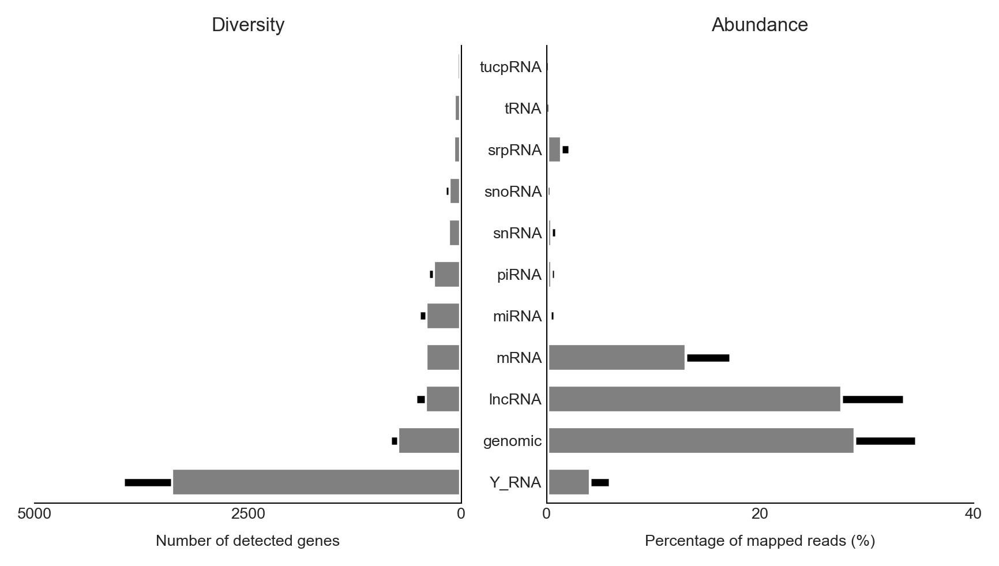

In [308]:
#### Diversity matrix
type_counts_sample = pd.DataFrame()
for samplename in expression_mx.columns.values:
    #names_[samplename] = expression_mx[samplename].index

    filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
    names = filter_zero_samplename.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    new = pd.DataFrame({'type' : type_counts[0],
                        samplename : type_counts[1],
                       })
    new = new.set_index('type')
    type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]

####mean_sd matrix
xticks = type_counts_sample.index.tolist()
Means = type_counts_sample.mean(axis=1).values.tolist()
Std=type_counts_sample.std(axis=1).values.tolist()
mean_sd = pd.DataFrame(data = {'type':xticks,'mean':Means,'std':Std})
mean_sd = mean_sd.sort_values(by='mean',ascending=False)
mean_sd = mean_sd.set_index('type')
Std = [[0]*len(mean_sd['std'].tolist()),mean_sd['std'].tolist()]
ab = table_ratio*100
ab['genomic'] = ab['intron'] + ab['promoter'] + ab['enhancer'] + ab['repeats'] + ab['circRNA'] +ab['other']
xticks_ab = ab.columns.tolist()
Means_ab = ab.mean(axis=0).values.tolist()
Std_ab = ab.std(axis=0).values.tolist()
mean_sd_ab = pd.DataFrame(data = {'type':xticks_ab,'mean_ab':Means_ab,'std_ab':Std_ab})
mean_sd_ab = mean_sd_ab.set_index('type')
N = type_counts_sample.shape[0]
ind = np.arange(N)
Std_ab = [[0]*len(merge['std_ab'].tolist()),merge['std_ab'].tolist()]
merge = pd.concat([mean_sd,mean_sd_ab],axis=1,join_axes=[mean_sd.index])


####plot
plt.rcParams['figure.dpi'] = 300    
fig,(ax,ax1) = plt.subplots(1,2,figsize = (7,3.5))
ax.barh(ind,merge['mean'],0.7,xerr=Std,color='grey')
ax.invert_xaxis()
ax = std_plot(ax,'Number of detected genes','','Diversity',left=False,ylim=[-0.5,10.5])#,ylim=[np.min(ind),np.max(ind)]
ax.set_yticks(ind)
ax.set_yticks([])
ax1.barh(ind,merge['mean_ab'],0.7,xerr=Std_ab,color="grey",)
ax1.set_yticks(ind)
ax1.set_yticklabels(xticks)
ax1 = std_plot(ax1,'Percentage of mapped reads (%)','','Abundance',ylim=[-0.5,10.5])




In [297]:
merge

,mean,std,mean_ab,std_ab
type,,,,
genomic,3408.348958,538.201006,4.168441,1.604943
miRNA,752.614583,63.760985,28.998174,5.489471
piRNA,430.458333,87.289183,27.776602,5.614804
tRNA,426.723958,0.640557,13.129709,3.990084
mRNA,425.682292,52.741175,0.444883,0.180283
lncRNA,336.260417,34.270634,0.545671,0.137569
snRNA,158.760417,0.762262,0.551182,0.205584
tucpRNA,156.557292,21.293925,0.164670,0.070907
Y_RNA,99.859375,0.566070,1.476590,0.525506


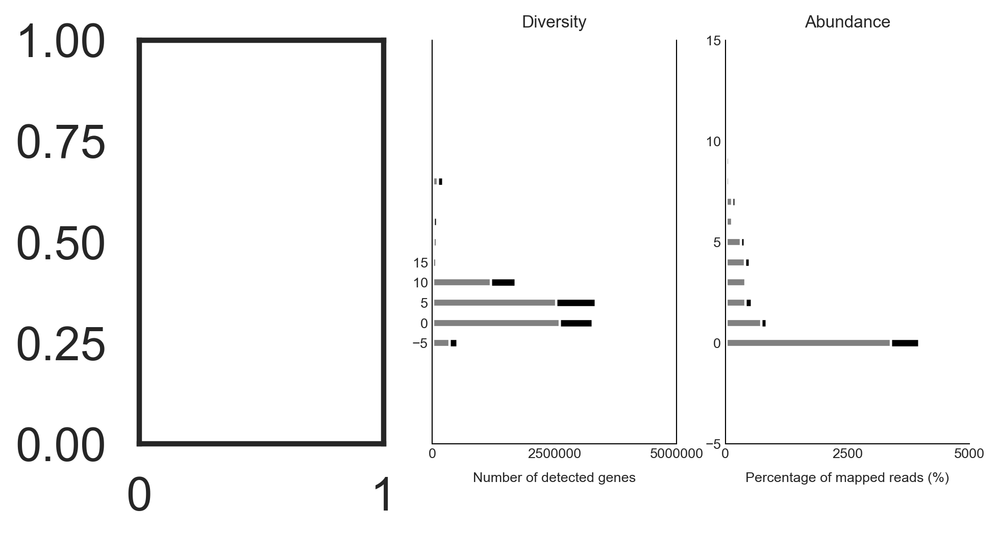

In [284]:
plt.rcParams['figure.dpi'] = 300    
fig,(ax_,ax,ax1) = plt.subplots(1,3,figsize = (7,3.5))
ax.barh(ind,merge['mean_ab'],0.5,xerr=Std_ab,color="grey")
#ax.invert_xaxis()


ax = std_plot(ax,'Number of detected genes','','Diversity',left=False)#,ylim=[np.min(ind),np.max(ind)]
#ax.spines['top'].set_visible(False)
#ax.spines['left'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.set_yticks(ind)
#ax.set_yticklabels(xticks)
#ax.set_yticks([])
ax1.barh(ind,merge['mean'],0.5,xerr=Std,color='grey')
#ax1.set_yticks(ind)
#ax1.set_yticklabels(xticks)
ax1 = std_plot(ax1,'Percentage of mapped reads (%)','','Abundance')
#ax.errorbar(Means,ind,xerr=Std,barsabove=True)

In [279]:
ax.get_yticks()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [242]:
table_ratio

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,0.293234,0.256199,0.241467,0.017296,0.001089,0.129080,0.007890,0.000342,0.005498,0.004759,0.001662,0.001589,0.002035,0.010223,0.014259,0.000011,0.013366
Sample_1S10,0.210616,0.316724,0.271755,0.011441,0.000781,0.120324,0.003980,0.000266,0.005768,0.005184,0.001980,0.001681,0.002299,0.012601,0.015442,0.000012,0.019145
Sample_1S11,0.242795,0.301699,0.260281,0.013575,0.000917,0.103285,0.004879,0.000308,0.006508,0.006078,0.002290,0.001925,0.002575,0.014005,0.016188,0.000016,0.022676
Sample_1S12,0.296515,0.291514,0.240358,0.014145,0.001192,0.104712,0.005785,0.000430,0.005268,0.004386,0.001350,0.001362,0.002060,0.009473,0.013528,0.000010,0.007911
Sample_1S13,0.190848,0.268371,0.296205,0.009627,0.000698,0.192080,0.004614,0.000306,0.004572,0.003130,0.001141,0.001272,0.001364,0.006927,0.010636,0.000007,0.008202
Sample_1S14,0.222680,0.197265,0.334662,0.010661,0.000842,0.189582,0.004908,0.001162,0.004813,0.002987,0.001104,0.001223,0.001392,0.007069,0.011849,0.000009,0.007792
Sample_1S15,0.197534,0.196484,0.345473,0.011363,0.000732,0.201620,0.003900,0.000269,0.005031,0.003293,0.001303,0.001406,0.001524,0.008018,0.012525,0.000010,0.009516
Sample_1S16,0.211198,0.272141,0.296008,0.013297,0.000745,0.157214,0.004312,0.000310,0.004931,0.003766,0.001394,0.001367,0.001612,0.008525,0.012573,0.000009,0.010598
Sample_1S17,0.272701,0.225893,0.293553,0.012835,0.000971,0.144063,0.005369,0.000346,0.005053,0.003671,0.001227,0.001410,0.001680,0.009072,0.013475,0.000012,0.008669
Sample_1S18,0.255722,0.228447,0.285146,0.013406,0.000941,0.145517,0.005433,0.000374,0.006942,0.005797,0.002125,0.001951,0.002447,0.012351,0.015868,0.000016,0.017516


### my effort 3

In [ ]:
type_counts_sample = pd.DataFrame()
for samplename in expression_mx.columns.values:
    #names_[samplename] = expression_mx[samplename].index

    filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
    names = filter_zero_samplename.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    new = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1),axis=1),
                       columns=('type',samplename))
    new = new.set_index('type')
    type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]
    #type_counts_sample[samplename] = type_counts

In [ ]:
type_counts_sample = pd.DataFrame()
for samplename in expression_mx.columns.values:
    #names_[samplename] = expression_mx[samplename].index

    filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
    names = filter_zero_samplename.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    new = pd.DataFrame({'type' : type_counts[0],
                        samplename : type_counts[1],
                       })
    new = new.set_index('type')
    type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]
    #type_counts_sample[samplename] = type_counts

In [157]:
type_counts_sample.mean()

Sample_1S3      601.454545
Sample_1S6      594.909091
Sample_1S9      600.818182
Sample_1S12     467.181818
Sample_1S15     585.000000
Sample_1S18     601.181818
Sample_1S21     591.090909
Sample_1S24     390.636364
Sample_4S2      598.454545
Sample_4S5      608.636364
Sample_4S8      434.090909
Sample_4S11     450.454545
Sample_4S14     581.272727
Sample_4S17     604.636364
Sample_4S20     594.454545
Sample_4S23     568.727273
Sample_N1       607.363636
Sample_N7       608.363636
Sample_N13      614.363636
Sample_N19      614.090909
Sample_N25      596.454545
Sample_N31      593.727273
Sample_N37      581.909091
Sample_N43      587.272727
Sample_2S1      600.545455
Sample_2S4      575.454545
Sample_2S7      614.727273
Sample_2S10     465.545455
Sample_2S13     602.272727
Sample_2S16     603.909091
                   ...    
Sample_Pan04    560.000000
Sample_PC5      618.545455
Sample_PC11     610.000000
Sample_PC17     446.181818
Sample_PC25     597.454545
Sample_PC35     581.090909
S

In [110]:
type_counts_sample[[]].astype(int)

""
type
Y_RNA
genomic
lncRNA
mRNA
miRNA
piRNA
snRNA
snoRNA
srpRNA


In [137]:
np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)))

array([['Y_RNA'],
       ['genomic'],
       ['lncRNA'],
       ['mRNA'],
       ['miRNA'],
       ['piRNA'],
       ['snRNA'],
       ['snoRNA'],
       ['srpRNA'],
       ['tRNA'],
       ['tucpRNA'],
       ['100'],
       ['3635'],
       ['351'],
       ['450'],
       ['689'],
       ['370'],
       ['158'],
       ['55'],
       ['94'],
       ['427'],
       ['166']], dtype='<U21')

In [153]:
pd.DataFrame(data = {'1': np.unique([1,2,3,4,5,6,5,4],return_counts = True)[0].tolist(),
             '2': np.unique([1,2,3,4,5,6,5,4],return_counts = True)[1].tolist()}
             )

,1,2
0,1,1
1,2,1
2,3,1
3,4,2
4,5,2
5,6,1


In [144]:
np.unique([1,2,3,4,5,6,5,4],return_counts = True)[0].tolist()

[1, 2, 3, 4, 5, 6]

In [145]:
np.unique([1,2,3,4,5,6,5,4],return_counts = True)[1].tolist()

[1, 1, 1, 2, 2, 1]

In [151]:
pd.DataFrame([1, 2, 5, 4, 5, 6],[1, 1, 1, 2, 2, 1],columns='count')

TypeError: Index(...) must be called with a collection of some kind, 'count' was passed

In [141]:
pd.DataFrame([1,2,3,4,5,6,5,4],
             [1,2,3,4,5,6,5,4],
             )

,0
1,1
2,2
3,3
4,4
5,5
6,6
5,5
4,4


In [111]:
data = pd.DataFrame([[1, "2"], [2, "2"]])
data.columns = ["one", "two"]
data

,one,two
0,1,2
1,2,2


In [116]:
data.astype(int)

,one,two
0,1,2
1,2,2


In [126]:
data

,one,two
0,1,2
1,2,2


In [125]:
data>700

,one,two
0,False,True
1,False,True


In [108]:
type_counts_sample>int(20000000)

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
type,,,,,,,,,,,,,,,,,,,,,
Y_RNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
genomic,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
lncRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
mRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
miRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
piRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
snRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
snoRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
srpRNA,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


In [95]:
type(type_counts_sample['Sample_1S3'])

pandas.core.series.Series

In [76]:
type_counts_sample

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
type,,,,,,,,,,,,,,,,,,,,,
Y_RNA,100,99,100,100,100,100,100,100,100,100,...,100,100,100,100,100,98,97,100,100,100
genomic,3649,3604,3653,2361,3642,3648,3636,1804,3632,3602,...,3652,3646,3650,3640,2028,3558,3531,3644,3630,3635
lncRNA,353,353,351,271,353,352,348,234,352,352,...,351,353,351,347,245,340,329,351,350,351
mRNA,447,436,452,330,443,451,451,261,445,441,...,451,449,452,447,278,439,429,449,440,450
miRNA,707,742,729,743,674,729,717,762,725,791,...,810,708,678,727,790,619,567,761,780,689
piRNA,453,406,419,479,316,424,344,300,420,503,...,482,452,392,381,471,222,203,551,557,370
snRNA,159,159,159,159,159,159,158,159,159,159,...,159,159,158,159,159,155,157,159,159,158
snoRNA,62,62,61,62,62,62,62,61,62,62,...,62,62,62,62,62,61,62,62,62,55
srpRNA,94,93,93,93,94,94,93,91,94,94,...,94,94,94,93,92,93,93,93,93,94


In [87]:
type_counts_sample['Sample_1S3']

type
Y_RNA       100
genomic    3649
lncRNA      353
mRNA        447
miRNA       707
piRNA       453
snRNA       159
snoRNA       62
srpRNA       94
tRNA        427
tucpRNA     165
Name: Sample_1S3, dtype: object

In [53]:
N = type_counts_sample.shape[1]
N

192

In [54]:
xticks = type_counts_sample.index.tolist()
xticks

['Y_RNA',
 'genomic',
 'lncRNA',
 'mRNA',
 'miRNA',
 'piRNA',
 'snRNA',
 'snoRNA',
 'srpRNA',
 'tRNA',
 'tucpRNA']

In [71]:
type_counts_sample.mean()

Sample_1S3      9.124085e+29
Sample_1S6      9.032767e+29
Sample_1S9      9.124121e+29
Sample_1S12     9.112375e+29
Sample_1S15     9.124021e+29
Sample_1S18     9.124076e+29
Sample_1S21     9.123967e+29
Sample_1S24     9.107311e+28
Sample_4S2      9.123930e+29
Sample_4S5      9.123658e+29
Sample_4S8      9.018220e+29
Sample_4S11     9.111548e+29
Sample_4S14     8.942121e+29
Sample_4S17     9.124058e+29
Sample_4S20     9.123994e+29
Sample_4S23     9.123094e+29
Sample_N1       9.124058e+29
Sample_N7       9.124030e+29
Sample_N13      9.124176e+29
Sample_N19      9.124158e+29
Sample_N25      9.124040e+29
Sample_N31      9.124067e+29
Sample_N37      9.124058e+29
Sample_N43      9.124058e+29
Sample_2S1      9.123967e+29
Sample_2S4      9.123421e+29
Sample_2S7      9.124176e+29
Sample_2S10     9.112384e+29
Sample_2S13     9.124049e+29
Sample_2S16     9.124012e+29
                    ...     
Sample_Pan04    8.759849e+29
Sample_PC5      9.123930e+29
Sample_PC11     9.123785e+29
Sample_PC17   

In [49]:
demo=pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1),columns=('name','name1'))
demo = demo.set_index('name')
demo

,name1
name,
Y_RNA,100
genomic,3635
lncRNA,351
mRNA,450
miRNA,689
piRNA,370
snRNA,158
snoRNA,55
srpRNA,94


In [29]:
original_mx.iloc[np.array([1,2]),:]

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
feature,,,,,,,,,,,,,,,,,,,,,
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,283,503,214,153,451,165,435,564,659,421,...,733,185,224,685,837,186,166,294,647,498
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,2460,6617,2140,1718,3872,1757,4559,6526,6476,7779,...,11828,1815,2512,6301,7514,1539,1457,2386,5836,4888


In [ ]:
def plot_bar_for_filter(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10 ):
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))

    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(20 , 6))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    ax.set_title('samples with expression value higher than '+str(counts_threshold) +
                    ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)

## highly-expressed RNAs

### my own effort4

In [318]:
expression_mx

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
feature,,,,,,,,,,,,,,,,,,,,,
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,9,14,3,1,6,1,6,8,14,6,...,18,3,6,5,11,1,1,7,12,10
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,283,503,214,153,451,165,435,564,659,421,...,733,185,224,685,837,186,166,294,647,498
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,2460,6617,2140,1718,3872,1757,4559,6526,6476,7779,...,11828,1815,2512,6301,7514,1539,1457,2386,5836,4888
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,230,340,147,219,207,122,189,278,335,458,...,504,174,278,308,367,124,128,265,395,219
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,56569,55954,51215,55669,23908,25192,32174,58741,53344,45357,...,63867,37678,43107,37548,61921,16446,16151,59529,59295,57452
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,29,53,32,20,29,12,25,39,69,60,...,56,26,15,49,85,11,18,27,57,24
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,3312,5772,2920,2358,2902,1783,3801,5788,5670,5491,...,8338,2396,3010,5211,6180,1286,1449,3413,7459,8590
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,2222,3826,1630,1255,2124,1065,1916,2713,3902,5412,...,4763,1629,2012,2946,3725,987,944,2687,4298,1958
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,946,1625,736,572,1082,637,1307,1933,1647,2050,...,3332,866,997,1786,2042,570,502,950,1767,1571


In [437]:
em_ratio = em/em.sum(axis=0)

In [433]:
em_sum

feature
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22                              1470
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21                                     88093
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22                                    949361
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22                                     55659
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22                                  10381430
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22                                      7777
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22                                    916509
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22                                    522228
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22                                    284152
hsa-let-7e-

In [441]:
pd.DataFrame(em_sum.sort_values(ascending=False))

,0
feature,
hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31,138245204
hsa_piR_000765|piRNA|hsa_piR_000765|hsa_piR_000765|hsa_piR_000765|0|31,135625998
hsa_piR_004153|piRNA|hsa_piR_004153|hsa_piR_004153|hsa_piR_004153|0|32,109924960
hsa-miR-99a-5p|miRNA|hsa-miR-99a-5p|hsa-miR-99a-5p|hsa-miR-99a-5p|0|22,69338354
hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p|hsa-miR-128-3p|0|21,30686914
hsa-miR-129-5p|miRNA|hsa-miR-129-5p|hsa-miR-129-5p|hsa-miR-129-5p|0|21,27026552
hsa_piR_020829|piRNA|hsa_piR_020829|hsa_piR_020829|hsa_piR_020829|0|32,26480576
hsa-miR-22-3p|miRNA|hsa-miR-22-3p|hsa-miR-22-3p|hsa-miR-22-3p|0|22,26017043
hsa-miR-320a-3p|miRNA|hsa-miR-320a-3p|hsa-miR-320a-3p|hsa-miR-320a-3p|0|22,21655954


In [451]:
em = expression_mx
em_sum = em.sum(axis=1)
#em_sum
featurename = pd.DataFrame(em_sum.sort_values(ascending=False)).iloc[:20].index.values.tolist()
em_top = em_ratio.iloc[np.where(em.index.isin(featurename))[0],:]
#em_top[]

In [452]:
featurename

['hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31',
 'hsa_piR_000765|piRNA|hsa_piR_000765|hsa_piR_000765|hsa_piR_000765|0|31',
 'hsa_piR_004153|piRNA|hsa_piR_004153|hsa_piR_004153|hsa_piR_004153|0|32',
 'hsa-miR-99a-5p|miRNA|hsa-miR-99a-5p|hsa-miR-99a-5p|hsa-miR-99a-5p|0|22',
 'hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p|hsa-miR-128-3p|0|21',
 'hsa-miR-129-5p|miRNA|hsa-miR-129-5p|hsa-miR-129-5p|hsa-miR-129-5p|0|21',
 'hsa_piR_020829|piRNA|hsa_piR_020829|hsa_piR_020829|hsa_piR_020829|0|32',
 'hsa-miR-22-3p|miRNA|hsa-miR-22-3p|hsa-miR-22-3p|hsa-miR-22-3p|0|22',
 'hsa-miR-320a-3p|miRNA|hsa-miR-320a-3p|hsa-miR-320a-3p|hsa-miR-320a-3p|0|22',
 'hsa-miR-181a-5p|miRNA|hsa-miR-181a-5p|hsa-miR-181a-5p|hsa-miR-181a-5p|0|23',
 'hsa-miR-9-3p|miRNA|hsa-miR-9-3p|hsa-miR-9-3p|hsa-miR-9-3p|0|22',
 'hsa_piR_017716|piRNA|hsa_piR_017716|hsa_piR_017716|hsa_piR_017716|0|31',
 'hsa-miR-100-5p|miRNA|hsa-miR-100-5p|hsa-miR-100-5p|hsa-miR-100-5p|0|22',
 'hsa-miR-181b-5p|miRNA|hsa-m

In [454]:
em_top = em_top.reset_index()

In [459]:
em_top['feature'] = em_top['feature'].astype('category')

In [460]:
em_top['feature'].cat.reorder_categories(featurename,inplace=True)

In [463]:
em_top.sort_values('feature',inplace=True)

In [466]:
em_top = em_top.set_index(['feature'])

In [467]:
em_top

samplename,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
feature,,,,,,,,,,,,,,,,,,,,,
hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31,0.082264,0.084052,0.092319,0.103199,0.122508,0.124337,0.134476,0.117052,0.084176,0.079770,...,0.115553,0.140725,0.132705,0.112324,0.068044,0.122397,0.147751,0.084121,0.055735,0.120584
hsa_piR_000765|piRNA|hsa_piR_000765|hsa_piR_000765|hsa_piR_000765|0|31,0.080614,0.082627,0.090218,0.101195,0.119603,0.121237,0.131602,0.114960,0.082363,0.078006,...,0.113422,0.138071,0.129852,0.110125,0.066859,0.120391,0.144327,0.082696,0.054190,0.117770
hsa_piR_004153|piRNA|hsa_piR_004153|hsa_piR_004153|hsa_piR_004153|0|32,0.092263,0.095740,0.092737,0.069012,0.102155,0.075722,0.096142,0.089365,0.114169,0.079586,...,0.081061,0.067643,0.069734,0.095836,0.093042,0.088025,0.094497,0.080283,0.060148,0.067034
hsa-miR-99a-5p|miRNA|hsa-miR-99a-5p|hsa-miR-99a-5p|hsa-miR-99a-5p|0|22,0.057474,0.056182,0.055334,0.046521,0.037518,0.041832,0.037626,0.050026,0.053307,0.065746,...,0.051626,0.047985,0.053364,0.046878,0.064358,0.054616,0.040244,0.061720,0.079152,0.046681
hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p|hsa-miR-128-3p|0|21,0.020992,0.034510,0.021263,0.007739,0.019522,0.010619,0.017668,0.022020,0.034272,0.044029,...,0.023346,0.011372,0.013756,0.024064,0.040710,0.018594,0.014333,0.021014,0.055040,0.019343
hsa-miR-129-5p|miRNA|hsa-miR-129-5p|hsa-miR-129-5p|hsa-miR-129-5p|0|21,0.027405,0.017712,0.024305,0.045776,0.010280,0.023504,0.011662,0.016737,0.016016,0.020590,...,0.016737,0.027324,0.025352,0.013321,0.017574,0.018238,0.015048,0.029883,0.025943,0.018689
hsa_piR_020829|piRNA|hsa_piR_020829|hsa_piR_020829|hsa_piR_020829|0|32,0.017987,0.027828,0.020119,0.013106,0.024462,0.015966,0.022892,0.020242,0.030479,0.025919,...,0.019303,0.012223,0.012070,0.028688,0.036556,0.021829,0.015836,0.014719,0.026878,0.020763
hsa-miR-22-3p|miRNA|hsa-miR-22-3p|hsa-miR-22-3p|hsa-miR-22-3p|0|22,0.026761,0.014662,0.024849,0.033556,0.009680,0.020415,0.010203,0.014955,0.014183,0.015382,...,0.013436,0.028028,0.024570,0.011612,0.017123,0.021175,0.014259,0.029787,0.021159,0.018843
hsa-miR-320a-3p|miRNA|hsa-miR-320a-3p|hsa-miR-320a-3p|hsa-miR-320a-3p|0|22,0.025699,0.012116,0.022777,0.037605,0.006930,0.021486,0.007584,0.010487,0.011825,0.016406,...,0.011467,0.025572,0.018474,0.007117,0.011900,0.013234,0.010306,0.027208,0.019147,0.013935


In [359]:
em_top.columns.name = 'samplename'

In [468]:
stack = pd.DataFrame(em_top.stack())
stack = stack.reset_index()

In [469]:
stack.reset_index()

,index,feature,samplename,0
0,0,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S3,0.082264
1,1,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S6,0.084052
2,2,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S9,0.092319
3,3,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S12,0.103199
4,4,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S15,0.122508
5,5,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S18,0.124337
6,6,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S21,0.134476
7,7,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S24,0.117052
8,8,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_4S2,0.084176
9,9,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_4S5,0.079770


In [400]:
stack['class'].iloc[np.where(stack['samplename'] == samplename)]

144     Sample_1S1
336     Sample_1S1
528     Sample_1S1
720     Sample_1S1
912     Sample_1S1
1104    Sample_1S1
1296    Sample_1S1
1488    Sample_1S1
1680    Sample_1S1
1872    Sample_1S1
2064    Sample_1S1
2256    Sample_1S1
2448    Sample_1S1
2640    Sample_1S1
2832    Sample_1S1
3024    Sample_1S1
3216    Sample_1S1
3408    Sample_1S1
3600    Sample_1S1
3792    Sample_1S1
Name: class, dtype: object

In [402]:
sample_class.iloc[Sample_1S1]

NameError: name 'Sample_1S1' is not defined

In [422]:
sample_class[sample_class.index=='Sample_PC9']['label'].values[0]

'Prostate Cancer'

In [470]:
stack['class'] = stack['samplename']
for samplename in unique(stack['samplename']):
    stack['class'].iloc[np.where(stack['samplename'] == samplename)] \
    = sample_class[sample_class.index==samplename]['label'].values[0]

In [471]:
stack.rename(columns={ stack.columns[2]: "counts" }, inplace=True)

In [472]:
stack

,feature,samplename,counts,class
0,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S3,0.082264,Colorectal Cancer
1,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S6,0.084052,Colorectal Cancer
2,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S9,0.092319,Colorectal Cancer
3,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S12,0.103199,Colorectal Cancer
4,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S15,0.122508,Colorectal Cancer
5,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S18,0.124337,Colorectal Cancer
6,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S21,0.134476,Colorectal Cancer
7,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S24,0.117052,Colorectal Cancer
8,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_4S2,0.084176,Colorectal Cancer
9,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_4S5,0.079770,Colorectal Cancer


In [475]:
range(stack.shape[0])

range(0, 3840)

In [484]:
stack['feature_cut'] = np.array([stack['feature'][i].split('|')[0] for i in range(stack.shape[0])])

In [ ]:
names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])

In [482]:
stack

,feature,samplename,counts,class,feature_cut
0,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S3,0.082264,Colorectal Cancer,piRNA
1,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S6,0.084052,Colorectal Cancer,piRNA
2,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S9,0.092319,Colorectal Cancer,piRNA
3,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S12,0.103199,Colorectal Cancer,piRNA
4,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S15,0.122508,Colorectal Cancer,piRNA
5,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S18,0.124337,Colorectal Cancer,piRNA
6,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S21,0.134476,Colorectal Cancer,piRNA
7,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_1S24,0.117052,Colorectal Cancer,piRNA
8,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_4S2,0.084176,Colorectal Cancer,piRNA
9,hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_02...,Sample_4S5,0.079770,Colorectal Cancer,piRNA


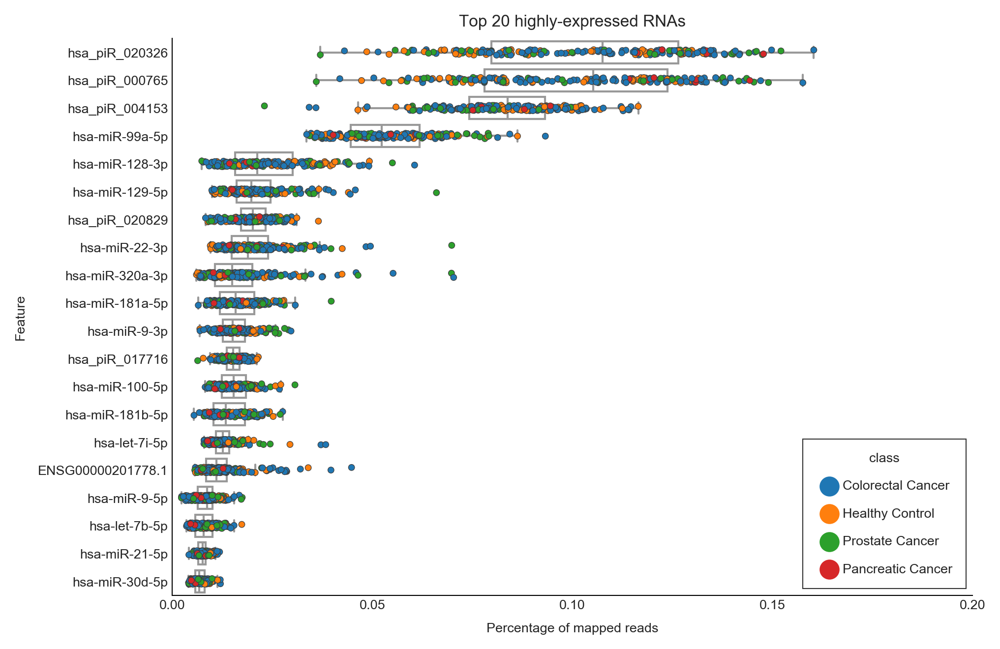

In [505]:
fig,ax=plt.subplots(figsize=(7,5))
ax = sns.stripplot(x="counts", y="feature_cut", data=stack,hue="class",jitter=True, linewidth=0.3,size=3)
ax = sns.boxplot(x="counts", y="feature_cut", data=stack,color='#FFFFFF',linewidth=1,fliersize=0,saturation=1)
std_plot(ax,'Percentage of mapped reads','Feature','Top 20 highly-expressed RNAs',legendtitle='class',sns=False,legendsort=False,xlim=[0,0.2],borderpad=1)

### plot

In [12]:
def embed_pdf_figure(width='640', height='480'):
    data = BytesIO()
    plt.savefig(data, format='pdf')
    data = data.getvalue()
    data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
    display(HTML('<object width="{}" height="{}" data="{}"></object>'.format(width, height, data)))
    plt.close()
    
from base64 import b64encode, b64decode
from io import StringIO, BytesIO

In [511]:
em = expression_mx
em_ratio = em/em.sum(axis=0)
em_sum = em.sum(axis=1)
featurename = pd.DataFrame(em_sum.sort_values(ascending=False)).iloc[:20].index.values.tolist()
em_top = em_ratio.iloc[np.where(em.index.isin(featurename))[0],:]
em_top = em_top.reset_index()
em_top['feature'] = em_top['feature'].astype('category')
em_top['feature'].cat.reorder_categories(featurename,inplace=True)
em_top.sort_values('feature',inplace=True)
em_top = em_top.set_index(['feature'])
em_top.columns.name = 'samplename'
stack = pd.DataFrame(em_top.stack())
stack = stack.reset_index()

stack['class'] = stack['samplename']
#for samplename in unique(stack['samplename']):
#    stack['class'].iloc[np.where(stack['samplename'] == samplename)] \
#    = sample_class[sample_class.index==samplename]['label'].values[0]

stack.rename(columns={ stack.columns[2]: "counts" }, inplace=True)
stack['feature_cut'] = np.array([stack['feature'][i].split('|')[0] for i in range(stack.shape[0])])
# attention sns merge function

fig,ax=plt.subplots(figsize=(7,5))
ax = sns.stripplot(x="counts", y="feature_cut", data=stack,jitter=True, linewidth=0.3,size=3)#hue="class",
ax = sns.boxplot(x="counts", y="feature_cut", data=stack,color='#FFFFFF',linewidth=1,fliersize=0,saturation=1)
std_plot(ax,'Percentage of mapped reads','Feature','Top 20 highly-expressed RNAs',legendtitle='class',sns=False,legendsort=False,xlim=[0,0.2],borderpad=1)
embed_pdf_figure()


In [35]:
def plot_top20(expression_mx):
    em = expression_mx
    em_ratio = em/em.sum(axis=0)
    em_sum = em.sum(axis=1)
    featurename = pd.DataFrame(em_sum.sort_values(ascending=False)).iloc[:20].index.values.tolist()
    em_top = em_ratio.iloc[np.where(em.index.isin(featurename))[0],:]
    em_top = em_top.reset_index()
    em_top['feature'] = em_top['feature'].astype('category')
    em_top['feature'].cat.reorder_categories(featurename,inplace=True)
    em_top.sort_values('feature',inplace=True)
    em_top = em_top.set_index(['feature'])
    em_top.columns.name = 'samplename'
    stack = pd.DataFrame(em_top.stack())
    stack = stack.reset_index()

    #stack['class'] = stack['samplename']
    #for samplename in unique(stack['samplename']):
    #    stack['class'].iloc[np.where(stack['samplename'] == samplename)] \
    #    = sample_class[sample_class.index==samplename]['label'].values[0]

    stack.rename(columns={ stack.columns[2]: "counts" }, inplace=True)
    stack['feature_cut'] = np.array([stack['feature'][i].split('|')[0] for i in range(stack.shape[0])])
    # attention sns merge function

    fig,ax=plt.subplots(figsize=(7,5))
    ax = sns.stripplot(x="counts", y="feature_cut", data=stack,jitter=True, linewidth=0.1,size=1,color='grey')#,hue="class"
    ax = sns.boxplot(x="counts", y="feature_cut", data=stack,color='#FFFFFF',linewidth=1,fliersize=0,saturation=1)
    std_plot(ax,'Percentage of mapped reads','Feature','Top 20 highly-expressed RNAs',sns=False,legendsort=False,xlim=[0,0.2],borderpad=1)#,legendtitle='class'
    fig.tight_layout()
    embed_pdf_figure()

plot_top20(original_mx)


In [389]:
stack['samplename'].iloc[np.where(stack['samplename'] == 'Sample_1S3')]

0       Sample_1S3
192     Sample_1S3
384     Sample_1S3
576     Sample_1S3
768     Sample_1S3
960     Sample_1S3
1152    Sample_1S3
1344    Sample_1S3
1536    Sample_1S3
1728    Sample_1S3
1920    Sample_1S3
2112    Sample_1S3
2304    Sample_1S3
2496    Sample_1S3
2688    Sample_1S3
2880    Sample_1S3
3072    Sample_1S3
3264    Sample_1S3
3456    Sample_1S3
3648    Sample_1S3
Name: samplename, dtype: object

In [373]:

sample_class

,label
sample_id,
Sample_1S3,Colorectal Cancer
Sample_1S6,Colorectal Cancer
Sample_1S9,Colorectal Cancer
Sample_1S12,Colorectal Cancer
Sample_1S15,Colorectal Cancer
Sample_1S18,Colorectal Cancer
Sample_1S21,Colorectal Cancer
Sample_1S24,Colorectal Cancer
Sample_4S2,Colorectal Cancer


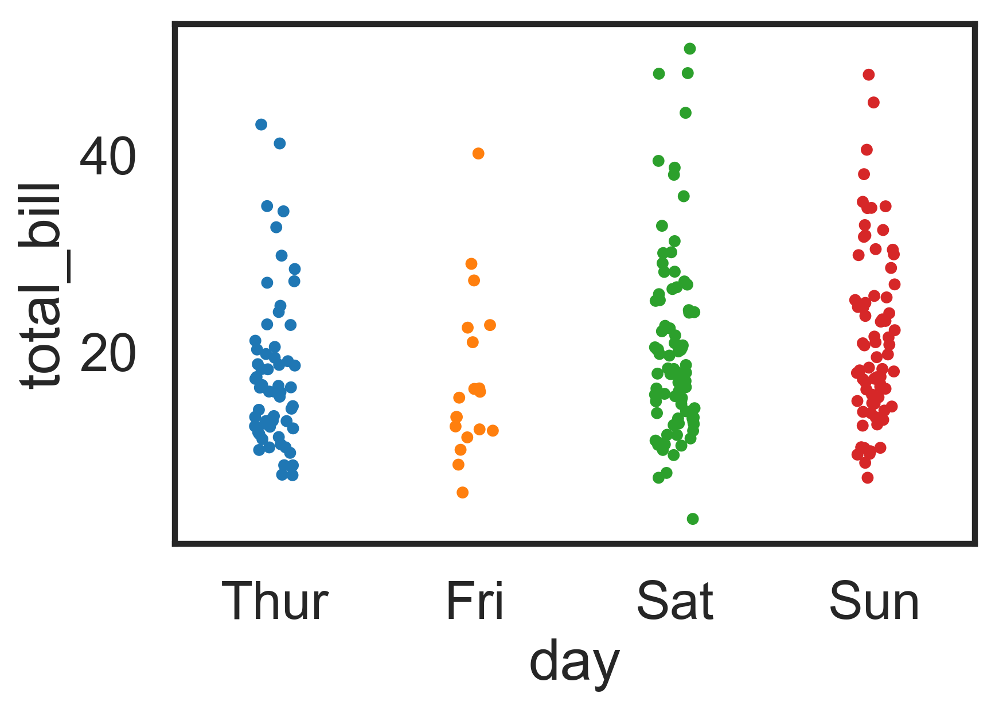

In [354]:
tips = sns.load_dataset("tips")
ax = sns.stripplot(x="day", y="total_bill", data=tips, jitter=True)

In [339]:
featurename

array(['hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31',
       'hsa_piR_000765|piRNA|hsa_piR_000765|hsa_piR_000765|hsa_piR_000765|0|31',
       'hsa_piR_004153|piRNA|hsa_piR_004153|hsa_piR_004153|hsa_piR_004153|0|32',
       'hsa-miR-99a-5p|miRNA|hsa-miR-99a-5p|hsa-miR-99a-5p|hsa-miR-99a-5p|0|22',
       'hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p|hsa-miR-128-3p|0|21',
       'hsa-miR-129-5p|miRNA|hsa-miR-129-5p|hsa-miR-129-5p|hsa-miR-129-5p|0|21',
       'hsa_piR_020829|piRNA|hsa_piR_020829|hsa_piR_020829|hsa_piR_020829|0|32',
       'hsa-miR-22-3p|miRNA|hsa-miR-22-3p|hsa-miR-22-3p|hsa-miR-22-3p|0|22',
       'hsa-miR-320a-3p|miRNA|hsa-miR-320a-3p|hsa-miR-320a-3p|hsa-miR-320a-3p|0|22',
       'hsa-miR-181a-5p|miRNA|hsa-miR-181a-5p|hsa-miR-181a-5p|hsa-miR-181a-5p|0|23',
       'hsa-miR-9-3p|miRNA|hsa-miR-9-3p|hsa-miR-9-3p|hsa-miR-9-3p|0|22',
       'hsa_piR_017716|piRNA|hsa_piR_017716|hsa_piR_017716|hsa_piR_017716|0|31',
       'hsa-miR-100-5p|miRNA|hsa

In [348]:
featurename.tolist()

['hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31',
 'hsa_piR_000765|piRNA|hsa_piR_000765|hsa_piR_000765|hsa_piR_000765|0|31',
 'hsa_piR_004153|piRNA|hsa_piR_004153|hsa_piR_004153|hsa_piR_004153|0|32',
 'hsa-miR-99a-5p|miRNA|hsa-miR-99a-5p|hsa-miR-99a-5p|hsa-miR-99a-5p|0|22',
 'hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p|hsa-miR-128-3p|0|21',
 'hsa-miR-129-5p|miRNA|hsa-miR-129-5p|hsa-miR-129-5p|hsa-miR-129-5p|0|21',
 'hsa_piR_020829|piRNA|hsa_piR_020829|hsa_piR_020829|hsa_piR_020829|0|32',
 'hsa-miR-22-3p|miRNA|hsa-miR-22-3p|hsa-miR-22-3p|hsa-miR-22-3p|0|22',
 'hsa-miR-320a-3p|miRNA|hsa-miR-320a-3p|hsa-miR-320a-3p|hsa-miR-320a-3p|0|22',
 'hsa-miR-181a-5p|miRNA|hsa-miR-181a-5p|hsa-miR-181a-5p|hsa-miR-181a-5p|0|23',
 'hsa-miR-9-3p|miRNA|hsa-miR-9-3p|hsa-miR-9-3p|hsa-miR-9-3p|0|22',
 'hsa_piR_017716|piRNA|hsa_piR_017716|hsa_piR_017716|hsa_piR_017716|0|31',
 'hsa-miR-100-5p|miRNA|hsa-miR-100-5p|hsa-miR-100-5p|hsa-miR-100-5p|0|22',
 'hsa-miR-181b-5p|miRNA|hsa-m

In [350]:
em.iloc[featurename.tolist()]

ValueError: invalid literal for int() with base 10: 'hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31'

In [347]:
em.index.get_loc(featurename.tolist())

TypeError: '['hsa_piR_020326|piRNA|hsa_piR_020326|hsa_piR_020326|hsa_piR_020326|0|31', 'hsa_piR_000765|piRNA|hsa_piR_000765|hsa_piR_000765|hsa_piR_000765|0|31', 'hsa_piR_004153|piRNA|hsa_piR_004153|hsa_piR_004153|hsa_piR_004153|0|32', 'hsa-miR-99a-5p|miRNA|hsa-miR-99a-5p|hsa-miR-99a-5p|hsa-miR-99a-5p|0|22', 'hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p|hsa-miR-128-3p|0|21', 'hsa-miR-129-5p|miRNA|hsa-miR-129-5p|hsa-miR-129-5p|hsa-miR-129-5p|0|21', 'hsa_piR_020829|piRNA|hsa_piR_020829|hsa_piR_020829|hsa_piR_020829|0|32', 'hsa-miR-22-3p|miRNA|hsa-miR-22-3p|hsa-miR-22-3p|hsa-miR-22-3p|0|22', 'hsa-miR-320a-3p|miRNA|hsa-miR-320a-3p|hsa-miR-320a-3p|hsa-miR-320a-3p|0|22', 'hsa-miR-181a-5p|miRNA|hsa-miR-181a-5p|hsa-miR-181a-5p|hsa-miR-181a-5p|0|23', 'hsa-miR-9-3p|miRNA|hsa-miR-9-3p|hsa-miR-9-3p|hsa-miR-9-3p|0|22', 'hsa_piR_017716|piRNA|hsa_piR_017716|hsa_piR_017716|hsa_piR_017716|0|31', 'hsa-miR-100-5p|miRNA|hsa-miR-100-5p|hsa-miR-100-5p|hsa-miR-100-5p|0|22', 'hsa-miR-181b-5p|miRNA|hsa-miR-181b-5p|hsa-miR-181b-5p|hsa-miR-181b-5p|0|23', 'hsa-let-7i-5p|miRNA|hsa-let-7i-5p|hsa-let-7i-5p|hsa-let-7i-5p|0|22', 'ENSG00000201778.1|Y_RNA|Y_RNA|peak_632|ENST00000364908.1|0|40', 'hsa-miR-9-5p|miRNA|hsa-miR-9-5p|hsa-miR-9-5p|hsa-miR-9-5p|0|23', 'hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22', 'hsa-miR-21-5p|miRNA|hsa-miR-21-5p|hsa-miR-21-5p|hsa-miR-21-5p|0|22', 'hsa-miR-30d-5p|miRNA|hsa-miR-30d-5p|hsa-miR-30d-5p|hsa-miR-30d-5p|0|22']' is an invalid key

## pie plot of RNA ratio

In [8]:
def gradient_func(val):
    return '<span style="background: linear-gradient(90deg, #d65f5f {0}%, transparent 0%)">{0:.3f}</span>'.format(val)

if sequencing_type == 'short': 
    table_percent = table_ratio*100
    display(table_percent.style.format(gradient_func))
elif sequencing_type == 'long': 
    table_percent_1,table_percent_2 = table_ratio_1*100, table_ratio_2*100
    display(table_percent_1.style.format(gradient_func))
    display(table_percent_2.style.format(gradient_func))

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,29.323,25.620,24.147,1.730,0.109,12.908,0.789,0.034,0.550,0.476,0.166,0.159,0.204,1.022,1.426,0.001,1.337
Sample_1S10,21.062,31.672,27.176,1.144,0.078,12.032,0.398,0.027,0.577,0.518,0.198,0.168,0.230,1.260,1.544,0.001,1.915
Sample_1S11,24.279,30.170,26.028,1.358,0.092,10.328,0.488,0.031,0.651,0.608,0.229,0.192,0.257,1.400,1.619,0.002,2.268
Sample_1S12,29.652,29.151,24.036,1.415,0.119,10.471,0.579,0.043,0.527,0.439,0.135,0.136,0.206,0.947,1.353,0.001,0.791
Sample_1S13,19.085,26.837,29.620,0.963,0.070,19.208,0.461,0.031,0.457,0.313,0.114,0.127,0.136,0.693,1.064,0.001,0.820
Sample_1S14,22.268,19.726,33.466,1.066,0.084,18.958,0.491,0.116,0.481,0.299,0.110,0.122,0.139,0.707,1.185,0.001,0.779
Sample_1S15,19.753,19.648,34.547,1.136,0.073,20.162,0.390,0.027,0.503,0.329,0.130,0.141,0.152,0.802,1.253,0.001,0.952
Sample_1S16,21.120,27.214,29.601,1.330,0.075,15.721,0.431,0.031,0.493,0.377,0.139,0.137,0.161,0.853,1.257,0.001,1.060
Sample_1S17,27.270,22.589,29.355,1.283,0.097,14.406,0.537,0.035,0.505,0.367,0.123,0.141,0.168,0.907,1.347,0.001,0.867
Sample_1S18,25.572,22.845,28.515,1.341,0.094,14.552,0.543,0.037,0.694,0.580,0.213,0.195,0.245,1.235,1.587,0.002,1.752


In [9]:
def plot_pie(data, rnanames):
    '''
    data: table_ratio
    rnanames: rna type names
    adjustment: merge RNA with small percent together
    '''
    from bokeh.io import output_file, show
    from bokeh.palettes import Category20
    from bokeh.plotting import figure
    from bokeh.transform import cumsum
    x = np.array(rnanames)
    y = np.array(data.loc[:,x].mean())+10e-8
    z_ = np.array([x[i] + str(' {:.2f}'.format(y[i]*100)+'%') for i in range(y.shape[0])])
    z = np.array([float('{:.10f}'.format(y[i]*100)) for i in range(y.shape[0])])
    labels = rnanames
    dataframe = pd.DataFrame(np.concatenate((x.reshape(-1,1),z.reshape(-1,1),z_.reshape(-1,1)),axis=1))
    dataframe.columns=['rna','percent','label']
    dataframe["percent"] = pd.to_numeric(dataframe["percent"])
    dataframe['angle'] = dataframe['percent']/dataframe['percent'].sum() * 2*pi
    dataframe['color'] = Category20[len(x)]
    p = figure(plot_height=500, title="Pie Chart", toolbar_location=None,
               tools="hover", tooltips="@label", x_range=(-0.5, 1.0))
    p.wedge(x=0.14, y=1, radius=0.45,
            start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
            line_color="black", fill_color='color', legend="label", source=dataframe)
    p.axis.axis_label=None
    p.axis.visible=False
    p.grid.grid_line_color = None
    show(p)
def plot_for_pie(sequencing_type='short',by_sample=False):
    if by_sample:
        if sequencing_type == 'short': 
            for i in range(table_ratio.shape[0]):
                plot_pie(pd.DataFrame(table_ratio.iloc[i]).T, rnanames)
        elif sequencing_type == 'long': 
            for i in range(table_ratio.shape[0]):
                plot_pie(pd.DataFrame(table_ratio_1.iloc[i]).T, rnanames_1)
                plot_pie(pd.DataFrame(table_ratio_2.iloc[i]).T, rnanames_2)
    else:
        if sequencing_type == 'short': 
            plot_pie(table_ratio, rnanames)
        elif sequencing_type == 'long': 
            plot_pie(table_ratio_1, rnanames_1)
            plot_pie(table_ratio_2, rnanames_2)
            
plot_for_pie(sequencing_type='short',by_sample=False)

## boxplot of rna ratio

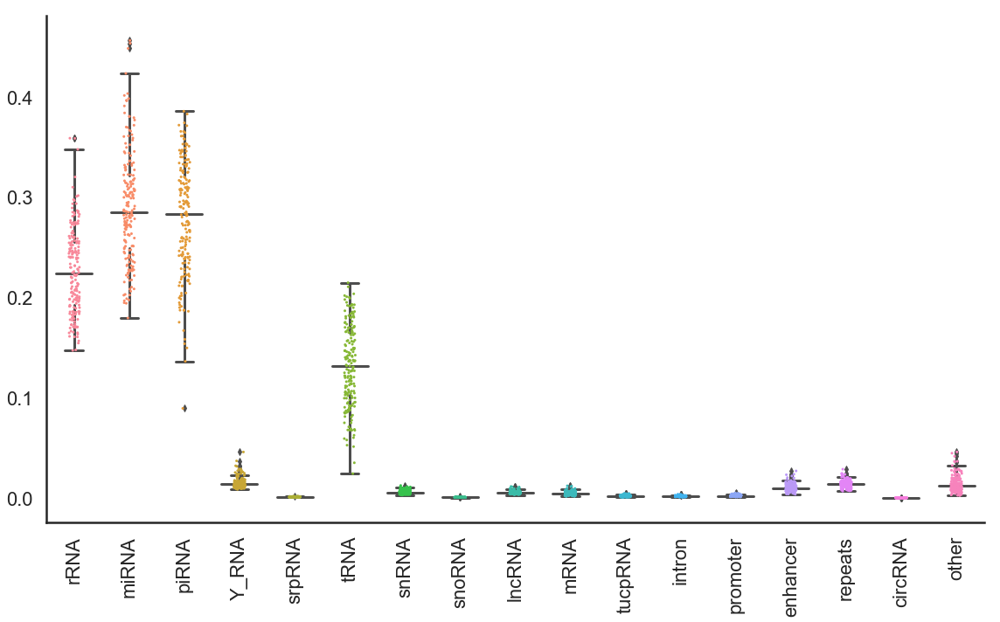

<Figure size 432x288 with 0 Axes>

In [10]:
def plot_ratio_boxplot(data, rnanames, points_show = True, width=7, height=4, savefig=False):
    '''
    data: table_ratio
    rnanames: rna type names
    points_show: plot scatter points too
    '''
    fig, ax = plt.subplots(figsize=(width, height))
    sns.boxplot(data = data,ax=ax,boxprops=dict(alpha=.001),color='gray',width=0.65,saturation=0.01)
    if points_show:
        sns.stripplot(data = data,ax=ax,size=3, edgecolor='black')
    
    ax.set_xticklabels(rnanames,rotation=90)
    #ax.set_yticklabels(['{:.1f}%'.format((i-1)*10) for i in range(10)],fontsize=20,fontweight='bold')
    fig.tight_layout()
    if savefig:
        fig.savefig(plot_save_path+'rna_ratio_box_plot.png', bbox_inches='tight')



if sequencing_type == 'short': 
    plot_ratio_boxplot(table_ratio, rnanames, points_show = True, width=16, height=10, savefig=False)
elif sequencing_type == 'long': 
    plot_ratio_boxplot(table_ratio_1, rnanames_1, points_show = True, 
                   width=30, height=10, savefig=False)
    plot_ratio_boxplot(table_ratio_2, rnanames_2, points_show = True, 
                   width=30, height=10, savefig=False)



## line plot of rna length

In [24]:
def plot_length_line(data, rnanames, width=7, height=10, savefig=False):
    '''
    data: length_table
    rnanames: rna type names
    '''
    length = np.array(data.T)
    fig,ax=plt.subplots(length.shape[0],1,figsize=(width, height))
    for i in range(length.shape[0]):
        ax[i].plot(length[i],label=data.columns[i], color=tableau20[i],linewidth=2)
        ax[i].legend(loc='upper right')
        ax[i].set_xticks(np.arange(0, data.shape[0],5))
        ax[i].set_xticklabels(np.arange(data.index[0], data.index[-1],5))
        std_plot(ax[i],'','')
        legend = ax[i].legend(prop=fontlegend,
              bbox_to_anchor=None,
              borderpad=1,
              edgecolor="#000000",fancybox=False)
        ax[i].legend_.get_frame()._linewidth=0.5
        legend.get_title().set_fontweight('normal')
        legend.get_title().set_fontsize(6.5)
        ax[i].set_ylim([0,0.6])
        #if i != 10:
        #    ax[i].spines['bottom'].set_visible(False)
        #    ax[i].set_xticks([])
    if savefig:
        fig.savefig(plot_save_path+'rna_length_line_plot.eps', bbox_inches='tight')
    embed_pdf_figure()
    
plot_length_line(length_table, rnanames, width=7, height=length_table.shape[1]*5, savefig=False)

In [66]:
plot_save_path

'output/scirep/plots/'

In [69]:
plot_length_line(length_table, rnanames, width=7, height=length_table.shape[1], savefig=False)

## 3D barplot of rna length

In [13]:
def plot_3d(width=25, height=16,  azim = 45, elev = 32,savefig=False):
    '''
    data: length_table
    '''
    data = length_table
    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure(figsize=(width,height))
    ax1 = fig.gca(projection="3d")
    num = data.shape[1]
    count_ = data.shape[0]
    xpos = np.repeat(np.arange(1,count_+1),num).reshape(count_,-1).T.ravel()
    ypos = np.repeat(range(num),count_).ravel()
    num_elements = len(xpos)
    zpos = np.zeros(count_*num)
    dx = np.ones(count_*num)/5
    dy = np.ones(count_*num)/5
    dz = np.array(data.T).ravel()
    for i in range(num):
        ax1.bar3d(xpos[count_*i:count_*(i+1)], ypos[count_*i:count_*(i+1)], zpos[count_*i:count_*(i+1)],
                  dx[count_*i:count_*(i+1)], dy[count_*i:count_*(i+1)],dz[count_*i:count_*(i+1)], color=(np.array(tableau20))[:num][i],alpha=0.9)
    plt.xticks(range(count_), [str(i+16) for i in range(count_)], color='red')
    ax1.set_yticks(range(num))
    ax1.set_yticklabels(data.columns, color='blue')
    for color,tick in zip((np.array(tableau20)/float(256))[:num],ax1.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    ax1.view_init(azim=azim,elev=elev)  
    ax1.xaxis.pane.fill = False
    ax1.yaxis.pane.fill = False
    ax1.zaxis.pane.fill = False
    ax1.xaxis.pane.set_edgecolor('w')
    ax1.yaxis.pane.set_edgecolor('w')
    ax1.zaxis.pane.set_edgecolor('w')
    fig.tight_layout()
    if savefig:
        fig.savefig(plot_save_path+'rna_length_3D_barplot.png', bbox_inches='tight')

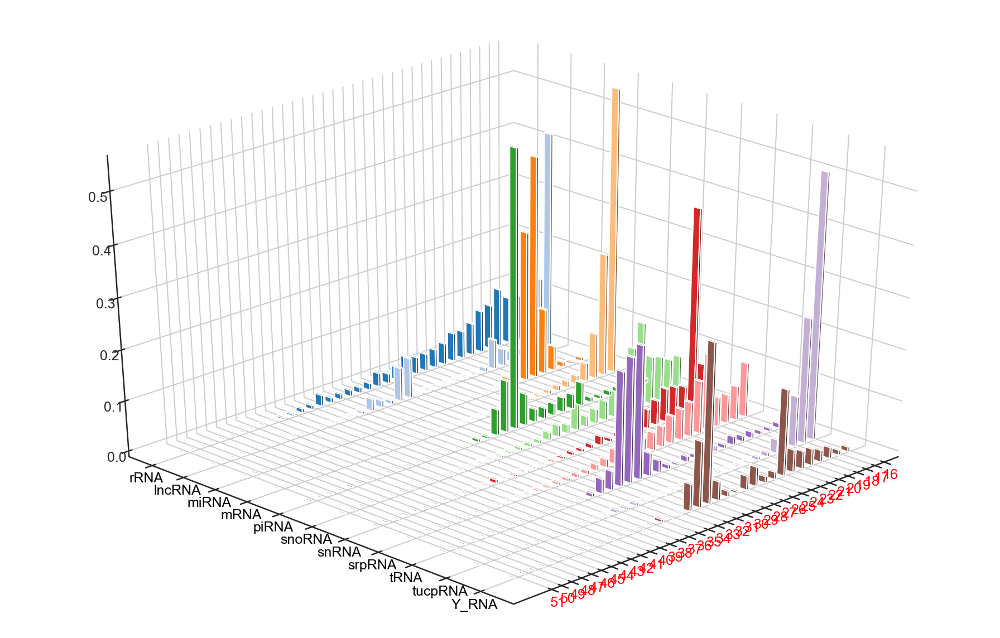

In [14]:
plot_3d(width=25, height=16, savefig=False, azim = 45, elev = 32)

In [15]:
interact(plot_3d,
    width =FloatSlider(min=4,max=40,step=1,value=25),
    height= FloatSlider(min=4,max=30,step=1,value=16),
    azim= FloatSlider(min=0,max=180,step=2,value=45),
    elev= FloatSlider(min=0,max=180,step=1,value=32))

interactive(children=(FloatSlider(value=25.0, description='width', max=40.0, min=4.0, step=1.0), FloatSlider(value=16.0, description='height', max=30.0, min=4.0, step=1.0), FloatSlider(value=45.0, description='azim', max=180.0, step=2.0), FloatSlider(value=32.0, description='elev', max=180.0, step=1.0), Checkbox(value=False, description='savefig'), Output()), _dom_classes=('widget-interact',))

<function __main__.plot_3d(width=25, height=16, azim=45, elev=32, savefig=False)>

## stack bar plot of rna counts and ratio

In [16]:
from matplotlib.colors import LinearSegmentedColormap
def stack_bar_ratio(table, statistics = 'ratio',savefig=False):   
    fig,ax=plt.subplots(figsize=(50,10))
    table.plot(kind='bar', stacked=True,ax=ax,width=1,
                legend=True,colormap=matplotlib.colors.ListedColormap ( tableau20))
    ax.legend(bbox_to_anchor=(1,1),fontsize='large')#, loc="lower right",
    #ax.set_title('Stacked Bar plot',fontsize=40)
    if savefig:
        fig.savefig(plot_save_path+statistics+'_stack_barplot.png', bbox_inches='tight')

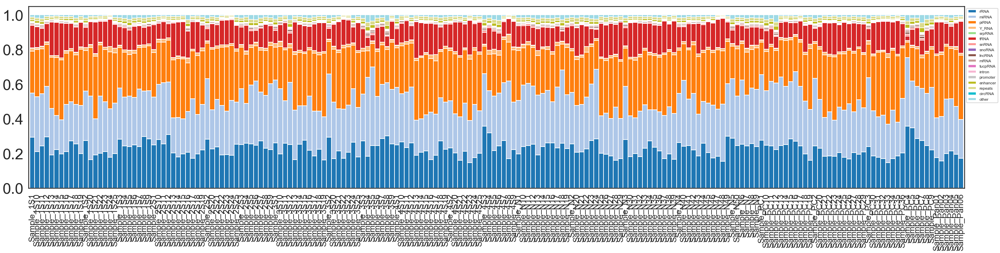

In [17]:
if sequencing_type == 'short': 
    stack_bar_ratio(table_ratio)
elif sequencing_type == 'long': 
    stack_bar_ratio(table_ratio_1)
    stack_bar_ratio(table_ratio_2)

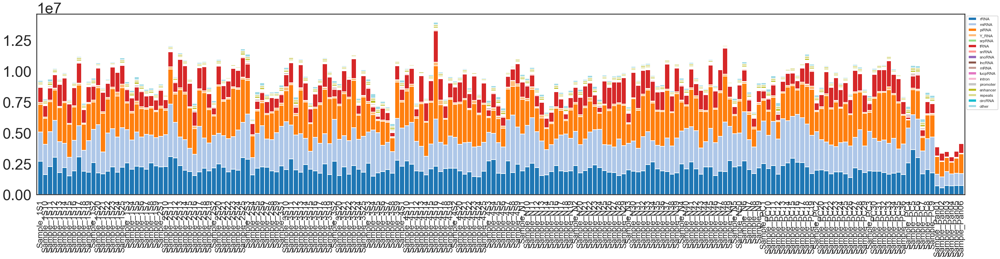

In [18]:
if sequencing_type == 'short': 
    stack_bar_ratio(table_count)
elif sequencing_type == 'long': 
    stack_bar_ratio(table_count_1)
    stack_bar_ratio(table_count_2)

## bar plot of RNA by sample

In [19]:
def plot_bar_by_rna(ax,table,rnaname,savefig=False, statistics = 'ratio',height = 4, width=20):
    '''
    table: ratio or count table, rows are rna type
    statistics: ratio or count
    '''
    table = table.T
    count = np.array(table[table.index ==rnaname]).ravel()
    #fig,ax=plt.subplots(1,figsize=(width,height))
    counttable =  pd.DataFrame(np.concatenate((np.arange(1,table.shape[1]+1).reshape(-1,1),
                count[np.argsort(-count)].reshape(-1,1)),axis=1),columns=['sample',statistics])
    sns.barplot(ax=ax,x='sample',y=statistics,data = counttable,color=tableau20[np.random.randint(0,20)],alpha=1)
    ax.set_xticks(np.arange(0,table.shape[1],5))
    ax.set_xticklabels(np.arange(0,table.shape[1],5))
    ax.set_title(statistics+' of '+rnaname,fontsize=15)
    if savefig:
        fig.savefig(plot_save_path+'sample_'+rnaname+'_'+statistics+'_bar_plot.png', bbox_inches='tight')

In [20]:
def plot_bar_by_rna_total(table,datatype='ratio'):
    fignum= table.columns.shape[0]
    fig,ax=plt.subplots(fignum ,1,figsize=(20 , 4*fignum ))
    for i in range(fignum):
        plot_bar_by_rna(ax[i],table,table.columns[i],statistics = datatype)
    fig.tight_layout() 

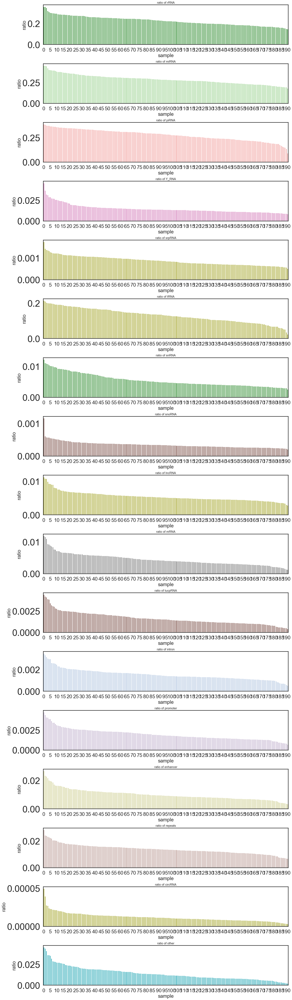

In [21]:
if sequencing_type == 'short': 
    plot_bar_by_rna_total(table_ratio,datatype='ratio')
elif sequencing_type == 'long': 
    plot_bar_by_rna_total(table_ratio_1,datatype='ratio')
    plot_bar_by_rna_total(table_ratio_2,datatype='ratio')

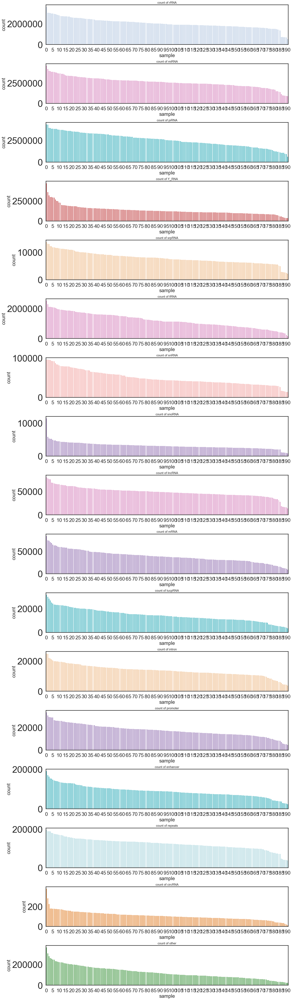

In [22]:
if sequencing_type == 'short': 
    plot_bar_by_rna_total(table_count,datatype='count')
elif sequencing_type == 'long': 
    plot_bar_by_rna_total(table_count_1,datatype='count')
    plot_bar_by_rna_total(table_count_2,datatype='count')

## FastQC

In [26]:
summary = pd.read_table('output/'+dataset+'/summary/fastqc.txt', sep='\t')
qc_status = summary.iloc[:, 9:]
qc_status.fillna('NA')
qc_status = qc_status.astype('str')
sample_ids = summary.sample_id
sections = qc_status.columns.values
def style_func(val):
    status, row, col = val.split('|')
    row, col = int(row), int(col)
    color = {'pass': 'green', 'fail': 'red', 'warn': 'orange'}.get(status, 'gray')
    return '<a href="../output/'+dataset+'/fastqc/{sample_id}_fastqc.html#M{section}" style="color: {color}">{status}</a>'.format(
        sample_id=sample_ids[row], color=color, status=status, section=col + 1)

pd.DataFrame(qc_status.values \
             + '|' + np.arange(qc_status.shape[0]).astype('str')[:, np.newaxis] \
             + '|' + np.arange(qc_status.shape[1]).astype('str')[np.newaxis, :],
             index=qc_status.index, columns=qc_status.columns) \
    .style.format(style_func)

,Basic Statistics,Per base sequence quality,Per tile sequence quality,Per sequence quality scores,Per base sequence content,Per sequence GC content,Per base N content,Sequence Length Distribution,Sequence Duplication Levels,Overrepresented sequences,Adapter Content,Kmer Content
0,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
1,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
2,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
3,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,fail
4,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
5,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
6,pass,pass,pass,pass,fail,fail,pass,pass,fail,fail,fail,fail
7,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
8,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
9,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan


## Sample QC
use PCA and tSNE to visualize outliters

In [28]:
def PCA_plot_basic(ax,data,method_PCA = True):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method_PCA == True:
        transform = PCA()
    else:
        transform = TSNE()
    X_pca = transform.fit_transform(X)
    ax.scatter(X_pca[:,0], X_pca[:,1], s=200,alpha=0.8 ,edgecolors = 'b',color='r')
def sample_qc_visualize_outlier(original_mx,table_ratio,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(16, 8))
    if method=='PCA':
        method_PCA = True
    elif method=='tSNE':
        method_PCA = False
    PCA_plot_basic(ax[0],original_mx, method_PCA)
    PCA_plot_basic(ax[1],table_ratio, method_PCA)

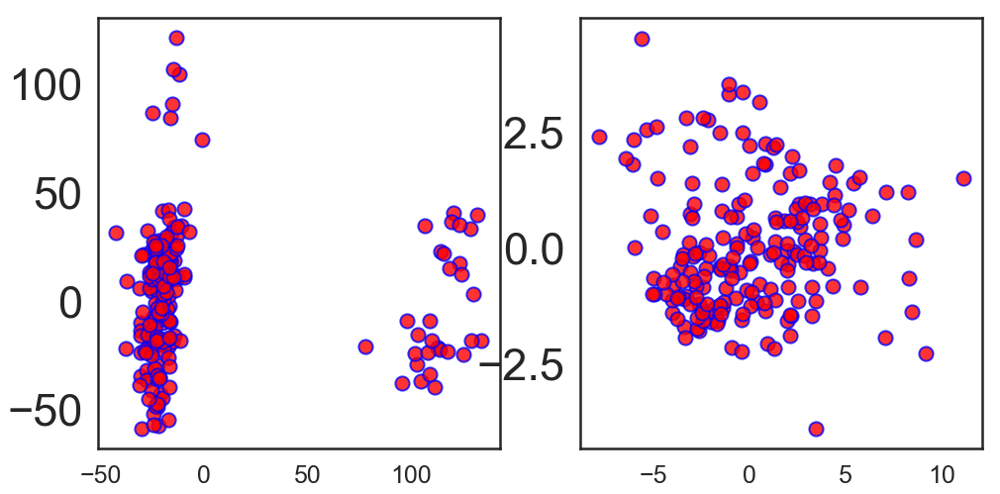

In [29]:
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='PCA')

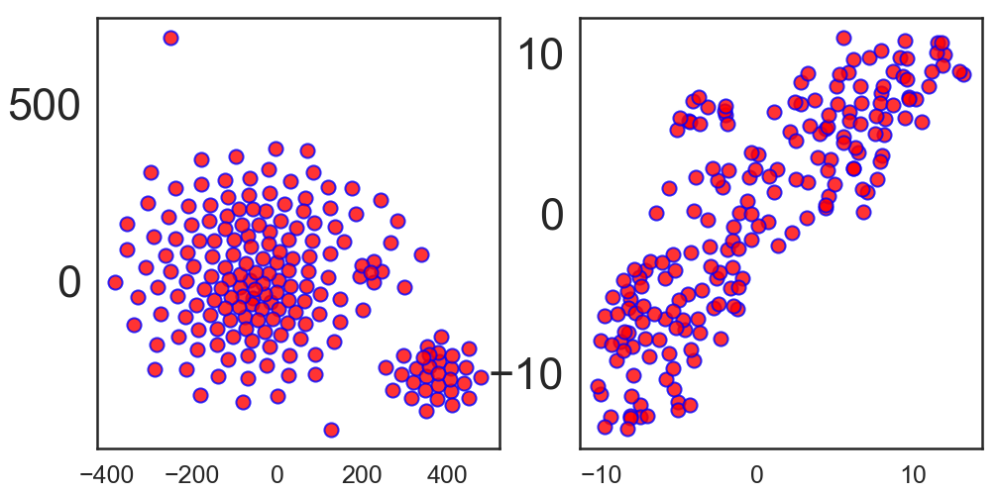

In [30]:
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='tSNE')

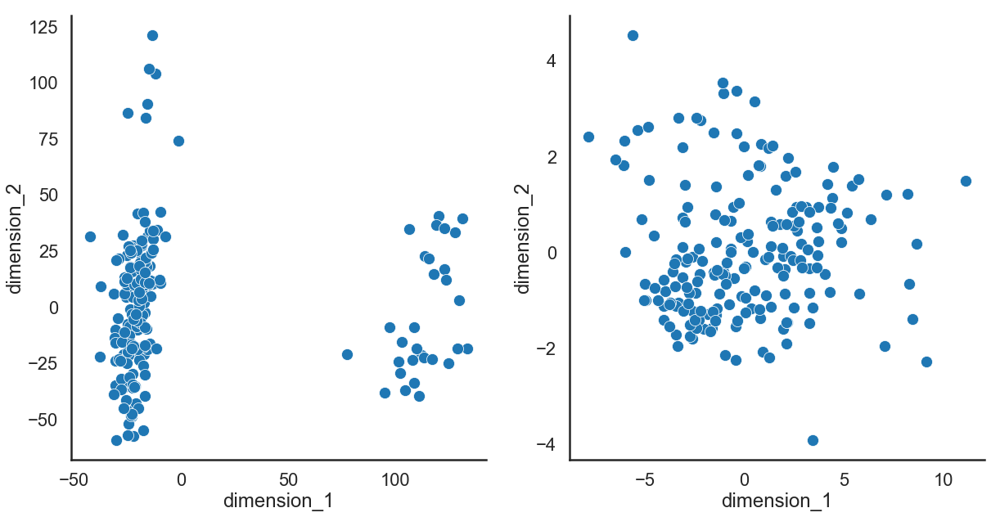

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [27]:
def PCA_plot_basic(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.columns = ['dimension_1','dimension_2']
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                   s=200)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
def sample_qc_visualize_outlier(original_mx,table_ratio,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(20, 10))
    if method=='PCA':
        method_PCA = True
    elif method=='tSNE':
        method_PCA = False
    PCA_plot_basic(ax[0],original_mx, method_PCA)
    PCA_plot_basic(ax[1],table_ratio, method_PCA)
    
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='PCA')

# Matrix processing

## filtering effect

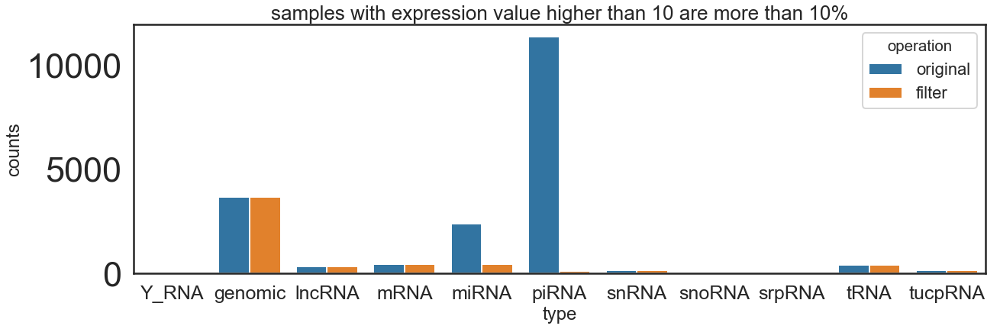

In [31]:
def plot_bar_for_filter(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10 ):
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))

    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(20 , 6))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    ax.set_title('samples with expression value higher than '+str(counts_threshold) +
                    ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)
plot_bar_for_filter(original_mx,cutoff_ratio = 0.1 ,counts_threshold = 10 )

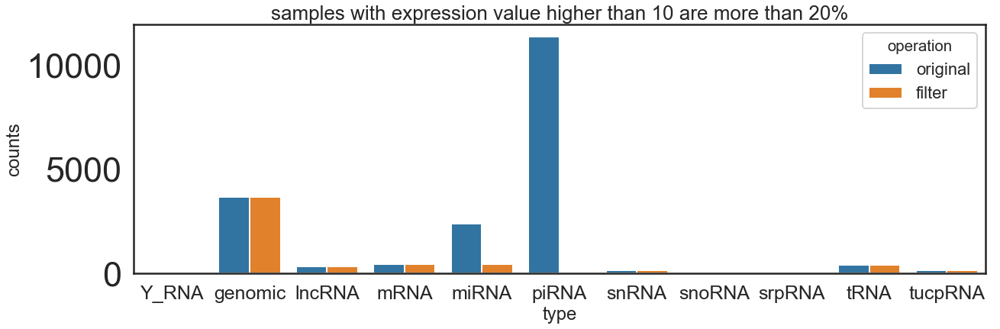

In [32]:
plot_bar_for_filter(original_mx,cutoff_ratio = 0.2 ,counts_threshold = 10 )

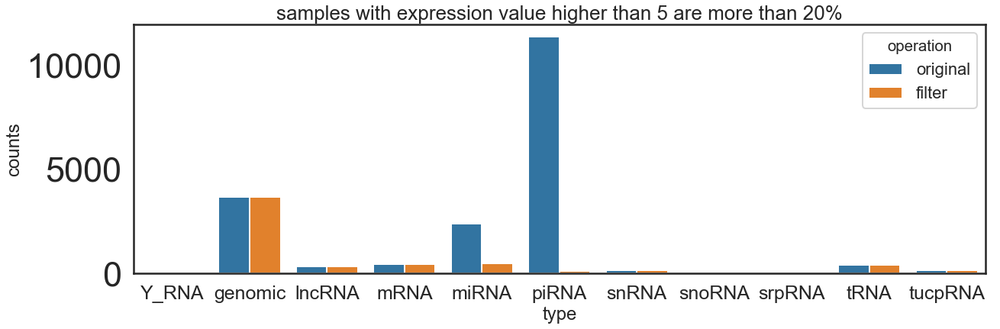

In [33]:
plot_bar_for_filter(original_mx,cutoff_ratio = 0.2 ,counts_threshold = 5 )

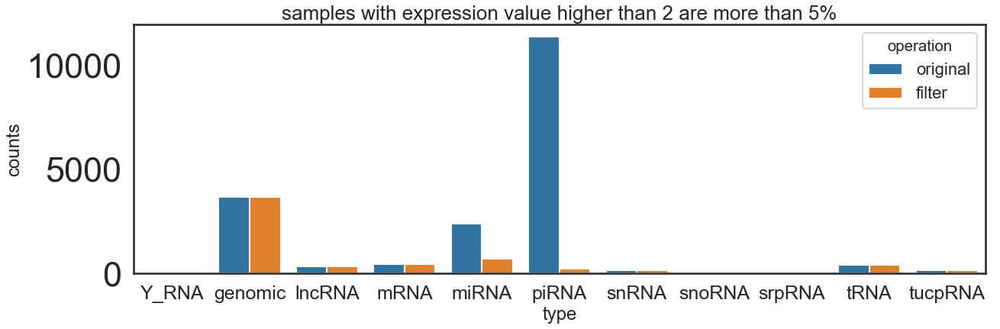

In [34]:
plot_bar_for_filter(original_mx,cutoff_ratio = 0.05 ,counts_threshold = 2 )

In [371]:
matrix_processing_path = 'output/'+dataset+'/matrix_processing/'
imputation_method = 'scimpute_count'
normalization_method = 'Norm_SCnorm'
batch_removal_method = 'Batch_RUV'
batch_index = 'null'
class_info = 'data/'+dataset+'/sample_classes.txt'
batch_info = 'data/'+dataset+'/batch_info.txt'
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'

def null_name(string):
    if string =='null':
        return '.null'
    else:
        return '.'+string
    
def generate_processed_filename(original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index): 
    imputename = null_name(imputation_method)
    normname = null_name(normalization_method)
    batchname = null_name(batch_removal_method)
    if batch_index=='null':
        batchindname = ''
    else:
        batchindname = '_'+batch_index
    return'filter'+imputename+normname+batchname+batchindname+'.'+original_mx_file.split('/')[-1]

original_mx = pd.read_table(original_mx_file,index_col=0)
processed_mx = pd.read_table(matrix_processing_path+generate_processed_filename(\
            original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index),index_col=0)
sample_class = pd.read_table(class_info,sep='\t',index_col=0)
batchtable = pd.read_table(batch_info,sep='\t',index_col=0)


## relative log expression

In [36]:
Image(filename='/home/xieyufeng/exSeek/pdf/RLE.png') 

FileNotFoundError: [Errno 2] No such file or directory: '/home/xieyufeng/exSeek/pdf/RLE.png'

## expression vs read depth

In [37]:
files = os.listdir('/home/xieyufeng/exSeek/pdf/')
selected_files = list(filter(lambda x: x.startswith('mat_'),files))
for i in selected_files:
    display (i.split('.')[0][4:])
    display(Image(filename='/home/xieyufeng/exSeek/pdf/'+i))

## PCA, tSNE and UMAP

In [38]:
def alignment_score(X, y, K=10):
    N = X.shape[0]
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    score = 1.0 - (np.mean(same_class_fractions) - K/N)/(K - K/N)
    print (same_class_fractions.shape,np.mean(same_class_fractions),K/N,neighbor_classes)
    return score,


In [39]:
def knn_score(X, y, K=10):
    N = X.shape[0]
    assert K < N
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    classes, counts = np.unique(y, return_counts=True)
    classes = np.argmax(y.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    counts = np.take(counts, classes)
    mean_r = K/(N - 1)*counts
    max_r = np.minimum(K, counts)
    #print (same_class_fractions.shape,mean_r.shape,max_r.shape)
    #scores = (np.mean(same_class_fractions) - mean_r)/(max_r - mean_r)
    scores = (same_class_fractions - mean_r)/(max_r - mean_r)
    #print(scores)
    return scores.mean()
def convert_label_to_int(sample_class):
    classes, counts = np.unique(sample_class, return_counts=True)
    classes = np.argmax(sample_class.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    return classes
def unsupervised_clustering_accuracy(y, y_pred):
    """
    Unsupervised Clustering Accuracy
    """
    from sklearn.utils.linear_assignment_ import linear_assignment
    assert len(y_pred) == len(y)
    u = np.unique(np.concatenate((y, y_pred)))
    n_clusters = len(u)
    mapping = dict(zip(u, range(n_clusters)))
    reward_matrix = np.zeros((n_clusters, n_clusters), dtype=np.int64)
    for y_pred_, y_ in zip(y_pred, y):
        if y_ in mapping:
            reward_matrix[mapping[y_pred_], mapping[y_]] += 1
    cost_matrix = reward_matrix.max() - reward_matrix
    ind = linear_assignment(cost_matrix)
    return sum([reward_matrix[i, j] for i, j in ind]) * 1.0 / y_pred.size, ind
def clustering_scores(X,y, prediction_algorithm='knn'):
    from sklearn.metrics import adjusted_rand_score as ARI
    from sklearn.metrics import normalized_mutual_info_score as NMI
    from sklearn.metrics import silhouette_score
    from sklearn.mixture import GaussianMixture as GMM
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    asw_score = silhouette_score(X, labels)
    nmi_score = NMI(labels, labels_pred)
    ari_score = ARI(labels, labels_pred)
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return asw_score, nmi_score, ari_score, uca_score

def uca_scores(X,y, prediction_algorithm='knn'):
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return uca_score

def get_clustering_score(data,sampleclass,method = 'PCA',prediction_algorithm='knn'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    #X_pca = transform.fit_transform(X)
    X_, y_ = X, sampleclass.loc[data.columns.values].values.ravel() 
    #knn_score_ = knn_score(X_, y_)
    #asw_score, nmi_score, ari_score, uca_score = clustering_scores(X_, y_, prediction_algorithm)
    uca_score = uca_scores(X_, y_, prediction_algorithm)
    return uca_score

## plot UCA score of different methods

In [40]:
uca_summary = pd.read_table('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/summary.txt',
                           index_col=0)
                            

In [41]:
uca_summary_table = pd.DataFrame(np.ndarray([uca_summary.shape[0],4]))
uca_summary_table.columns = ['imputation','normalization','batch_removal','uca_score']
for i in range(uca_summary.shape[0]):
    splittmp = uca_summary.index[i].split('.')
    uca_summary_table.iloc[i,0] = splittmp[1]
    uca_summary_table.iloc[i,1] = splittmp[2]
    uca_summary_table.iloc[i,2] = splittmp[3]
    uca_summary_table.iloc[i,3] = uca_summary.values[i]

In [42]:
display(uca_summary_table.groupby(uca_summary_table.columns[0]).mean())
display(uca_summary_table.groupby(uca_summary_table.columns[1]).mean())
display(uca_summary_table.groupby(uca_summary_table.columns[2]).mean())
uca_mean_summary = pd.concat((uca_summary_table.groupby(uca_summary_table.columns[0]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[1]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[2]).mean()))
uca_mean_summary =  uca_mean_summary.rename(index={'null': 'imputation_null'})

,uca_score
imputation,
null,0.376563
scimpute_count,0.373785
viper_count,0.379688


,uca_score
normalization,
Norm_CPM,0.376736
Norm_CPM_rm,0.364236
Norm_CPM_top,0.373611
Norm_RLE,0.380556
Norm_SCnorm,0.388889
Norm_TMM,0.376042


,uca_score
batch_removal,
Batch_Combat_1,0.349826
Batch_Combat_2,0.370081
Batch_Combat_3,0.346644
Batch_RUV,0.445602
Batch_null,0.371238


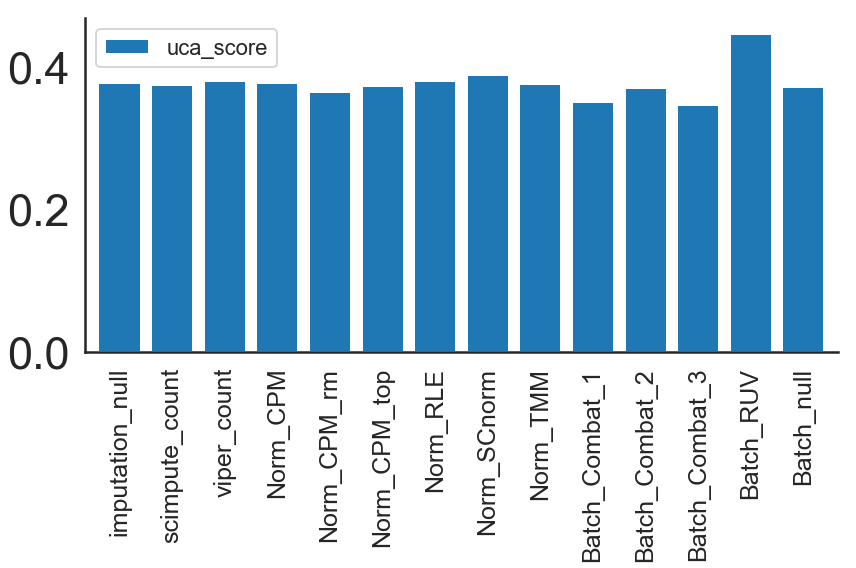

<Figure size 432x288 with 0 Axes>

In [43]:
fig, ax = plt.subplots(1,figsize=(12, 8))
uca_mean_summary.plot(kind='bar',ax=ax,width=0.8,
                legend=True)
fig.tight_layout()
plt.figure(linewidth=30.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

[Text(0, 0, 'imputation_null'),
 Text(1, 0, 'scimpute_count'),
 Text(2, 0, 'viper_count'),
 Text(3, 0, 'Norm_CPM'),
 Text(4, 0, 'Norm_CPM_rm'),
 Text(5, 0, 'Norm_CPM_top'),
 Text(6, 0, 'Norm_RLE'),
 Text(7, 0, 'Norm_SCnorm'),
 Text(8, 0, 'Norm_TMM'),
 Text(9, 0, 'Batch_Combat_1'),
 Text(10, 0, 'Batch_Combat_2'),
 Text(11, 0, 'Batch_Combat_3'),
 Text(12, 0, 'Batch_RUV'),
 Text(13, 0, 'Batch_null')]

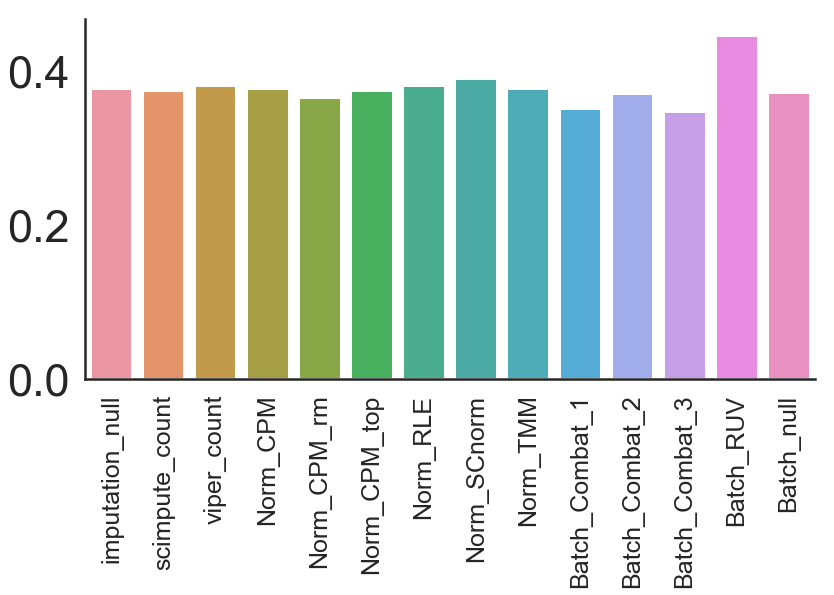

<Figure size 432x288 with 0 Axes>

In [44]:
fig, ax = plt.subplots(1,figsize=(12, 6))
sns.barplot(data=uca_mean_summary.T)
fig.tight_layout()
plt.figure(linewidth=30.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xticklabels(uca_mean_summary.index,rotation=90)

In [45]:
get_clustering_score(original_mx,sample_class)

0.4010416666666667

In [46]:
get_clustering_score(processed_mx,sample_class)

0.4166666666666667

In [47]:
def PCA_plot_with_uca_score(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    class_name = np.unique(sampleclass.label)
    
    for label, color in zip(class_name, 
                                tableau20[:class_name.shape[0]]):
        indices = np.nonzero(sampleclass.loc[data.columns].label == label)[0]
        ax.scatter(X_pca[indices, 0], X_pca[indices, 1], s=200,alpha=1 ,edgecolors = 'black',label=label)
    ax.legend(fontsize=10)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [48]:
def PCA_plot_with_uca_score_sns(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    classnum = np.unique(plot_table.iloc[:,2]).shape[0]
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                    palette=np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum],hue="class",s=600)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [49]:
def visualize_effect(original_mx,processed_mx,sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(40, 20))
    PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1],processed_mx,sample_class,method)

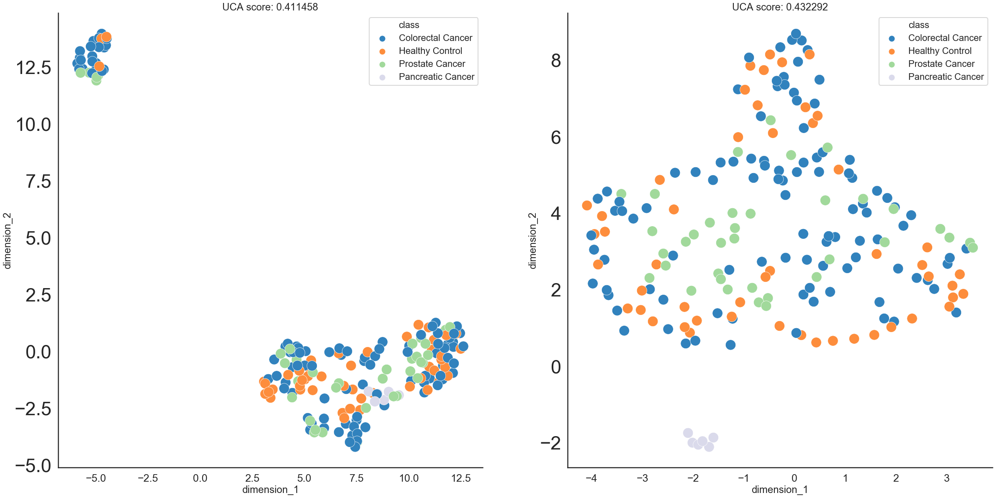

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [50]:
visualize_effect(original_mx,processed_mx,sample_class,method='UMAP')

In [60]:
best_methods = best_preprocess_methods['Normal-CRC']

In [61]:
impute_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+best_methods.split('.')[1]+'.'+exp_mx_name+'.txt')
normalize_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+best_methods.split('.')[1]+'.'+best_methods.split('.')[2]+'.'+exp_mx_name+'.txt',index_col=0)
batch_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+best_methods.split('.')[1]+'.'+best_methods.split('.')[2]+'.'+best_methods.split('.')[3]+'.'+exp_mx_name+'.txt',index_col=0)
processed_table = pd.read_table('output/'+dataset+'/matrix_processing/'+best_methods+'.txt',index_col=0)

In [52]:
def visualize_effect_all(original_mx,impute_mx, normalize_mx, batch_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(2,2,figsize=(30,30))
    PCA_plot_with_uca_score_sns(ax[0,0],original_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[0,1],impute_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1,0],normalize_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1,1],batch_mx,sample_class,method)
    

In [53]:
def visualize_effect_final(original_mx,final_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(30,15))
    PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    PCA_plot_with_uca_score_sns(ax[1],final_mx,sample_class,method)

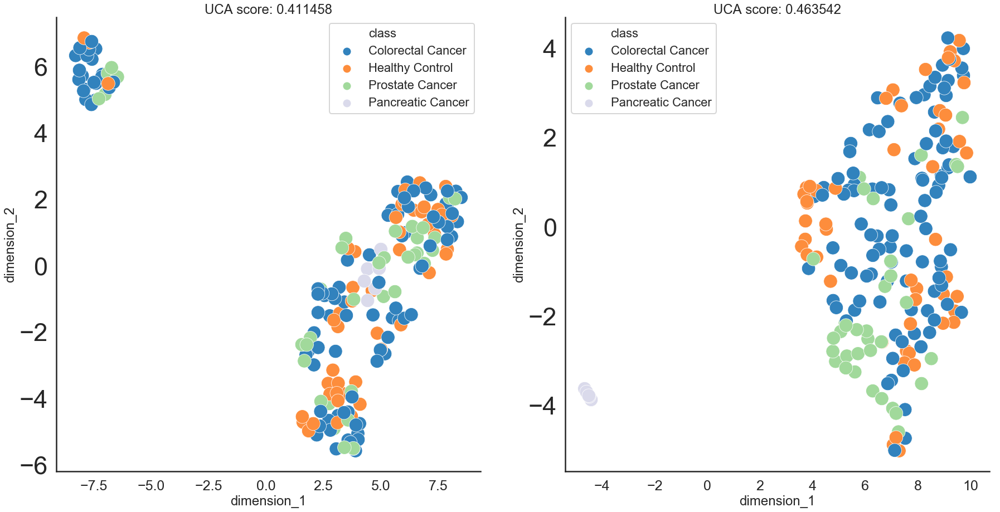

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [62]:
visualize_effect_final(original_mx,processed_table, sample_class,method='UMAP')

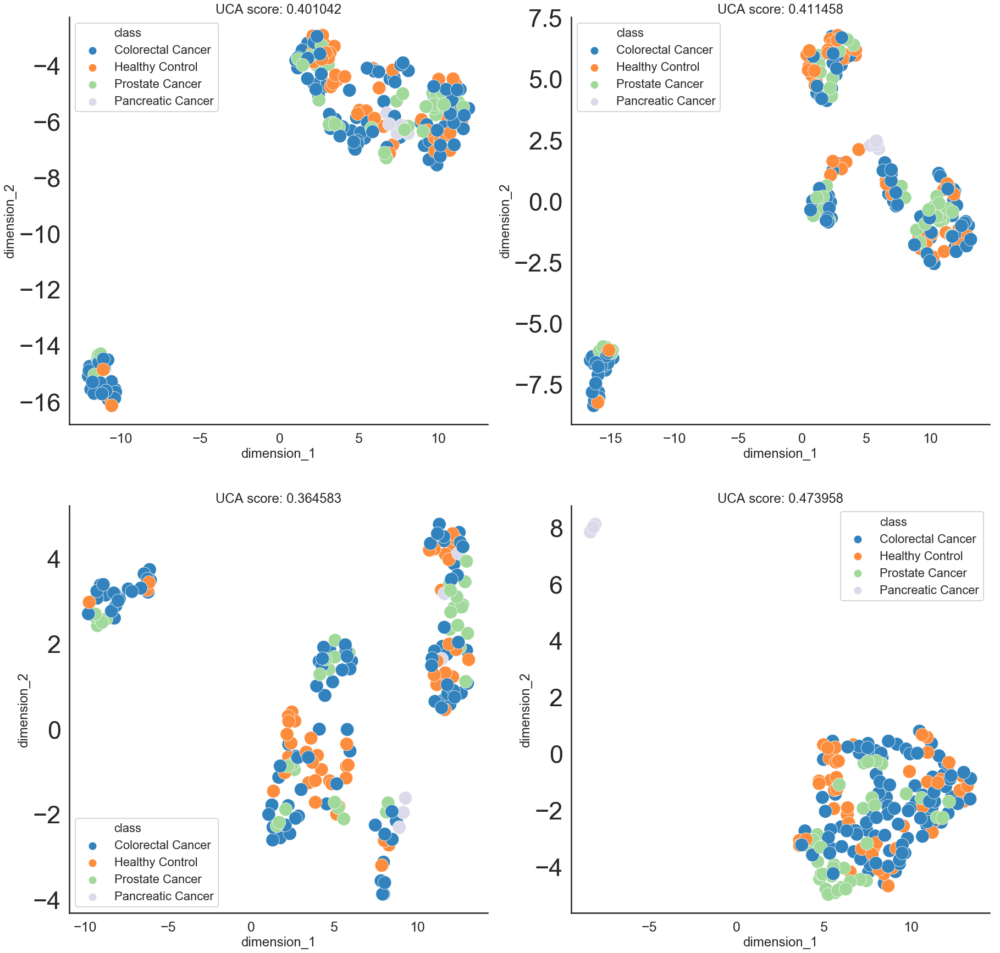

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [63]:
visualize_effect_all(original_mx, impute_table, normalize_table, batch_table, sample_class,method='UMAP')

## top K feature
- cumulative
- top k feature

### cumulative

In [64]:
def topk_cumsum_plot(data, topk=20):
    total_sum = data.sum().sum()
    cumsumvalue = np.cumsum(- np.sort(- np.sum(original_mx,axis=1))/total_sum)
    fig, ax = plt.subplots(figsize=(16, 5))
    ax.bar(np.arange(0,topk),cumsumvalue[:topk],color='r',alpha=0.5)
    ax.set_xticks(np.arange(0,topk))
    ax.set_xticklabels(np.arange(1,1+topk))
    ax.set_title('cumulative bar plot of top '+str(topk)+' feature')

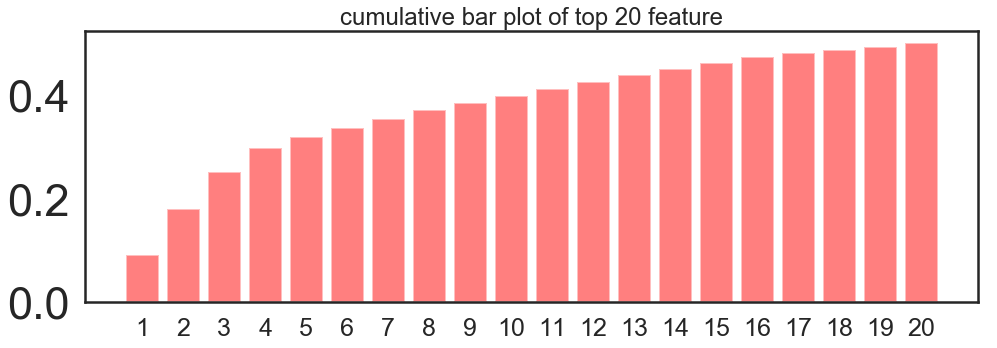

In [65]:
topk_cumsum_plot(processed_mx,topk=20)

### top k feature

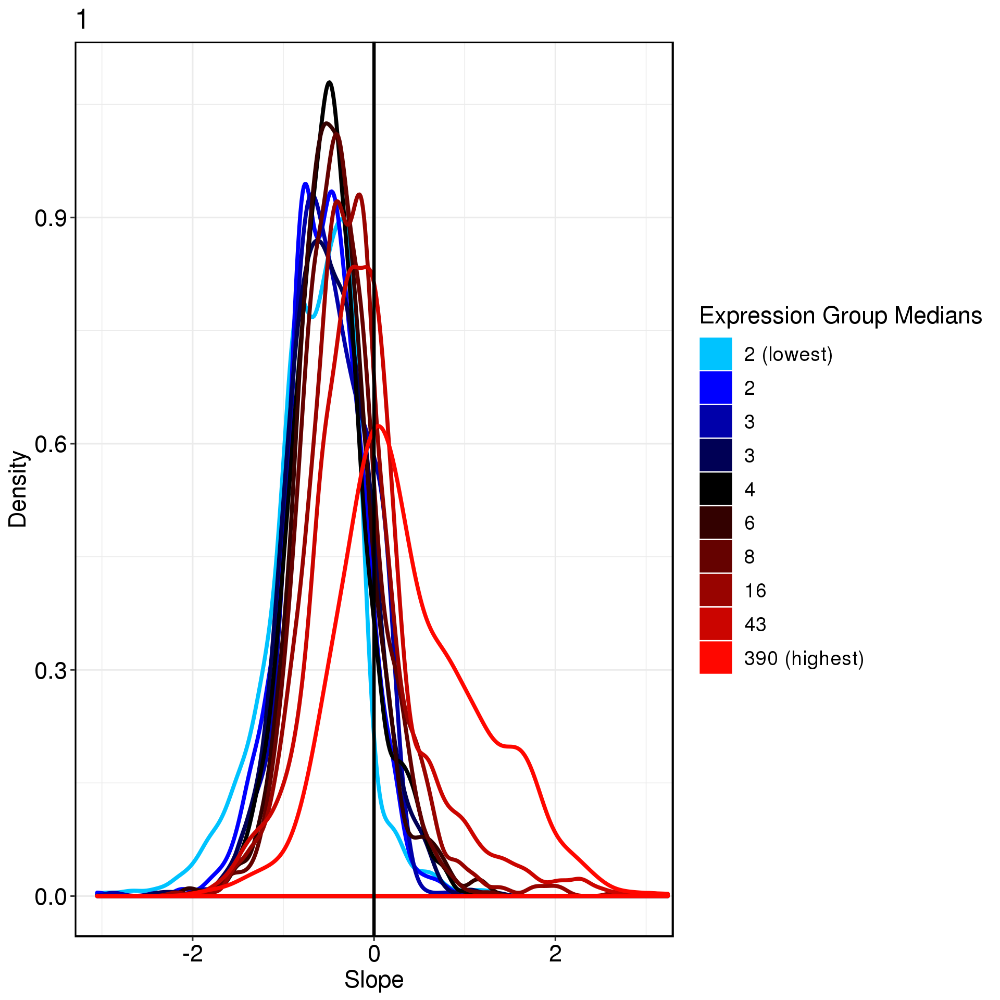

In [70]:
Image(filename='/home/xieyufeng/exSeek/png/plot_highest_exprs.png') 

## show batch
- counts
- by rna

In [66]:
def show_batch_total_counts(ax,batchtable,matrix, batchindex = 1):
    counts = matrix.sum()
    sumtable = pd.DataFrame(np.log(counts),columns=['log total counts'])
    sumtable_whole = pd.concat((sumtable,batchtable.loc[sumtable.index]),axis=1)
    #fig,ax=plt.subplots(figsize=(8,6))
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y='log total counts',ax=ax)
    #ax.set_title('Batch effect: '+batchname)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()

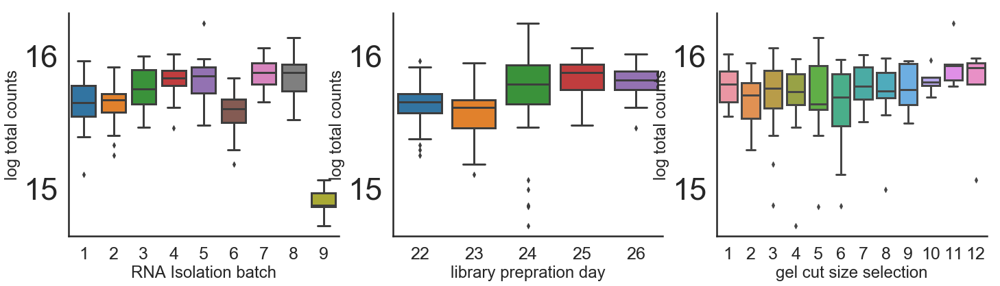

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [67]:
fig, ax = plt.subplots(1,3,figsize=(24, 6))
for  i in range(3):
    show_batch_total_counts(ax[i],batchtable, original_mx, batchindex = i)
plt.tight_layout()

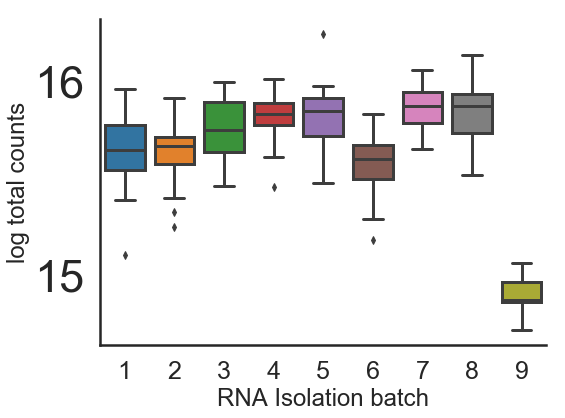

<Figure size 432x288 with 0 Axes>

In [68]:
fig, ax = plt.subplots(1,figsize=(8, 6))
show_batch_total_counts(ax,batchtable, original_mx, batchindex = 0)

In [69]:
def show_batch_sns(data,sampleclass,batchinfo,batch_ind=0):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    method = 'UMAP'
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')

    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    plot_table = pd.concat((plot_table,batchinfo.loc[plot_table.index]),axis=1)
    #display(plot_table)
    batchnum = np.unique(plot_table.iloc[:,3+batch_ind]).shape[0]
    
    fig, ax = plt.subplots(1,figsize=(20, 20))
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",style="class",
                    palette=list(np.array(Category20c[20]).reshape(4,-1).T.ravel())[:batchnum],
                    #palette=np.array(Category20c[20])[np.arange(0,20,3)],
                    hue=plot_table.columns[3+batch_ind],s=300,alpha=0.7)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


In [70]:
exosome_small_mx = pd.read_table('output/exosome_small/count_matrix/domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)


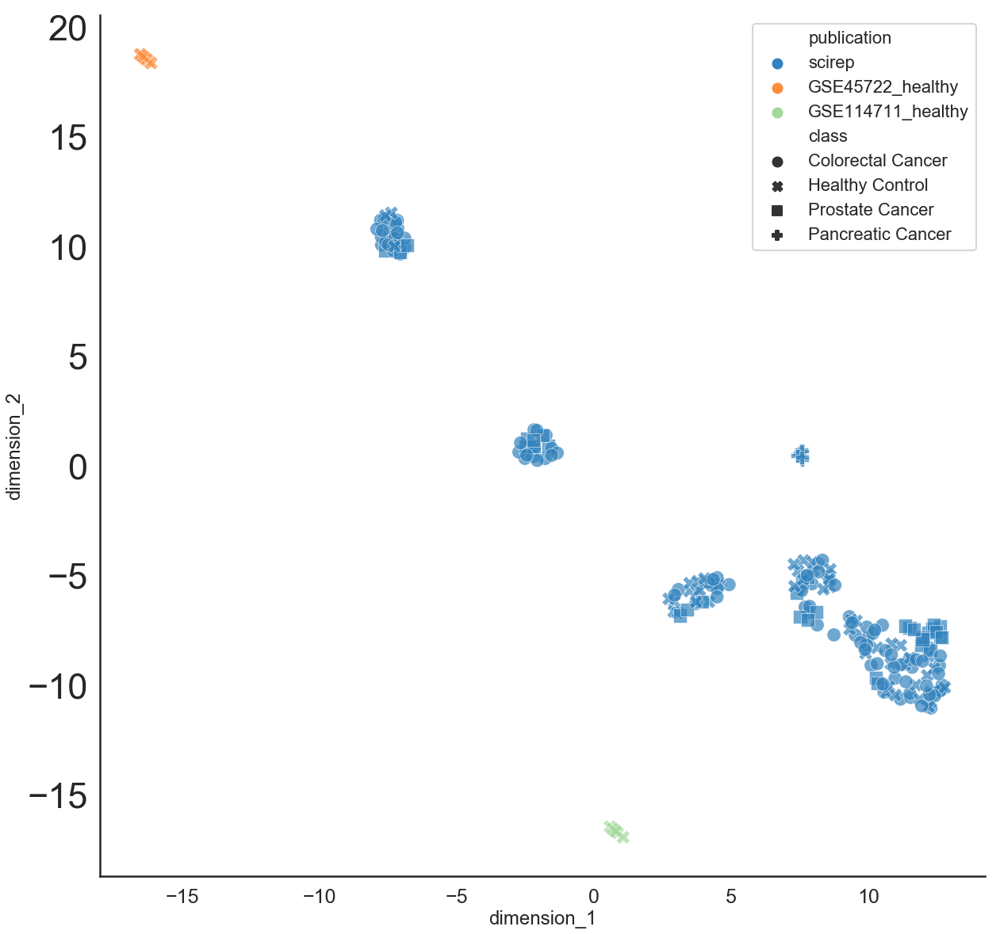

<Figure size 432x288 with 0 Axes>

In [71]:
show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)

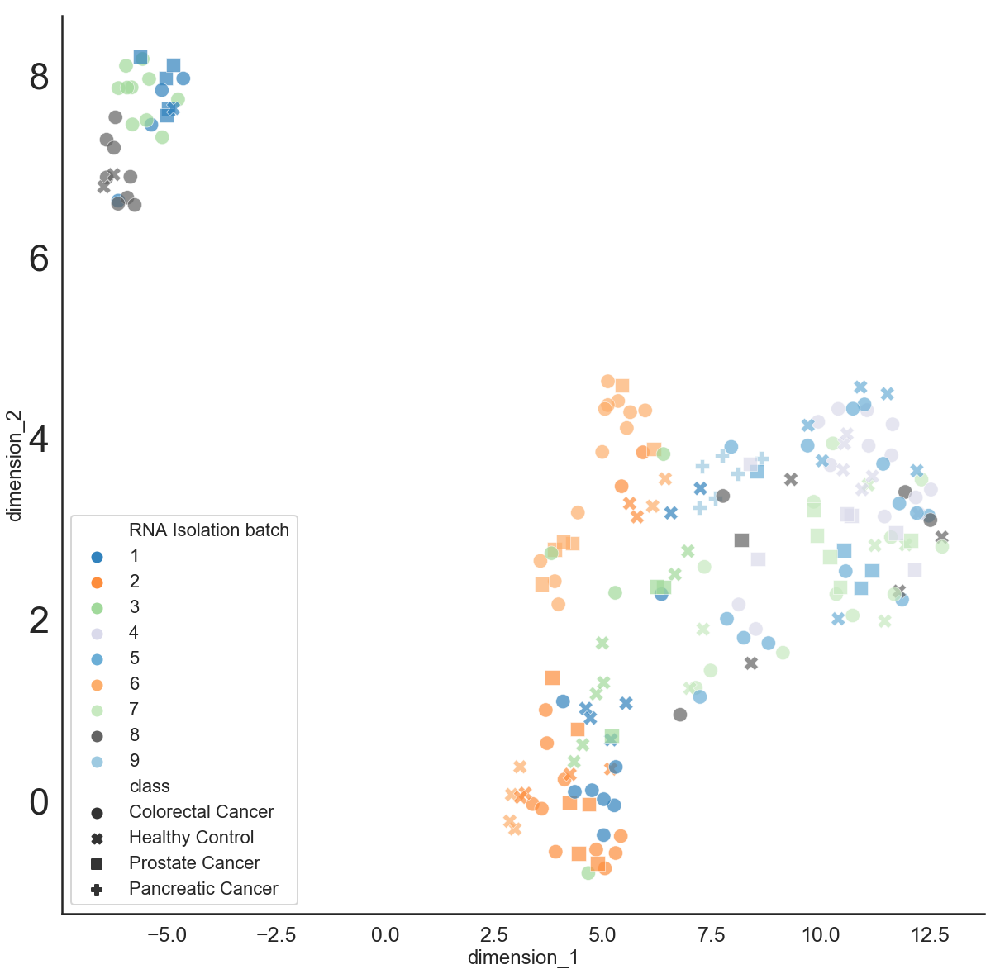

<Figure size 432x288 with 0 Axes>

In [72]:
show_batch_sns(original_mx,sample_class,batchtable)

In [73]:
def PCA_plot_batch(ax,data,sampleclass,batchinfo,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    class_name = np.unique(sampleclass.label)
    
    for label, color in zip(class_name, 
                                tableau20[:class_name.shape[0]]):
        indices = np.nonzero(sampleclass.loc[data.columns].label == label)[0]
        ax.scatter(X_pca[indices, 0], X_pca[indices, 1], s=200,alpha=1 ,edgecolors = 'black',label=label)
    ax.legend(fontsize=10)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [74]:
def plot_rna_batch(ax,rnaname,typetable,batchtable,batchindex=1):
    '''
    typetable: table_ratio
    rnaname certain type pf rna
    '''
    counts = typetable.T.loc[rnaname].T
    sumtable = pd.DataFrame(counts)
    sumtable_whole = pd.concat((sumtable.loc[batchtable.index],batchtable),axis=1)
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y=rnaname,ax=ax)
    ax.set_title('batch effect: '+batchname+ ' by '+rnaname,size=16)
    plt.tight_layout()

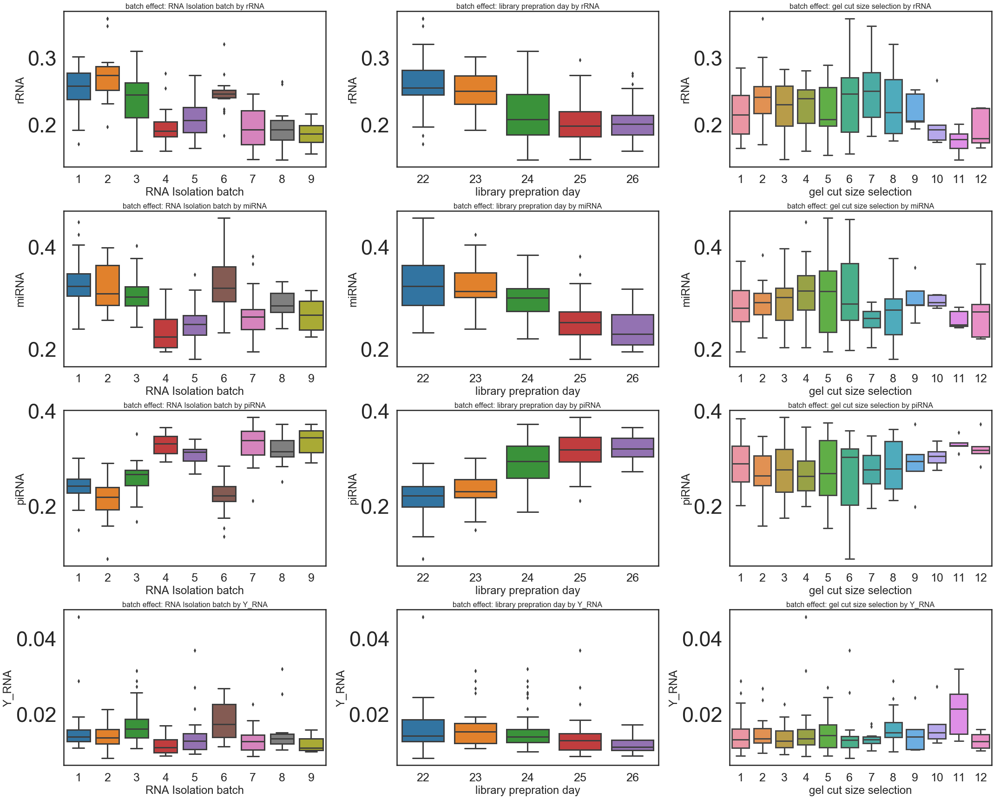

In [75]:
fig, ax = plt.subplots(4,3,figsize=(30, 24))
for i in range(4):
    for j in range(3):
        plot_rna_batch(ax[i,j],rnanames[i],table_ratio,batchtable,batchindex=j)

# Evaluation

In [33]:
#小二－ 18. 三号－ 16. 小三－ 15. 四号－ 14. 小四－ 12. 五号－ 10.5 (pt)
# 72pt = 1in = 2.54cm
fonttitle = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 8}
fontlabel = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 6.5}
fontticklabel = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 6.5}
fontlegend = {'family':'Arial',
                  'weight' : 'normal', 
              #'linewidth':0.5,
                  'size' : 6.5}
fontcbarlabel = {'family':'Arial',
                 'weight' : 'normal', 
                 #'Rotation' : 270,
                 #'labelpad' : 25,
                 'size' : 6.5}
fontcbarticklabel = {'family':'Arial',#Helvetica
                 'weight' : 'normal', 
                 'size' : 5.5}
def std_plot(ax,xlabel,ylabel,title=None,
             legendtitle=None,bbox_to_anchor=None,
             labelspacing=1.2,borderpad=0,handletextpad=0,legendsort=True,
             xlim=None,ylim=None,
             cbar=None,cbarlabel=None,
             moveyaxis=False,sns=False,left=True):
    #plt.yticks([0,0.2,0.4,0.6,0.8,1.0],['0','0.2','0.4','0.6','0.8','1.0'])
    pyplot.draw()
    #plt.figure(linewidth=30.5)
    ax.set_xticks(ax.get_xticks())
    ax.set_yticks(ax.get_yticks())
    ax.set_xlabel(xlabel,fontdict = fontlabel,labelpad=5.5)
    ax.set_ylabel(ylabel,fontdict = fontlabel,labelpad=5.5)
    ax.set_xticklabels(ax.get_xticklabels(),fontticklabel)
    ax.set_yticklabels(ax.get_yticklabels(),fontticklabel)

    if moveyaxis is True:
        #fontticklabel字体会变
        ax.spines['left'].set_position(('data',0))
    ax.spines['left'].set_visible(left)
    ax.spines['right'].set_visible(not left)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)
    ax.spines['bottom'].set_color('k')
    ax.spines['left'].set_color('k')
    ax.spines['right'].set_color('k')
    
    ax.tick_params(direction='out', pad=-10)
    #ax.spines['bottom']._edgecolor="#000000"
    #ax.spines['left']._edgecolor="#000000"
    if title is not None:
        ax.set_title(title,fontdict = fonttitle)
    if legendtitle is not None:
        #if legendloc is None:
        #    legendloc="best"
        legend = ax.legend(title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False)
        ax.legend_.get_frame()._linewidth=0.5
        legend.get_title().set_fontweight('normal')
        legend.get_title().set_fontsize(6.5)
        if legendsort is True:
            # h: handle l:label
            h,l = ax.get_legend_handles_labels()
            l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) 
            legend = ax.legend(h,l,title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False)
            ax.legend_.get_frame()._linewidth=0.5
            legend.get_title().set_fontweight('normal')
            legend.get_title().set_fontsize(6.5)
        if sns is True:
            h,l = ax.get_legend_handles_labels()
            #l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) 
            legend = ax.legend(h[1:],l[1:],title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False)
            ax.legend_.get_frame()._linewidth=0.5
            legend.get_title().set_fontweight('normal')
            legend.get_title().set_fontsize(6.5)
    if xlim is not None:  
        ax.set(xlim=xlim)
    if ylim is not None:
        ax.set(ylim=ylim)
    if cbar is not None:
        #locator, formatter = cbar._get_ticker_locator_formatter()
        #ticks, ticklabels, offset_string = cbar._ticker(locator, formatter)
        #cbar.ax.spines['top'].set_visible(False)
        #cbar.ax.spines['right'].set_visible(False)
        #cbar.ax.spines['bottom'].set_visible(False)
        #cbar.ax.spines['left'].set_visible(False)
        cbar.ax.tick_params(direction='out', pad=3,width=0,length=0)
        cbar.set_label(cbarlabel,fontdict = fontcbarlabel,Rotation=270,labelpad=7.5)
        cbar.ax.set_yticks(cbar.ax.get_yticks())
        cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(),fontcbarticklabel)
    return ax
def image_link(filename):
    fig.savefig(filename,dpi=300)
    return HTML('<a href="{0}" target="_blank" download="{0}">{0}</a>'.format(filename))

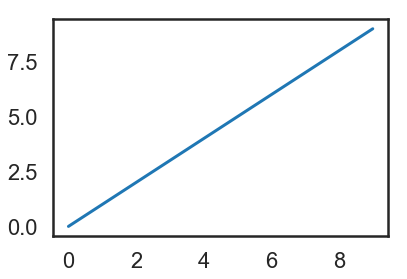

In [45]:
plt.plot(np.arange(10))
image_link('line.pdf')

In [46]:
!pwd

/home/xieyufeng/ex


In [12]:
import datetime
now = datetime.datetime.now()
timenow = '{}.{}.{}.{}:{}'.format(now.year,now.month,now.day,now.hour,now.minute)
savepath = 'output/candidate/'+dataset+'/'+timenow+'/'
if not os.path.exists(savepath):
    os.mkdir(savepath)

## feature recurrence

In [20]:
#use uca to presort methods
preselected_methods = np.loadtxt('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/selected_methods.txt',dtype='str')
preselected_methods_dir = np.array([preselected_methods[i]+'.'+exp_mx_name for i in range(preselected_methods.shape[0])])

def compare_preprocess_methods(output_dir, preselected_methods_dir, savepath=savepath,title=None,savefig=True):
    records = []
    pbar = tqdm(unit='directory')
    for preprocess_method in preselected_methods_dir:#os.listdir(output_dir):#
        for compare_group in os.listdir(os.path.join(output_dir, preprocess_method)):
            for feature_selection_method in os.listdir(os.path.join(output_dir, preprocess_method, compare_group)):
                classifier, n_select, select_method  = feature_selection_method.split('.')
                record = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'preprocess_method': preprocess_method
                }
                try:
                    metrics = pd.read_table(os.path.join(output_dir,
                        preprocess_method, compare_group, feature_selection_method,
                        'metrics.txt'))
                except:
                    continue
                record['test_roc_auc_mean'] = metrics['test_roc_auc'].mean()
                pbar.update(1)
                records.append(record)
    pbar.close()
    records = pd.DataFrame.from_records(records)
    records['n_features'] = records.loc[:, 'n_features'].astype(np.int32)
    
    best_preprocess_methods = {}
    for compare_group, sub_df in records.groupby('compare_group'):
        pivot = sub_df.pivot_table(
            index='preprocess_method', columns='n_features', values='test_roc_auc_mean')
        #print(pivot.iloc[:, 0])
        #print(np.argsort(np.argsort(pivot.values, axis=0), axis=0)[:, 0])
        mean_ranks = np.mean(pivot.shape[0] - np.argsort(np.argsort(pivot.values, axis=0), axis=0), axis=1)
        mean_ranks = pd.Series(mean_ranks, index=pivot.index.values)
        mean_ranks = mean_ranks.sort_values()
        rename_index = ['{} (rank = {:.1f})'.format(name, value) for name, value in zip(mean_ranks.index, mean_ranks.values)]
        rename_index = pd.Series(rename_index, index=mean_ranks.index.values)
        sub_df = sub_df.copy()
        sub_df['preprocess_method'] = rename_index[sub_df['preprocess_method'].values].values
        sub_df['n_features'] = sub_df['n_features'].astype('int')
        sub_df = sub_df.sort_values(['preprocess_method', 'n_features'], ascending=True)
        sub_df['n_features'] = sub_df['n_features'].astype('str')
        fig, ax = plt.subplots(figsize=(7, 7))
        
        '''
        for preprocess_method in rename_index.values:
            tmp_df = sub_df[sub_df['preprocess_method'] == preprocess_method]
            ax.plot(np.arange(tmp_df.shape[0]) + 1, tmp_df['test_roc_auc_mean'], label=preprocess_method,linewidth=5)

            ax.set_xticks(np.arange(tmp_df.shape[0]) + 1)
            ax.set_xticklabels(tmp_df['n_features'])
        '''
        #display(sub_df.iloc[np.isin(sub_df['preprocess_method'],rename_index.values)])
        tmpdf = sub_df.iloc[np.isin(sub_df['preprocess_method'],rename_index.values)]
        #tmpdf.n_features = pd.to_numeric(tmpdf.n_features)
        #tmpdf = tmpdf.sort_values(by=['n_features'], ascending=True)
        #tmpdf.n_features = tmpdf.n_features.astype('str')
        #display(tmpdf)
        sns.lineplot(ax=ax,data=tmpdf,sort=False,
                     x='n_features',y = 'test_roc_auc_mean',hue='preprocess_method',linewidth=3,#,legend='full'
                     
                     )
        #ax.set_ylim(0.5, 1)

        #ax.set_yticklabels(np.arange(5,11)/10,fontticklabel)
        #ax.set_xticklabels(np.concatenate((np.arange(1,10),np.arange(10,60,10))).astype('str'),fontticklabel)

        ax = std_plot(ax,'Number of features','Average AUROC',compare_group,legendtitle='preprocess method',
                      legendsort=False,sns=True,
                     labelspacing=1.2,borderpad=1,handletextpad=1)
        best_preprocess_methods[compare_group] = sub_df.iloc[0]['preprocess_method']
        if savefig:
            fig.savefig(savepath+'AUC_matrix_processing'+compare_group+'.eps', bbox_inches='tight')
        #print (best_preprocess_methods)
        best_preprocess_methods[compare_group] = mean_ranks.index[0]
        embed_pdf_figure()
    return best_preprocess_methods

best_preprocess_methods = compare_preprocess_methods('output/'+dataset+'/feature_selection',preselected_methods_dir)


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

In [19]:
savepath

'output/candidate/scirep/2019.1.15.13:53/'

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

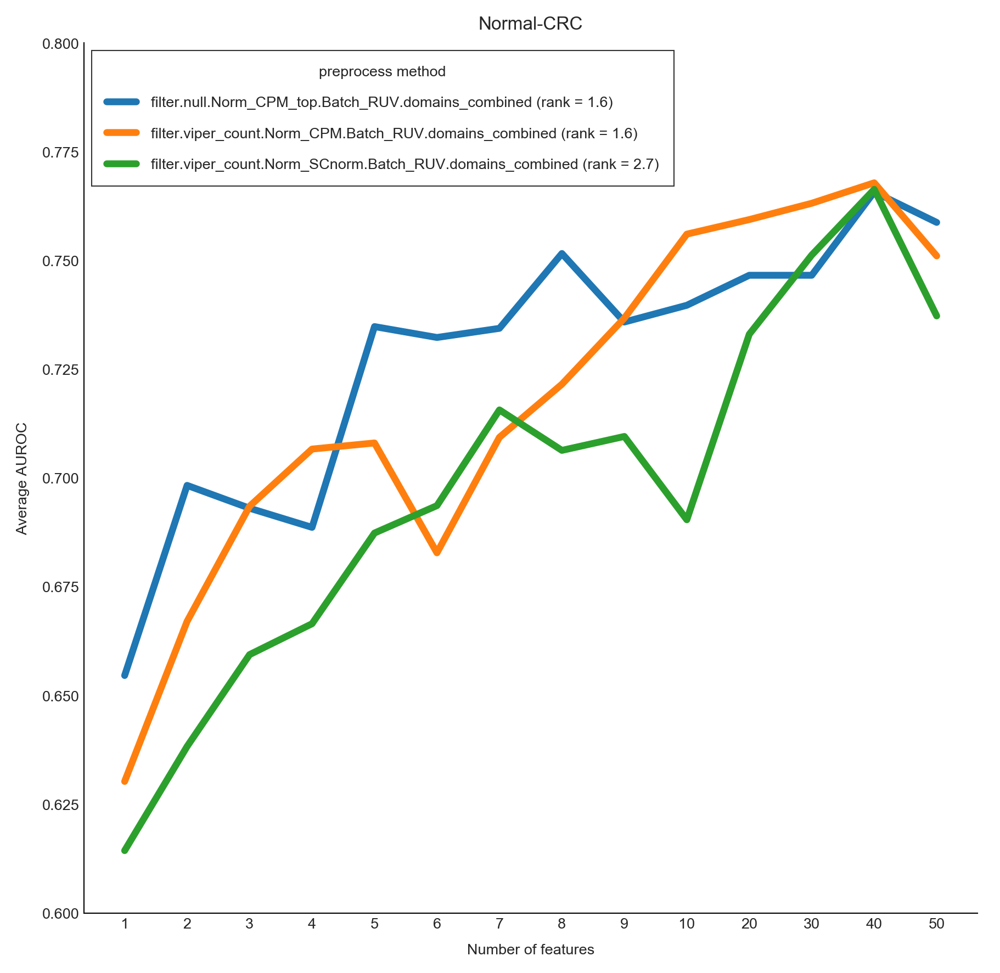

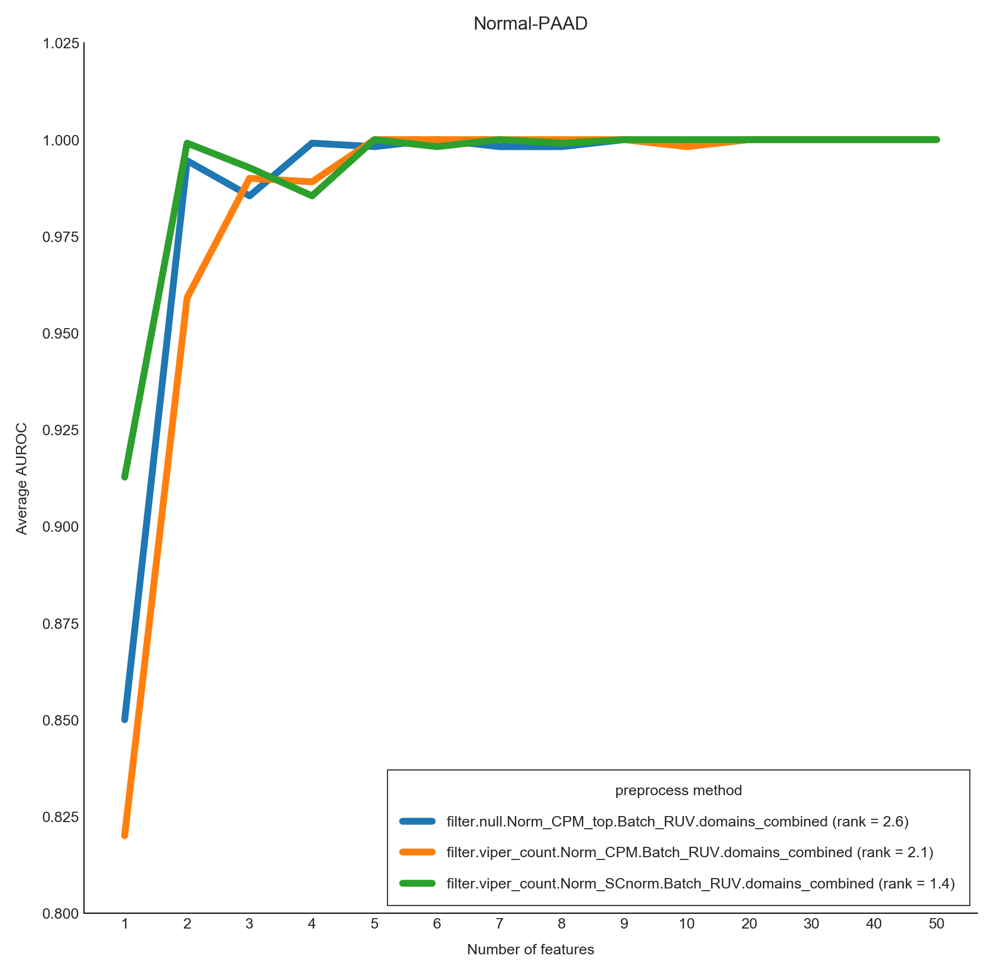

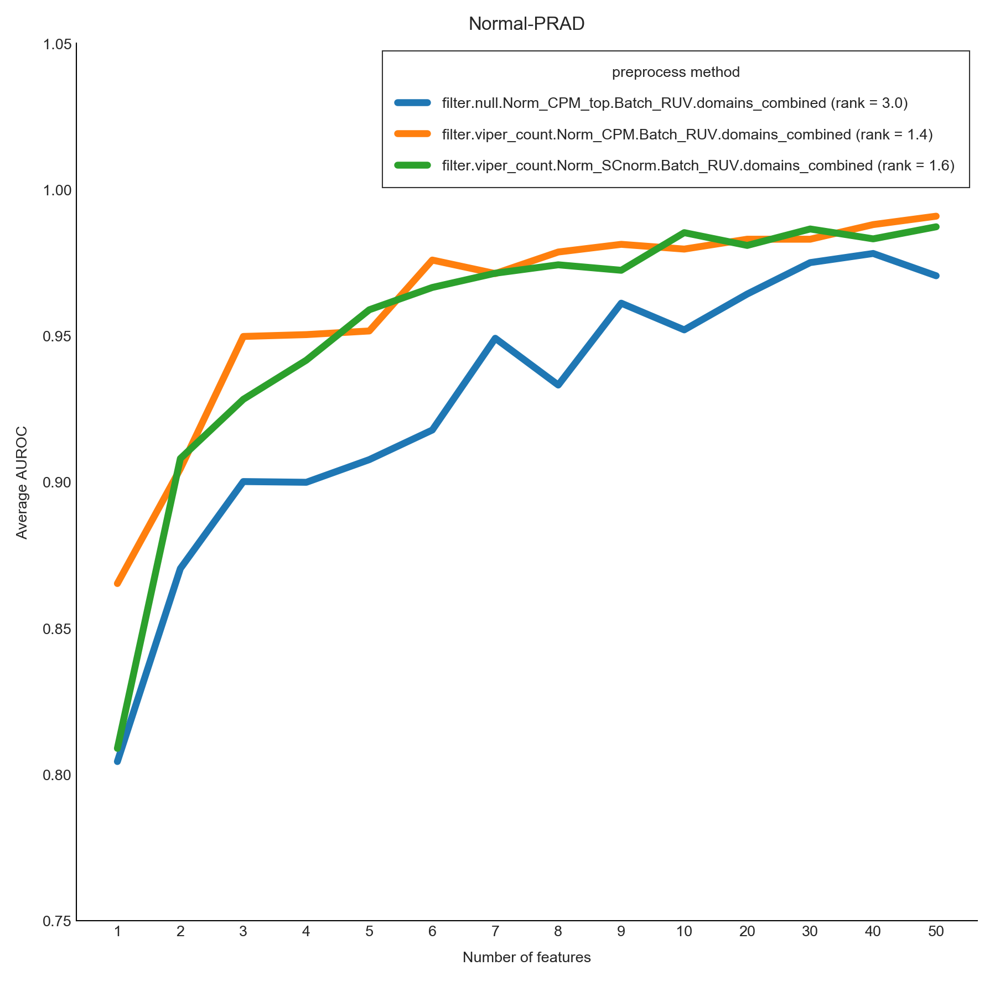

In [517]:
#use uca to presort methods
preselected_methods = np.loadtxt('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/selected_methods.txt',dtype='str')
preselected_methods_dir = np.array([preselected_methods[i]+'.'+exp_mx_name for i in range(preselected_methods.shape[0])])

def compare_preprocess_methods(output_dir, preselected_methods_dir, savepath=savepath,title=None,savefig=True):
    records = []
    pbar = tqdm(unit='directory')
    for preprocess_method in preselected_methods_dir:#os.listdir(output_dir):#
        for compare_group in os.listdir(os.path.join(output_dir, preprocess_method)):
            for feature_selection_method in os.listdir(os.path.join(output_dir, preprocess_method, compare_group)):
                classifier, n_select, select_method  = feature_selection_method.split('.')
                record = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'preprocess_method': preprocess_method
                }
                try:
                    metrics = pd.read_table(os.path.join(output_dir,
                        preprocess_method, compare_group, feature_selection_method,
                        'metrics.txt'))
                except:
                    continue
                record['test_roc_auc_mean'] = metrics['test_roc_auc'].mean()
                pbar.update(1)
                records.append(record)
    pbar.close()
    records = pd.DataFrame.from_records(records)
    records['n_features'] = records.loc[:, 'n_features'].astype(np.int32)
    
    best_preprocess_methods = {}
    for compare_group, sub_df in records.groupby('compare_group'):
        pivot = sub_df.pivot_table(
            index='preprocess_method', columns='n_features', values='test_roc_auc_mean')
        #print(pivot.iloc[:, 0])
        #print(np.argsort(np.argsort(pivot.values, axis=0), axis=0)[:, 0])
        mean_ranks = np.mean(pivot.shape[0] - np.argsort(np.argsort(pivot.values, axis=0), axis=0), axis=1)
        mean_ranks = pd.Series(mean_ranks, index=pivot.index.values)
        mean_ranks = mean_ranks.sort_values()
        rename_index = ['{} (rank = {:.1f})'.format(name, value) for name, value in zip(mean_ranks.index, mean_ranks.values)]
        rename_index = pd.Series(rename_index, index=mean_ranks.index.values)
        sub_df = sub_df.copy()
        sub_df['preprocess_method'] = rename_index[sub_df['preprocess_method'].values].values
        sub_df['n_features'] = sub_df['n_features'].astype('int')
        sub_df = sub_df.sort_values(['preprocess_method', 'n_features'], ascending=True)
        sub_df['n_features'] = sub_df['n_features'].astype('str')
        fig, ax = plt.subplots(figsize=(7, 7))
        
        '''
        for preprocess_method in rename_index.values:
            tmp_df = sub_df[sub_df['preprocess_method'] == preprocess_method]
            ax.plot(np.arange(tmp_df.shape[0]) + 1, tmp_df['test_roc_auc_mean'], label=preprocess_method,linewidth=5)

            ax.set_xticks(np.arange(tmp_df.shape[0]) + 1)
            ax.set_xticklabels(tmp_df['n_features'])
        '''
        #display(sub_df.iloc[np.isin(sub_df['preprocess_method'],rename_index.values)])
        tmpdf = sub_df.iloc[np.isin(sub_df['preprocess_method'],rename_index.values)]
        #tmpdf.n_features = pd.to_numeric(tmpdf.n_features)
        #tmpdf = tmpdf.sort_values(by=['n_features'], ascending=True)
        #tmpdf.n_features = tmpdf.n_features.astype('str')
        
        sns.lineplot(ax=ax,data=tmpdf,sort=False,
                     x='n_features',y = 'test_roc_auc_mean',hue='preprocess_method',linewidth=3,
                     )
        #ax.set_ylim(0.5, 1)

        #ax.set_yticklabels(np.arange(5,11)/10,fontticklabel)
        #ax.set_xticklabels(np.concatenate((np.arange(1,10),np.arange(10,60,10))).astype('str'),fontticklabel)

        ax = std_plot(ax,'Number of features','Average AUROC',title=compare_group,legendtitle='preprocess method',
                      sns=True,legendsort=False,
                      labelspacing=1.2,borderpad=1,handletextpad=1)
        best_preprocess_methods[compare_group] = sub_df.iloc[0]['preprocess_method']
        if savefig:
            fig.savefig(savepath+'AUC_matrix_processing'+compare_group+'.pdf', bbox_inches='tight')
        #print (best_preprocess_methods)
        best_preprocess_methods[compare_group] = mean_ranks.index[0]
    return best_preprocess_methods

best_preprocess_methods = compare_preprocess_methods('output/'+dataset+'/feature_selection',preselected_methods_dir)

## Compare Features: AUC line plot

In [28]:
rpkm_table_origin

,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,4.090909e+02,6.363636e+02,1.363636e+02,4.545455e+01,2.727273e+02,4.545455e+01,2.727273e+02,3.636364e+02,6.363636e+02,2.727273e+02,...,8.181818e+02,1.363636e+02,2.727273e+02,2.272727e+02,5.000000e+02,4.545455e+01,4.545455e+01,3.181818e+02,5.454545e+02,4.545455e+02
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,1.347619e+04,2.395238e+04,1.019048e+04,7.285714e+03,2.147619e+04,7.857143e+03,2.071429e+04,2.685714e+04,3.138095e+04,2.004762e+04,...,3.490476e+04,8.809524e+03,1.066667e+04,3.261905e+04,3.985714e+04,8.857143e+03,7.904762e+03,1.400000e+04,3.080952e+04,2.371429e+04
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,1.118182e+05,3.007727e+05,9.727273e+04,7.809091e+04,1.760000e+05,7.986364e+04,2.072273e+05,2.966364e+05,2.943636e+05,3.535909e+05,...,5.376364e+05,8.250000e+04,1.141818e+05,2.864091e+05,3.415455e+05,6.995455e+04,6.622727e+04,1.084545e+05,2.652727e+05,2.221818e+05
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,1.045455e+04,1.545455e+04,6.681818e+03,9.954545e+03,9.409091e+03,5.545455e+03,8.590909e+03,1.263636e+04,1.522727e+04,2.081818e+04,...,2.290909e+04,7.909091e+03,1.263636e+04,1.400000e+04,1.668182e+04,5.636364e+03,5.818182e+03,1.204545e+04,1.795455e+04,9.954545e+03
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,2.571318e+06,2.543364e+06,2.327955e+06,2.530409e+06,1.086727e+06,1.145091e+06,1.462455e+06,2.670045e+06,2.424727e+06,2.061682e+06,...,2.903045e+06,1.712636e+06,1.959409e+06,1.706727e+06,2.814591e+06,7.475455e+05,7.341364e+05,2.705864e+06,2.695227e+06,2.611455e+06
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,1.318182e+03,2.409091e+03,1.454545e+03,9.090909e+02,1.318182e+03,5.454545e+02,1.136364e+03,1.772727e+03,3.136364e+03,2.727273e+03,...,2.545455e+03,1.181818e+03,6.818182e+02,2.227273e+03,3.863636e+03,5.000000e+02,8.181818e+02,1.227273e+03,2.590909e+03,1.090909e+03
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,1.505455e+05,2.623636e+05,1.327273e+05,1.071818e+05,1.319091e+05,8.104545e+04,1.727727e+05,2.630909e+05,2.577273e+05,2.495909e+05,...,3.790000e+05,1.089091e+05,1.368182e+05,2.368636e+05,2.809091e+05,5.845455e+04,6.586364e+04,1.551364e+05,3.390455e+05,3.904545e+05
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,1.010000e+05,1.739091e+05,7.409091e+04,5.704545e+04,9.654545e+04,4.840909e+04,8.709091e+04,1.233182e+05,1.773636e+05,2.460000e+05,...,2.165000e+05,7.404545e+04,9.145455e+04,1.339091e+05,1.693182e+05,4.486364e+04,4.290909e+04,1.221364e+05,1.953636e+05,8.900000e+04
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,4.300000e+04,7.386364e+04,3.345455e+04,2.600000e+04,4.918182e+04,2.895455e+04,5.940909e+04,8.786364e+04,7.486364e+04,9.318182e+04,...,1.514545e+05,3.936364e+04,4.531818e+04,8.118182e+04,9.281818e+04,2.590909e+04,2.281818e+04,4.318182e+04,8.031818e+04,7.140909e+04
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,3.409091e+03,7.681818e+03,3.318182e+03,2.227273e+03,3.954545e+03,1.909091e+03,4.500000e+03,6.409091e+03,6.909091e+03,6.681818e+03,...,9.818182e+03,4.045455e+03,4.909091e+03,6.545455e+03,7.000000e+03,2.090909e+03,2.227273e+03,4.272727e+03,7.545455e+03,4.500000e+03


In [21]:
cpm_table_origin_ = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt')
cpm_table_origin =  cpm_table_origin_/cpm_table_origin_.sum(axis=0)*10e6
length_tmp = np.array([cpm_table_origin.index[i].split('|')[-1] for i in range(cpm_table_origin.index.shape[0])]).astype('int')-\
np.array([cpm_table_origin.index[i].split('|')[-2] for i in range(cpm_table_origin.index.shape[0])]).astype('int')
rpkm_table_origin = (cpm_table_origin_.T/length_tmp*1000).T


def calculate_fc(table,original_index,sample_class, class_compare,cpm_table_origin):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    sample_class_use = sample_class.iloc[np.isin(sample_class.label,class_compare)]
    sample_class_1_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[0])]
    sample_class_2_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[1])]
    table_selected = table.loc[original_index]
    length = np.array([original_index[i].split('|')[-1] for i in range(original_index.shape[0])]).astype('int')-\
np.array([original_index[i].split('|')[-2] for i in range(original_index.shape[0])]).astype('int')
    #print (length)
    rpkmtable = (table_selected.T/length).T*1000
    #display(rpkmtable)
    #display(table_selected)
    rpkmtable_ = pd.concat((rpkmtable.loc[original_index,sample_class_1_use.index],
               rpkmtable.loc[original_index,sample_class_2_use.index]),axis=1)
    cpmtable_ = pd.concat((cpm_table_origin.loc[original_index,sample_class_1_use.index],
               cpm_table_origin.loc[original_index,sample_class_2_use.index]),axis=1)
    return np.mean(np.log2(rpkmtable.loc[:,sample_class_1_use.index]+0.001),axis=1) -\
np.mean(np.log2(rpkmtable.loc[:,sample_class_2_use.index]+0.001),axis=1),rpkmtable_,cpmtable_
def compare_features(path,sample_class,class_compare,compare_group,savepath=savepath,save_table=True):
    pbar = tqdm(unit='directory')
    feature_lists = {}
    for feature_selection_method in os.listdir(path):
        classifier, n_features, select_method  = feature_selection_method.split('.')
        n_features = int(n_features)
        if n_features > 10:
            continue
        # feature importance
        feature_lists[n_features] = pd.read_table(os.path.join(path,
            feature_selection_method, 'feature_importances.txt'), header=None, index_col=0).iloc[:, 0]
        feature_lists[n_features].index = feature_lists[n_features].index.astype('str')
        pbar.update(1)
    # feature union set
    feature_set = reduce(np.union1d, [a.index.values for a in feature_lists.values()])
    # build feature importance matrix
    feature_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    for n_features, feature_importance in feature_lists.items():
        feature_matrix.loc[feature_importance.index.values, n_features] = feature_importance.values
    feature_matrix.columns = feature_matrix.columns.astype('int')
    feature_matrix.index = feature_matrix.index.astype('str')
    
    feature_matrix = feature_matrix.loc[:, feature_matrix.columns.sort_values().values]
    original_index = feature_matrix.index
    feature_info = feature_matrix.index.to_series().str.split('|', expand=True)
    feature_info.columns = ['gene_id', 'gene_type', 'gene_name', 'feature_id', 'transcript_id', 'start', 'end']

    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values \
    
    # build feature indicator matrix
    feature_indicator_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    for n_features, feature_importance in feature_lists.items():
        feature_indicator_matrix.loc[feature_importance.index.values, n_features] = 1
    feature_indicator_matrix.columns = feature_indicator_matrix.columns.astype('int')
    feature_indicator_matrix = feature_indicator_matrix.loc[:, feature_indicator_matrix.columns.sort_values().values]
    
    feature_indicator_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values
    #fig, ax = plt.subplots(figsize=(6, 8))
    #sns.heatmap(feature_indicator_matrix,
    #            cmap=sns.light_palette('green', as_cmap=True), cbar=False, ax=ax, linewidth=1)
    #ax.set_xlabel('Number of features')
    #ax.set_ylabel('Features')
    foldchange,rpkmtable,cpmtable = calculate_fc(processed_matrix, original_index,sample_class,class_compare,cpm_table_origin)
    foldchange.index = feature_matrix.index
    feature_matrix = pd.concat((feature_matrix,foldchange),axis=1)
    feature_matrix.columns = np.concatenate((np.arange(1,11).astype('str'),np.array(['fold change'])))
    #display (feature_matrix)
    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
    + '|' + feature_info.loc[:, 'feature_id'].values \
        + '|' + feature_info.loc[:, 'transcript_id'].values
    #display (feature_matrix)
    display(feature_matrix.style\
        .background_gradient(cmap=sns.light_palette('green', as_cmap=True))\
        .set_precision(2)\
        .set_caption(path))
    pbar.close()
    if save_table:
        feature_matrix.to_csv(savepath+compare_group+'_feature_table.txt',sep='\t')
    return feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpmtable


In [22]:
def scale(axis,table):
    '''
    axis: 0(by sample)/1(by feature)/2(both 0 and 1)
    '''
    scaler = StandardScaler()
    arr = np.array(table)
    if axis==0:
        return scaler.fit_transform(arr)
    elif axis==1:
        return scaler.fit_transform(arr.T).T
    elif axis==2:
        return scaler.fit_transform(scaler.fit_transform(arr).T).T
def clustermap(processed_matrix,featurename,sample_class, class_compare,compare_group,savepath=savepath,savefig=True):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    sample_class_use = sample_class.iloc[np.isin(sample_class.label,class_compare)]
    cpm_table = processed_matrix
    cpm_table_use = cpm_table.loc[featurename,samples_use]
    #display(cpm_table_use)
    cpm_matrix= np.log2(np.array(cpm_table_use)+0.001)
    cpm_table_use.iloc[:,:] = RobustScaler().fit_transform(cpm_matrix.T).T
    rgblabel = np.repeat('r',samples_use.shape[0])
    rgblabel[np.where(sample_class_use.label==class_compare[-1])] = 'b'
    cpm_table_use.index = np.array([cpm_table_use.index[i].split('|')[2]+'|'+cpm_table_use.index[i].split('|')[1] for i in range(cpm_table_use.index.shape[0]) ])
    sns_plot = sns.clustermap(cpm_table_use,cmap='vlag',figsize=(70,20),col_colors=rgblabel)
    if savefig:
        sns_plot.savefig(savepath+compare_group+'_clustermap.eps', bbox_inches='tight')
    
   
    return cpm_table_use,sample_class_use

In [24]:
def display_dataframe(df, filename=None, encoding='utf-8', format='csv', type='button',gradientfunc=False, **kwargs):
    #display(df)
    #if isinstance(df, pd.DataFrame):
    #    display(df.style.set_caption(filename))
    #else:
    if gradientfunc == False:
        display(df.style.set_caption(filename))    
    else:
        display(df.style.format(gradient_func).set_caption(filename)) 
    if filename is None:
        filename = "dataframe"
    if format == 'csv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/csv'
        filename = filename + '.csv'
    elif format == 'tsv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/plain'
        filename = filename + '.txt'
    else:
        raise ValueError('unknown file format: {}'.format(format))
    data = 'data:{mime_type};base64,'.format(mime_type=mime_type) + str(b64encode(bytes(data, encoding=encoding)), encoding=encoding)
    if type == 'hyperlink':
        display(HTML('<a href="{data}" download={filename} target="_blank">{filename}</a>'.format(
            mime_type=mime_type, filename=filename, data=data)))
    elif type == 'button':
        button_id = 'button_{}'.format(np.random.randint(1000000000))
        display(HTML(r'<input type="button" id="{0}" value="Download">'.format(button_id)))
        display(HTML('''<script>
    document.getElementById("{button_id}").addEventListener("click", function(event){{
        var filename = "{filename}";
        var data = "{data}";
        const element = document.createElement('a');
        element.setAttribute('href', data);
        element.setAttribute('download', filename);
        element.style.display = 'none';
        document.body.appendChild(element);
        element.click();
        document.body.removeChild(element);
    }});
</script>'''.format(button_id=button_id, filename=filename, data=data)))

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,1,2,3,4,5,6,7,8,9,10,fold change
20275|tRNA|peak_60|20275,0,0,0,0,0,0,0.097,0,0,0,0.22
21322|tRNA|peak_87|21322,0,0,0,0,0,0,0,0,0,0.062,0.25
30984|tRNA|peak_320|30984,0,0,0,0,0,0,0.093,0,0,0,0.39
31482|tRNA|peak_326|31482,0,0,0,0.2,0,0,0,0,0,0,0.3
35944|tRNA|peak_382|35944,0,0,0,0,0,0,0.19,0.13,0,0,0.11
IMPG2|mRNA|peak_430|ENST00000193391.7,1,0,0,0,0,0,0,0.18,0.14,0.11,0.32
Y_RNA|Y_RNA|peak_1163|ENST00000516445.1,0,0,0,0.26,0,0,0,0,0,0,0.16
U1|snRNA|peak_1501|ENST00000615842.1,0,0,0,0,0.1,0,0,0,0,0,-0.09
SNORD26|snoRNA|peak_721|ENST00000384147.1,0,0,0,0,0,0.19,0,0.16,0.14,0.18,-0.98
chr16_70788680_70788740_+|genomic|peak_3043|chr16,0,0,0,0,0,0,0,0,0.11,0,-0.12


,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,5.315174,3.873679,1.514693,1.370916,3.500601,0.921395,3.314725,2.267503,5.793236,1.480503,...,4.892445,2.378633,4.119866,2.042714,1.786434,1.504632,1.393048,3.813099,3.129540,7.021107
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,247.468042,225.775285,172.493926,357.975209,288.852145,204.147294,267.979687,186.960613,351.430542,192.350636,...,251.226335,185.379028,193.593388,322.558708,260.167536,307.987243,215.885803,228.686707,333.697955,390.735529
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,2228.822232,2585.005446,2135.661637,3529.167477,2740.167518,2226.619929,3113.402921,2488.599970,3399.002767,2687.682048,...,3516.336615,1913.081866,2240.515174,3478.717134,3595.127652,2688.356388,2257.182820,2071.313215,2692.797400,4359.168311
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,87.263456,76.957265,62.353131,110.004462,86.634849,64.790834,73.929510,75.328179,105.304342,104.303927,...,106.383552,77.965908,121.137303,99.021826,94.803167,125.410274,115.882955,89.844156,97.952755,97.130600
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,9407.442744,8952.917237,9250.425266,9103.567803,6437.725872,6283.390429,7178.626125,9257.042823,8766.965223,6605.794417,...,7671.069320,6732.508859,8719.555529,7156.911921,7615.860340,7991.271962,8535.859150,9119.133825,9020.218618,13401.909512
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,11.731224,13.099253,12.481572,20.129568,13.031331,7.493477,10.610338,10.549374,21.197068,13.502564,...,12.443682,13.899954,7.456279,15.725443,15.549643,12.008300,19.012139,9.897755,13.288307,12.268395
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,1625.073991,1746.702800,1595.706805,1873.446556,1382.976689,1213.617768,1700.831331,1800.268903,2055.380672,1655.637962,...,1994.472278,1346.860387,1607.092150,1924.732465,2063.674577,1455.298055,1433.227090,1522.539382,2601.666803,4523.044783
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,768.897688,755.600803,638.170432,816.165368,855.579220,558.637810,717.741972,652.170051,1069.577030,1032.600697,...,971.480253,723.640653,863.420493,869.883496,761.668743,953.169783,861.408989,828.677399,889.855473,853.913642
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,522.784537,544.690846,488.130273,544.632932,563.787005,480.862640,642.148155,562.591219,620.392490,626.979178,...,771.649856,546.964797,590.864539,741.614125,737.851645,705.342055,580.918903,493.094839,688.895532,945.119356
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,37.190784,44.904554,40.071242,40.815206,39.833453,28.899921,42.753054,40.187585,56.377132,42.385211,...,54.770166,49.973889,57.089208,50.142596,48.567422,52.126429,44.713688,40.528525,52.801130,49.476850


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,1,2,3,4,5,6,7,8,9,10,fold change
13029|tRNA|peak_38|13029,0,0,0,0,0,0,0,0,0.04,0,-0.14
21907|tRNA|peak_125|21907,0,0,0,0,0.16,0,0,0,0,0,-0.15
22774|tRNA|peak_140|22774,0,0,0,0,0,0,0,0,0,0.04,-0.067
24590|tRNA|peak_156|24590,0,0,0,0,0,0.24,0,0,0,0,-0.048
26038|tRNA|peak_195|26038,1,0,0,0,0,0,0,0,0,0.12,-0.14
26986|tRNA|peak_220|26986,0,0,0,0,0,0,0,0.04,0,0,-0.031
26992|tRNA|peak_225|26992,0,0,0,0,0,0,0.12,0.12,0.12,0,0.15
28529|tRNA|peak_248|28529,0,0,0,0,0,0,0.24,0,0,0,-0.0033
30031|tRNA|peak_264|30031,0,0,0,0.16,0,0,0,0,0,0,0.046
30946|tRNA|peak_287|30946,0,0,0,0,0,0.24,0,0,0,0,0.12


,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,5.268956,4.733591,1.902354,0.557015,3.647321,0.984245,3.848152,4.200412,4.802895,1.618851,...,6.304568,2.770607,4.538490,2.233947,3.086121,1.074692,1.069227,3.702646,3.522520,7.054888
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,551.024170,469.295344,415.692523,378.544870,465.049543,529.707126,508.504598,739.500785,487.003376,340.139127,...,641.166763,515.088227,408.305704,529.450030,428.267697,396.160639,329.140012,518.563503,590.471706,727.787341
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,8732.045949,9491.593890,9279.722765,6703.756060,8519.443231,9568.683180,10674.191249,13790.977427,8431.299551,7390.360611,...,13167.413639,8417.003775,7861.242152,10239.233924,10501.750106,5763.816967,4877.963887,8183.166638,8177.156337,13056.449492
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,302.369081,259.523678,213.036694,279.396257,245.409002,226.729956,230.845215,288.503217,274.370674,295.023833,...,388.650564,292.947752,390.227690,289.930816,264.883320,211.165576,211.808142,325.376013,285.071703,287.485729
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,48956.778153,48989.352880,51059.164630,33848.722309,33688.284918,32362.113624,39687.298228,41643.898387,42574.210160,31921.752245,...,39892.118834,37974.465231,47098.384296,37470.726820,39688.797664,32571.829030,32008.983730,44905.422103,43660.188050,65706.142471
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,24.712450,26.395377,27.197152,16.866619,21.055658,17.332849,20.062336,26.819790,29.116486,22.860179,...,27.511832,36.404943,15.634979,26.422426,23.049530,12.992733,21.483801,21.098474,23.213647,21.819380
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,6504.383666,6584.060280,6774.188237,4046.110091,5218.494014,5394.585195,6433.439248,7377.678661,6733.127090,5646.226142,...,8415.914512,5340.842173,5878.822747,6621.311291,6889.431503,4383.923540,4487.077793,5838.067219,8863.054908,15626.071900
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,1789.211232,1688.109655,1616.949933,1031.774935,1857.383792,1553.632928,1599.468422,1882.342177,1872.762618,2061.893315,...,1972.842065,1771.262114,1899.464998,1673.664275,1617.027276,2050.856643,1837.879297,1793.401635,1817.579702,1764.986904
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,2026.627200,2042.664406,2087.674056,1337.315226,2025.851587,2016.394875,2328.693733,2919.965103,1833.690937,1866.017985,...,2776.106100,2120.611910,2002.579136,2388.269768,2606.599333,1881.843757,1491.553779,1878.651270,2221.327069,2982.835550
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,117.986879,135.615410,130.947242,83.799736,112.747213,103.787251,125.938911,120.120278,143.960302,119.211198,...,186.984060,163.380514,165.882383,133.893890,139.608126,125.297429,122.749051,124.442451,140.981013,139.515457


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,1,2,3,4,5,6,7,8,9,10,fold change
28530|tRNA|peak_249|28530,0,0,0,0,0,0,0,0.087,0,0,0.18
Y_RNA|Y_RNA|peak_576|ENST00000363391.1,0,0,0,0,0,0,0,0,0,0.034,-0.012
Y_RNA|Y_RNA|peak_590|ENST00000363745.1,0,0,0,0,0,0,0,0,0.067,0,0.28
Y_RNA|Y_RNA|peak_591|ENST00000363781.1,0,0.41,0,0,0.15,0.1,0,0,0,0,-0.047
Y_RNA|Y_RNA|peak_593|ENST00000363867.1,0,0,0,0.1,0,0,0,0,0,0,0.16
Y_RNA|Y_RNA|peak_604|ENST00000364128.1,0,0,0,0,0,0.089,0,0,0,0,0.027
RNU1-34P|snRNA|peak_615|ENST00000364421.1,0,0,0,0,0.094,0,0.11,0.09,0.19,0,0.15
Y_RNA|Y_RNA|peak_638|ENST00000365157.1,0,0,0,0,0,0,0,0,0.098,0.12,0.073
Y_RNA|Y_RNA|peak_724|ENST00000384184.1,0,0,0,0,0,0,0,0,0.029,0,0.026
Y_RNA|Y_RNA|peak_725|ENST00000384198.1,0,0,0,0,0,0,0,0,0,0.032,0.027


,Sample_1S3,Sample_1S6,Sample_1S9,Sample_1S12,Sample_1S15,Sample_1S18,Sample_1S21,Sample_1S24,Sample_4S2,Sample_4S5,...,Sample_4S16,Sample_4S19,Sample_4S22,Sample_4S25,Sample_N49,Sample_Pan05,Sample_Pan06,Sample_PC6,Sample_PC12,Sample_PC26
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,1.765755,1.571605,0.676342,0.194769,1.302404,0.360886,1.278942,1.236316,1.623320,0.543584,...,1.795630,0.845709,1.406696,0.704844,1.080131,0.406971,0.391502,1.139040,1.116401,2.196432
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,83.828340,70.726745,67.804001,63.425296,75.659026,91.755981,78.112266,90.615777,73.607893,53.274315,...,73.620210,75.030831,60.093711,75.023335,71.162450,77.205388,60.328715,71.568203,86.376675,108.480081
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,1128.243664,1203.168536,1295.818735,939.268525,1204.470491,1447.501168,1408.547058,1769.059193,1075.153724,980.805188,...,1217.974492,1018.031287,959.228248,1212.951645,1386.377411,979.157941,761.558524,937.931868,1002.248484,1615.746824
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,57.958213,48.578105,43.987016,52.772173,52.275372,50.166795,44.843353,50.111809,52.627280,57.729613,...,56.336035,51.018042,70.744940,52.015657,56.551563,59.430621,54.944211,55.367473,53.419606,52.709869
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,16565.700993,16031.003796,17213.071738,10426.863291,11980.326966,11614.088032,13092.135274,15314.240415,14736.265323,10767.360369,...,11394.507295,10998.330748,13750.112581,11641.787424,13865.618624,10838.494269,10110.297423,13666.588187,13204.861392,18908.171091
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,6.625289,6.879923,7.849212,4.554576,6.083645,5.274780,5.328317,5.901899,7.663511,6.141286,...,5.692621,8.942936,3.955063,6.570791,6.640360,4.583955,7.012437,5.146202,6.105122,5.536712
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,1423.423470,1402.849261,1532.121665,894.186483,1176.337131,1284.740715,1356.836271,1670.922428,1447.303229,1222.282483,...,1382.949941,1027.690333,1112.135788,1279.476287,1548.241401,907.032249,869.248439,1149.680503,1719.295688,2922.687359
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,454.648969,429.727110,413.266765,283.181098,448.798713,391.271015,390.391098,427.463940,462.808132,510.442521,...,460.679326,446.225248,454.653671,399.173819,407.713472,404.781043,364.682162,453.230032,429.340824,420.040293
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,308.533530,307.437490,333.682588,221.277798,322.343882,338.937506,356.206866,461.202976,275.562768,287.332941,...,331.301109,307.047169,285.837975,336.274312,395.518025,314.954179,237.666086,262.406466,315.537187,430.008979
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,25.776423,29.083722,29.282644,18.556725,25.062616,24.083998,26.528854,24.029574,31.256322,25.772300,...,31.865129,32.052176,31.959720,26.402448,32.892580,25.816225,24.185893,24.805916,27.547791,26.736083


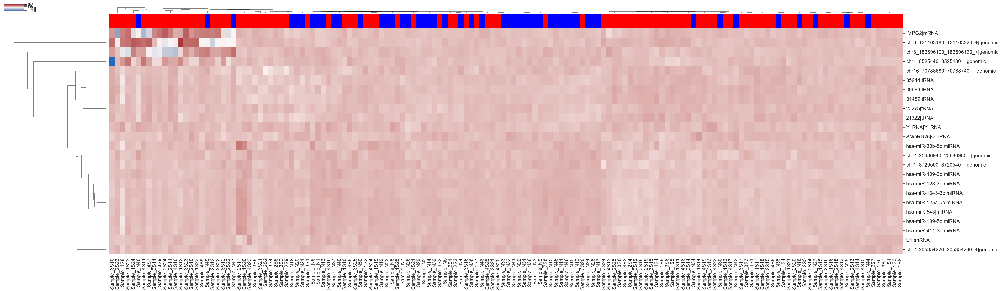

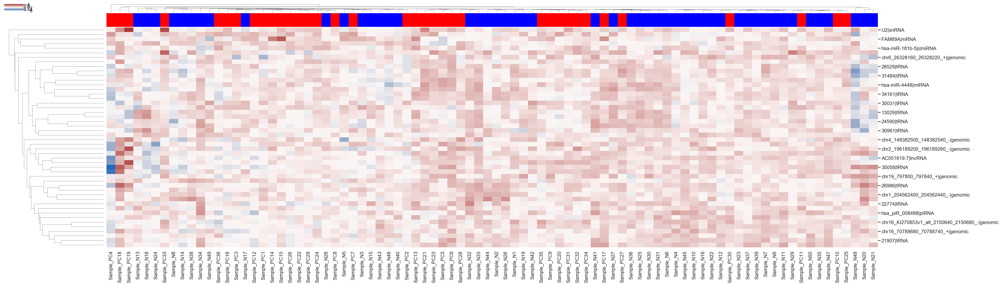

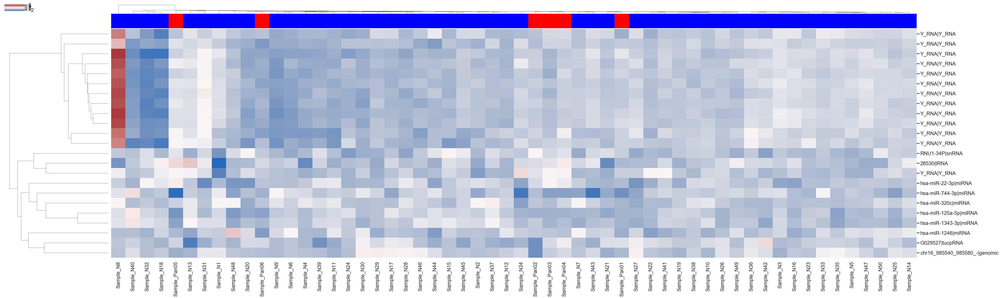

In [23]:
output_feature_selection_path = 'output/'+dataset+'/feature_selection/'
feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpm_table_use,sample_class_use,cpmtable = {},{},{},{},{},{},{},{}
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    class_info = 'data/'+dataset+'/sample_classes.txt'
    if dataset =='scirep':
        if compare_group=='Normal-CRC':
            class_compare = np.array(['Colorectal Cancer', 'Healthy Control']) 
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['Prostate Cancer', 'Healthy Control']) 
        elif compare_group=='Normal-PRAD':
            class_compare = np.array(['Pancreatic Cancer', 'Healthy Control']) 
    elif dataset =='lulab_hcc':
        if compare_group=='Normal-HCC':
            class_info = 'data_old/labels/sample_classes_hcc.txt'
        if compare_group=='Normal-HCC':
            class_compare = np.array(['HCC', 'Normal']) 
        elif compare_group=='Normal-stage_A':
            class_compare = np.array(['stage_A', 'Normal']) 
    elif dataset =='exorbase':
        if compare_group=='Normal-HCC':
            class_compare = np.array(['HCC', 'Healthy']) 
        elif compare_group=='Normal-CRC':
            class_compare = np.array(['CRC', 'Healthy']) 
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['PAAD', 'Healthy']) 
    sample_class = pd.read_table(class_info,sep='\t',index_col=0)
    processed_matrix = pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt',sep='\t',index_col=0)
    feature_matrix[compare_group],feature_indicator_matrix[compare_group],\
    original_index[compare_group],foldchange[compare_group],rpkmtable[compare_group],cpmtable[compare_group] = compare_features(output_feature_selection_path+'{}/{}'.format(preprocess_method,compare_group),sample_class,class_compare,compare_group)
    features =  feature_matrix[compare_group].index
    cpm_table_use[compare_group],sample_class_use[compare_group] =  clustermap(processed_matrix,original_index[compare_group],sample_class,class_compare,compare_group)
    

## bar plot of feature importance

In [79]:
def pallete(start,rot):
    sns.palplot(sns.cubehelix_palette(10, start,rot))
interact(pallete,
    start =FloatSlider(min=-2,max=2,step=0.05,value=0.3),
    rot= FloatSlider(min=-2,max=2,step=0.05,value=-0.5))

interactive(children=(FloatSlider(value=0.3, description='start', max=2.0, min=-2.0, step=0.05), FloatSlider(value=-0.5, description='rot', max=2.0, min=-2.0, step=0.05), Output()), _dom_classes=('widget-interact',))

<function __main__.pallete(start, rot)>

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

[4 9 6 4 2 1 2 1 1 1]
[1 1 1 1 2 1 1 1]
[9 6 7 2 1 3 1 1 3 1]



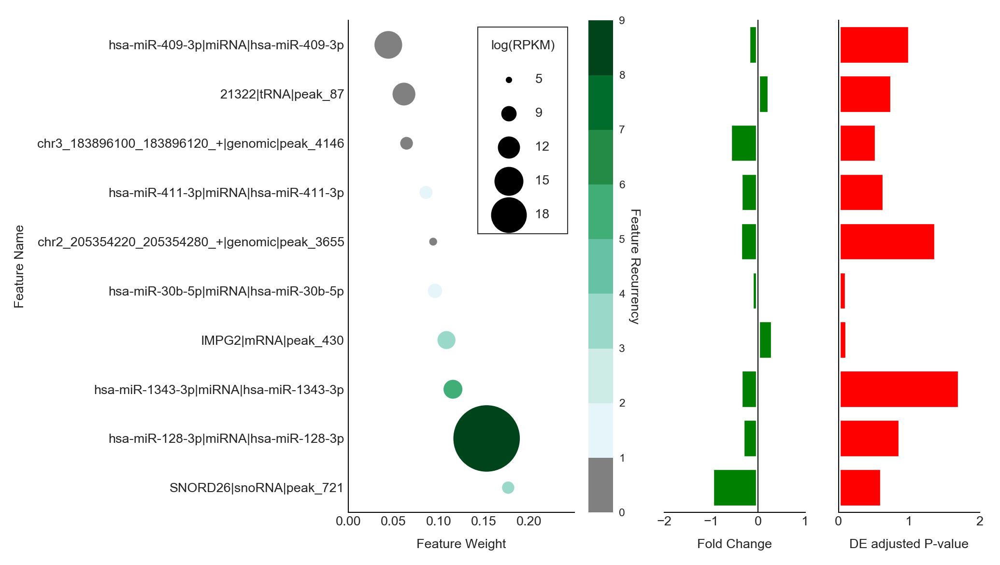

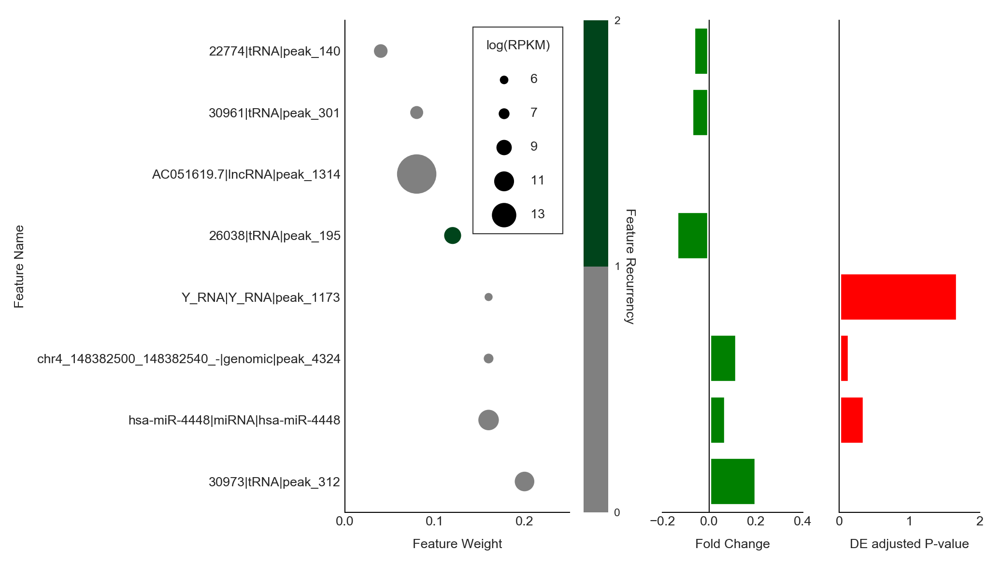

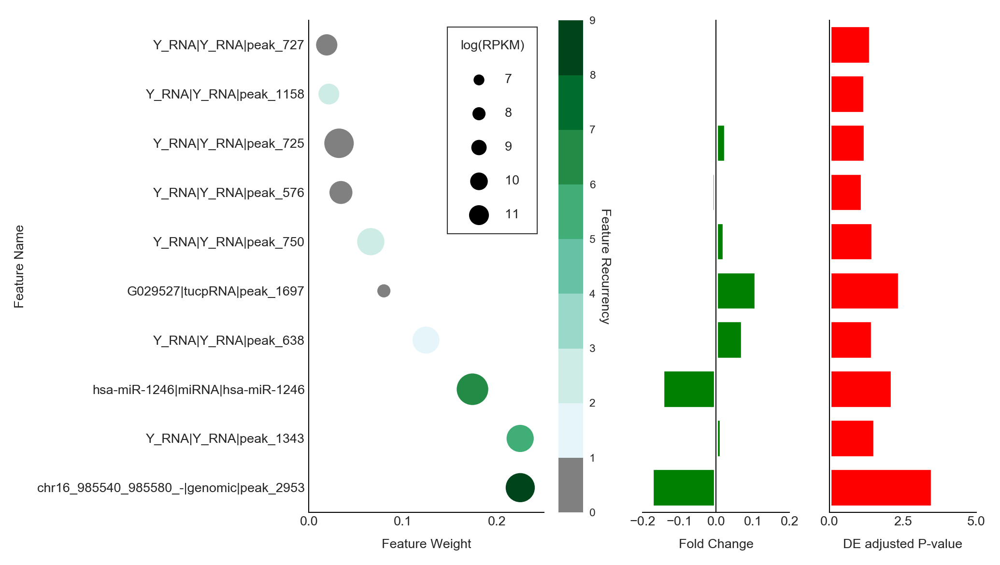

In [32]:
def feature_weight_bar(feature_weight_table,detable,nums_retain=10,rpkmtable=rpkmtable,original_index=original_index, savepath=savepath,savefig=True,compare_group=compare_group):
    
    selected_table = feature_weight_table.iloc[:,nums_retain-1:]
    rpkm = np.array(rpkmtable.iloc[np.where(selected_table.iloc[:,0]!=0)].mean(axis=1))
    selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]
    nums_retain = min(selected_feature.shape[0],nums_retain)
    selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]
    featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
    #feature_weight = np.array(feature_weight_table.sum(axis=1))
    feature_weight = np.array(selected_table.iloc[:,0])
    fc = np.array(selected_table.iloc[:,1])
    fc = fc[np.argsort(-feature_weight)]
    #rpkm = np.array(rpkmtable.mean(axis=1))
    
    rpkm = rpkm[np.argsort(-feature_weight)]
    featurename = featurename[np.argsort(-feature_weight)]
    selected_feature = selected_feature[np.argsort(-feature_weight)]
    feature_weight = -np.sort(-feature_weight)
    featurename = np.array([featurename[i].split('|')[0]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
    dataframe.weight  =  pd.to_numeric(dataframe.weight)
    dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
    dataframe_.fc  =  pd.to_numeric(dataframe_.fc)
    dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe_rpkm.rpkm  =  pd.to_numeric(dataframe_rpkm.rpkm)
    fig,ax=plt.subplots(1,3,figsize=(nums_retain*4,12))
    sns.barplot(ax=ax[0],data=dataframe_.iloc[:nums_retain],y='name',x='fc',color='r',saturation=1)
    ax[0].set_xlabel('fold change')
    
    
    sns.barplot(ax=ax[1],data=dataframe.iloc[:nums_retain],y='name',x='weight',color='b',saturation=1)
    sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    ax[2].set_xlabel('cpm')
    plt.figure(linewidth=30.5)
    for i in range(3):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    ax[2].get_yaxis().set_ticks([])
    ax[2].set_ylabel('')
    fig.tight_layout()
    return  selected_feature

def feature_weight_bar_(feature_weight_table,detable,nums_retain=10,rpkmtable=rpkmtable,
                        original_index=original_index, savepath=savepath,savefig=True,
                        compare_group=compare_group,scalefactor=0.1,area_=(8.0,9.0),namelength=2):
    feature_weight_table = pd.concat(( feature_weight_table,(feature_weight_table.iloc[:,:-1] !=0).sum(axis=1)),axis=1)
    #display(feature_weight_table)
    selected_table = feature_weight_table.iloc[:,nums_retain-1:]
    #display(selected_table,rpkmtable)
    rpkm = np.array(rpkmtable.iloc[np.where(selected_table.iloc[:,0]!=0)].mean(axis=1))
    selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]
    #print (selected_feature)
    #display(rpkmtable.iloc[np.where(selected_table.iloc[:,0]!=0)].mean(axis=1))
    
    #print (selected_feature.shape[0])
    nums_retain = min(selected_feature.shape[0],nums_retain)
    
    selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]
    #display(selected_table)
    featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
    #display(selected_table)
    #print (featurename)
    #feature_weight = np.array(feature_weight_table.sum(axis=1))
    feature_weight = np.array(selected_table.iloc[:,0])
    fc = np.array(selected_table.iloc[:,1])
    fc = fc[np.argsort(feature_weight)]
    recurrence = np.array(selected_table.iloc[:,2])
    recurrence = recurrence[np.argsort(-feature_weight)]
    #rpkm = np.array(rpkmtable.mean(axis=1))
    rpkm = rpkm[np.argsort(feature_weight)]
    deselected = -np.log10(detable.loc[selected_feature].iloc[np.argsort(feature_weight)].padj)
    #print (deselected)
    featurename = featurename[np.argsort(feature_weight)]
    #display(selected_table,featurename,rpkm)
    selected_feature = selected_feature[np.argsort(feature_weight)]
    feature_weight = np.sort(feature_weight)
    if namelength == 2:
        featurename = np.array([featurename[i].split('|')[0]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    if namelength == 3:
        featurename = np.array([featurename[i].split('|')[0]+'|'+featurename[i].split('|')[1]+'|'+featurename[i].split('|')[2] for i in range(len(featurename))])

    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
    #display(dataframe)
    dataframe.weight  =  pd.to_numeric(dataframe.weight)
    dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
    dataframe_.fc  =  pd.to_numeric(dataframe_.fc)
    #dataframe__= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),recurrence.reshape(-1,1)),axis=1),columns=['name','recurrence'])
    #dataframe__.recurrence  =  pd.to_numeric(dataframe__.recurrence)
    dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),np.log2(rpkm).reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe_rpkm.rpkm  =  pd.to_numeric(dataframe_rpkm.rpkm)
    dataframe_de= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),deselected.reshape(-1,1)),axis=1),columns=['name','DE_padj'])
    dataframe_de.DE_padj  =  pd.to_numeric(dataframe_de.DE_padj)
    #display(dataframe_rpkm)
    
    #display(dataframe_)
    dataframe = dataframe.iloc[::-1]
    dataframe_rpkm = dataframe_rpkm.iloc[::-1]
    #dataframe_de =  dataframe_de.iloc[::-1]
    #display(dataframe_de)
    fig, (ax, ax1,ax2) = plt.subplots(1,3, figsize=(7,4),gridspec_kw = {'width_ratios':[2, 1,1]})
    #scalefactor=0.1
    #print (dataframe_rpkm.shape)
    print (recurrence)
    #cmaps = sns.cubehelix_palette(10, start=0.1,rot=-0.2)
    #ax.scatter(dataframe.weight, np.arange(nums_retain),
     #           c = np.array(sns.cubehelix_palette(10, start=0.1,rot=-0.2))[recurrence-1], s=(dataframe_rpkm.rpkm)*scalefactor)
    #cmap = plt.get_cmap("viridis")
    cmap = plt.cm.BuGn#"viridis"
    # extract all colors from the .jet map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # force the first color entry to be grey
    cmaplist[0] = (.5,.5,.5,1.0)
    # create the new map
    cmaps = cmap.from_list('Custom cmap', cmaplist, cmap.N)
    # define the bins and normalize
    bounds = np.linspace(0,recurrence.max(),recurrence.max()+1)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    #display(dataframe,dataframe_rpkm,np.log2(rpkmtable.iloc[np.where(selected_table.iloc[:,0]!=0)].mean(axis=1)))
    im = ax.scatter(dataframe.weight, np.arange(nums_retain),cmap=cmaps,norm=norm,
            c = recurrence-1, s=(((dataframe_rpkm.rpkm)/area_[0]-0.5)*area_[1])**2.5)
    #display(dataframe.weight,np.arange(nums_retain),dataframe_rpkm.rpkm)
    cbar =fig.colorbar(im, ax=ax)#,drawedges=True
    cbar.outline.set_visible(False)
    #cbar.set_label('Feature Recurrency',weight='bold')
    #ax.set_xlabel("weight",fontsize=30,fontdict=dict(weight='bold'))
    #ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(featurename[::-1])
    if sequencing_type =='short':
        mattype = 'Log CPM'
    elif sequencing_type =='long':
        mattype = 'Log RPKM'
    #make a legend:
   # pws = np.round(np.array([np.min(dataframe_rpkm.rpkm),np.percentile(dataframe_rpkm.rpkm,0.2),
   #                np.percentile(dataframe_rpkm.rpkm,0.4),np.percentile(dataframe_rpkm.rpkm,0.6),
   #                np.percentile(dataframe_rpkm.rpkm,0.8),np.max(dataframe_rpkm.rpkm)]),2)
    interval = np.max(dataframe_rpkm.rpkm) - np.min(dataframe_rpkm.rpkm)
    ratiointer = interval/4
    #pws = np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer),0).astype(int)
    pws = set(np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer),0).astype(int))
    for pw in pws:
        ax.scatter([], [], s=((pw/area_[0]-0.5)*area_[1])**2, c="k",label=str(pw))
        
    #h,l = ax.get_legend_handles_labels()
    
    #ax.set_yticklabels(np.arange(5,11)/10,fontticklabel)
    #ax.set_xticklabels(np.concatenate((np.arange(1,10),np.arange(10,60,10))).astype('str'),fontticklabel)
    
    #mpl.rcParams['title_fontsize']=6
    #ax.legend(h[1:], l[1:], labelspacing=2, title=mattype, borderpad=1,  fontsize=20,
    #            frameon=True, framealpha=0.6, edgecolor="k", facecolor="w",prop={'size':25,'weight':'bold'})
    sns.barplot(ax=ax1,data=dataframe_,y='name',x='fc',color='g',saturation=1)
    sns.barplot(ax=ax2,data=dataframe_de,y='name',x='DE_padj',color='r',saturation=1)

    #ax = std_plot(ax,'Feature Weight','Feature Name',None,'log CPM',borderpad=2)
    ax = std_plot(ax,'Feature Weight','Feature Name',None,'log(RPKM)',
                  borderpad=1,labelspacing=1.7,handletextpad=1,cbar=cbar,cbarlabel='Feature Recurrency',
                  xlim=[0,0.25],ylim=[-0.5,nums_retain-0.5])
    #cbar.set_linewiths(5)
    
    
    ax1 = std_plot(ax1,'Fold Change','',None,moveyaxis=True)
    #print(ax1.get_xticklabels())
    ax2 = std_plot(ax2,'DE adjusted P-value','',None,None)
    ax1.set_yticks([])
    ax2.set_yticks([])
    #ax1.get_yaxis().set_ticks([])
    #ax2.get_yaxis().set_ticks([])
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+'weight_fc_barplot_'+compare_group+'.eps', bbox_inches='tight')
    return  selected_feature


plt.rcParams['figure.dpi'] = 300    
selected_features = {}
count = 0
scalefactor=np.array([0.6,0.6,0.5])*300
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):  
    if sequencing_type =='short':
        tmptable = cpmtable[compare_group]
    elif sequencing_type =='long':
        tmptable = rpkmtable[compare_group]
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0) 
    #display(detable)
    selected_features[compare_group] = feature_weight_bar_(feature_matrix[compare_group],detable,
                    10,original_index=original_index[compare_group],rpkmtable=tmptable,
                                    compare_group=compare_group,scalefactor=scalefactor[count],area_=(8.0,9.0),namelength=3)
    count+=1

In [30]:
savepath

'output/candidate/scirep/2019.1.9.21:5/'

In [887]:
del f

In [839]:
np.log2(rpkmtable.iloc[np.where(selected_table.iloc[:,0]!=0)].mean(axis=1))

22774|tRNA|22774|peak_140|22774|20|60                                                                7.095983
26038|tRNA|26038|peak_195|26038|0|91                                                                 7.939900
30961|tRNA|30961|peak_301|30961|20|73                                                                6.926342
30973|tRNA|30973|peak_312|30973|20|73                                                                8.561386
ENSG00000252822.1|Y_RNA|Y_RNA|peak_1173|ENST00000517013.1|0|40                                       5.552259
ENSG00000259932.1|lncRNA|AC051619.7|peak_1314|ENST00000568314.1|440|560                             12.795921
chr4_148382500_148382540_-|genomic|chr4_148382500_148382540_-|peak_4324|chr4|148382500|148382540     6.036187
hsa-miR-4448|miRNA|hsa-miR-4448|hsa-miR-4448|hsa-miR-4448|0|20                                       8.778360
dtype: float64

## my own effort2

In [756]:
savepath

'output/candidate/scirep/2019.1.7.20:33/'

In [825]:
pd.concat(( feature_matrix[compare_group],(feature_matrix[compare_group].iloc[:,:-1] !=0).sum(axis=1)),axis=1).iloc[:,nums_retain-1:].iloc[:,0]!=0


28530|tRNA|peak_249|28530                                False
Y_RNA|Y_RNA|peak_576|ENST00000363391.1                    True
Y_RNA|Y_RNA|peak_590|ENST00000363745.1                   False
Y_RNA|Y_RNA|peak_591|ENST00000363781.1                   False
Y_RNA|Y_RNA|peak_593|ENST00000363867.1                   False
Y_RNA|Y_RNA|peak_604|ENST00000364128.1                   False
RNU1-34P|snRNA|peak_615|ENST00000364421.1                False
Y_RNA|Y_RNA|peak_638|ENST00000365157.1                    True
Y_RNA|Y_RNA|peak_724|ENST00000384184.1                   False
Y_RNA|Y_RNA|peak_725|ENST00000384198.1                    True
Y_RNA|Y_RNA|peak_727|ENST00000384223.1                    True
Y_RNA|Y_RNA|peak_746|ENST00000384511.1                   False
Y_RNA|Y_RNA|peak_750|ENST00000384562.1                    True
Y_RNA|Y_RNA|peak_1158|ENST00000515994.1                   True
Y_RNA|Y_RNA|peak_1343|ENST00000578934.1                   True
G029527|tucpRNA|peak_1697|T126465                      

In [914]:
compare_group='Normal-PAAD'
preprocess_method='filter.null.Norm_CPM_top.Batch_RUV.domains_combined'

if sequencing_type =='short':
    tmptable = cpmtable[compare_group]
elif sequencing_type =='long':
    tmptable = rpkmtable[compare_group]
detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                   ,index_col=0) 


selected_features = {}
count = 0
scalefactor=np.array([0.6,0.6,0.5])*300
feature_weight_table=feature_matrix[compare_group]
detable=detable
nums_retain=10                 
original_index=original_index[compare_group]
rpkmtable=tmptable
compare_group=compare_group
scalefactor=scalefactor[0]
feature_weight_table = pd.concat(( feature_weight_table,(feature_weight_table.iloc[:,:-1] !=0).sum(axis=1)),axis=1)
#display(feature_weight_table)
selected_table = feature_weight_table.iloc[:,nums_retain-1:]
rpkm = np.array(rpkmtable.iloc[np.where(selected_table.iloc[:,0]!=0)].mean(axis=1))
selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]

In [874]:
selected_table

,10,fold change,0
13029|tRNA|peak_38|13029,0.00,-0.136041,1
21907|tRNA|peak_125|21907,0.00,-0.149805,1
22774|tRNA|peak_140|22774,0.04,-0.067163,1
24590|tRNA|peak_156|24590,0.00,-0.048154,1
26038|tRNA|peak_195|26038,0.12,-0.138921,2
26986|tRNA|peak_220|26986,0.00,-0.030919,1
26992|tRNA|peak_225|26992,0.00,0.146332,3
28529|tRNA|peak_248|28529,0.00,-0.003292,1
30031|tRNA|peak_264|30031,0.00,0.046168,1
30946|tRNA|peak_287|30946,0.00,0.120286,1


In [882]:
selected_feature

Index(['22774|tRNA|22774|peak_140|22774|20|60',
       '26038|tRNA|26038|peak_195|26038|0|91',
       '30961|tRNA|30961|peak_301|30961|20|73',
       '30973|tRNA|30973|peak_312|30973|20|73',
       'ENSG00000252822.1|Y_RNA|Y_RNA|peak_1173|ENST00000517013.1|0|40',
       'ENSG00000259932.1|lncRNA|AC051619.7|peak_1314|ENST00000568314.1|440|560',
       'chr4_148382500_148382540_-|genomic|chr4_148382500_148382540_-|peak_4324|chr4|148382500|148382540',
       'hsa-miR-4448|miRNA|hsa-miR-4448|hsa-miR-4448|hsa-miR-4448|0|20'],
      dtype='object')

In [915]:
#display(detable.loc[selected_feature])

#print (deselected)
#print (selected_feature.shape[0])
nums_retain = min(selected_feature.shape[0],nums_retain)
selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]

In [876]:
selected_table

,10,fold change,0
22774|tRNA|peak_140|22774,0.04,-0.067163,1
26038|tRNA|peak_195|26038,0.12,-0.138921,2
30961|tRNA|peak_301|30961,0.08,-0.076253,1
30973|tRNA|peak_312|30973,0.20,0.203822,1
Y_RNA|Y_RNA|peak_1173|ENST00000517013.1,0.16,0.001954,1
AC051619.7|lncRNA|peak_1314|ENST00000568314.1,0.08,-0.016441,1
chr4_148382500_148382540_-|genomic|peak_4324|chr4,0.16,0.120245,1
hsa-miR-4448|miRNA|hsa-miR-4448|hsa-miR-4448,0.16,0.072994,1


In [916]:
#display(selected_table)
featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
#feature_weight = np.array(feature_weight_table.sum(axis=1))
feature_weight = np.array(selected_table.iloc[:,0])

In [878]:
featurename

array(['22774|tRNA|peak_140|22774', '26038|tRNA|peak_195|26038',
       '30961|tRNA|peak_301|30961', '30973|tRNA|peak_312|30973',
       'Y_RNA|Y_RNA|peak_1173|ENST00000517013.1',
       'AC051619.7|lncRNA|peak_1314|ENST00000568314.1',
       'chr4_148382500_148382540_-|genomic|peak_4324|chr4',
       'hsa-miR-4448|miRNA|hsa-miR-4448|hsa-miR-4448'], dtype=object)

In [879]:
feature_weight

array([0.04, 0.12, 0.08, 0.2 , 0.16, 0.08, 0.16, 0.16])

In [917]:
fc = np.array(selected_table.iloc[:,1])
fc = fc[np.argsort(feature_weight)]
fc

array([-0.06716268, -0.07625276, -0.01644065, -0.13892087,  0.00195363,
        0.12024513,  0.07299372,  0.20382174])

In [881]:
recurrence = np.array(selected_table.iloc[:,2])
recurrence = recurrence[np.argsort(feature_weight)]
recurrence

array([1, 1, 1, 2, 1, 1, 1, 1])

In [918]:


#rpkm = np.array(rpkmtable.mean(axis=1))
rpkm = rpkm[np.argsort(-feature_weight)]
deselected = -np.log10(detable.loc[selected_feature].iloc[np.argsort(feature_weight)].padj)
featurename = featurename[np.argsort(-feature_weight)]
#display(selected_table,featurename,rpkm)
selected_feature = selected_feature[np.argsort(-feature_weight)]
feature_weight = -np.sort(-feature_weight)
featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
dataframe.weight  =  pd.to_numeric(dataframe.weight)
dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
dataframe_.fc  =  pd.to_numeric(dataframe_.fc)
#dataframe__= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),recurrence.reshape(-1,1)),axis=1),columns=['name','recurrence'])
#dataframe__.recurrence  =  pd.to_numeric(dataframe__.recurrence)
dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),np.log2(rpkm).reshape(-1,1)),axis=1),columns=['name','rpkm'])
dataframe_rpkm.rpkm  =  pd.to_numeric(dataframe_rpkm.rpkm)
dataframe_de= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),deselected.reshape(-1,1)),axis=1),columns=['name','DE_padj'])
dataframe_de.DE_padj  =  pd.to_numeric(dataframe_de.DE_padj)
#display(dataframe_rpkm)
dataframe_ = dataframe_.iloc[::-1]
dataframe_rpkm = dataframe_rpkm
dataframe_de =  dataframe_de.iloc[::-1]

In [842]:
dataframe_rpkm

,name,rpkm
0,peak_312|tRNA,8.561386
1,peak_1173|Y_RNA,5.552259
2,peak_4324|genomic,6.036187
3,hsa-miR-4448|miRNA,8.778360
4,peak_195|tRNA,7.939900
5,peak_301|tRNA,6.926342
6,peak_1314|lncRNA,12.795921
7,peak_140|tRNA,7.095983


In [810]:
(feature_weight_table.iloc[:,:-2] !=0).sum(axis=1)

13029|tRNA|peak_38|13029                                                         1
21907|tRNA|peak_125|21907                                                        1
22774|tRNA|peak_140|22774                                                        1
24590|tRNA|peak_156|24590                                                        1
26038|tRNA|peak_195|26038                                                        2
26986|tRNA|peak_220|26986                                                        1
26992|tRNA|peak_225|26992                                                        3
28529|tRNA|peak_248|28529                                                        1
30031|tRNA|peak_264|30031                                                        1
30946|tRNA|peak_287|30946                                                        1
30961|tRNA|peak_301|30961                                                        1
30963|tRNA|peak_303|30963                                                        1
3097

In [805]:
pd.concat(( feature_weight_table,(feature_weight_table.iloc[:,:-1] !=0).sum(axis=1)),axis=1)

,1,2,3,4,5,6,7,8,9,10,fold change,0,0
13029|tRNA|peak_38|13029,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.04,0.00,-0.136041,1,2
21907|tRNA|peak_125|21907,0.0,0.000000,0.000000,0.000000,0.160000,0.00,0.00,0.000000,0.00,0.00,-0.149805,1,2
22774|tRNA|peak_140|22774,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.04,-0.067163,1,2
24590|tRNA|peak_156|24590,0.0,0.000000,0.000000,0.000000,0.000000,0.24,0.00,0.000000,0.00,0.00,-0.048154,1,2
26038|tRNA|peak_195|26038,1.0,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.00,0.12,-0.138921,2,3
26986|tRNA|peak_220|26986,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.040000,0.00,0.00,-0.030919,1,2
26992|tRNA|peak_225|26992,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.12,0.118297,0.12,0.00,0.146332,3,4
28529|tRNA|peak_248|28529,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.24,0.000000,0.00,0.00,-0.003292,1,2
30031|tRNA|peak_264|30031,0.0,0.000000,0.000000,0.162412,0.000000,0.00,0.00,0.000000,0.00,0.00,0.046168,1,2
30946|tRNA|peak_287|30946,0.0,0.000000,0.000000,0.000000,0.000000,0.24,0.00,0.000000,0.00,0.00,0.120286,1,2


[1 1 1 2 1 1 1 1]


[]

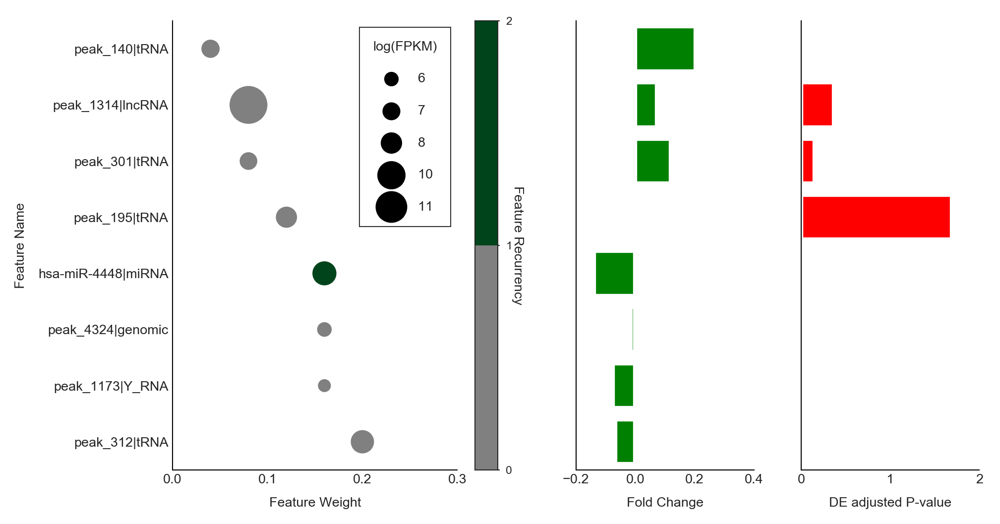

In [920]:
fig, (ax, ax1,ax2) = plt.subplots(1,3, figsize=(7,4),gridspec_kw = {'width_ratios':[2, 1,1]})
#scalefactor=0.1
#print (dataframe_rpkm.shape)
print (recurrence)
#cmaps = sns.cubehelix_palette(10, start=0.1,rot=-0.2)
#ax.scatter(dataframe.weight, np.arange(nums_retain),
 #           c = np.array(sns.cubehelix_palette(10, start=0.1,rot=-0.2))[recurrence-1], s=(dataframe_rpkm.rpkm)*scalefactor)
#cmap = plt.get_cmap("viridis")
cmap = plt.cm.BuGn#"viridis"
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
cmaplist[0] = (.5,.5,.5,1.0)
# create the new map
cmaps = cmap.from_list('Custom cmap', cmaplist, cmap.N)
# define the bins and normalize
bounds = np.linspace(0,recurrence.max(),recurrence.max()+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
im = ax.scatter(dataframe.weight, np.arange(nums_retain),cmap=cmaps,norm=norm,
        c = recurrence-1, s=(((dataframe_rpkm.rpkm[::1])/6.0-0.5)*10)**2)
cbar =fig.colorbar(im, ax=ax)
cbar.set_label('Feature Recurrency',weight='bold')
#ax.set_xlabel("weight",fontsize=30,fontdict=dict(weight='bold'))
#ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
ax.set_yticks(np.arange(10))
ax.set_yticklabels(featurename)
if sequencing_type =='short':
    mattype = 'Log CPM'
elif sequencing_type =='long':
    mattype = 'Log RPKM'
#make a legend:
# pws = np.round(np.array([np.min(dataframe_rpkm.rpkm),np.percentile(dataframe_rpkm.rpkm,0.2),
#                np.percentile(dataframe_rpkm.rpkm,0.4),np.percentile(dataframe_rpkm.rpkm,0.6),
#                np.percentile(dataframe_rpkm.rpkm,0.8),np.max(dataframe_rpkm.rpkm)]),2)
interval = np.max(dataframe_rpkm.rpkm) - np.min(dataframe_rpkm.rpkm)
ratiointer = interval/5
#pws = np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer),0).astype(int)
pws = set(np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm),ratiointer),0).astype(int))
for pw in pws:
    ax.scatter([], [], s=((pw/6.0-0.5)*10)**2, c="k",label=str(pw))

#h,l = ax.get_legend_handles_labels()

#ax.set_yticklabels(np.arange(5,11)/10,fontticklabel)
#ax.set_xticklabels(np.concatenate((np.arange(1,10),np.arange(10,60,10))).astype('str'),fontticklabel)

#mpl.rcParams['title_fontsize']=6
#ax.legend(h[1:], l[1:], labelspacing=2, title=mattype, borderpad=1,  fontsize=20,
#            frameon=True, framealpha=0.6, edgecolor="k", facecolor="w",prop={'size':25,'weight':'bold'})
sns.barplot(ax=ax1,data=dataframe_,y='name',x='fc',color='g',saturation=1)
sns.barplot(ax=ax2,data=dataframe_de,y='name',x='DE_padj',color='r',saturation=1)

#ax = std_plot(ax,'Feature Weight','Feature Name',None,'log CPM',borderpad=2)
ax = std_plot(ax,'Feature Weight','Feature Name',None,'log(FPKM)',
              borderpad=1,labelspacing=1.5,handletextpad=1,cbar=cbar,cbarlabel='Feature Recurrency',
              xlim=[0,0.3],ylim=[-0.5,nums_retain-0.5])
ax1 = std_plot(ax1,'Fold Change','',None)#,moveyaxis=True)
#print(ax1.get_xticklabels())
ax2 = std_plot(ax2,'DE adjusted P-value','',None,None)
ax1.set_yticks([])
ax2.set_yticks([])
cbar.ax.

In [937]:
vars(cbar.ax.spines['top'])['_linewidth']

3

In [934]:
vars(cbar.ax.spines['top'])

{'_stale': True,
 'stale_callback': <function matplotlib.artist._stale_axes_callback(self, val)>,
 '_axes': <matplotlib.axes._subplots.AxesSubplot at 0x7fba5ed616a0>,
 'figure': <Figure size 2100x1200 with 4 Axes>,
 '_transform': <matplotlib.transforms.BlendedGenericTransform at 0x7fba5c96f550>,
 '_transformSet': True,
 '_visible': True,
 '_animated': False,
 '_alpha': None,
 'clipbox': None,
 '_clippath': None,
 '_clipon': True,
 '_label': '',
 '_picker': None,
 '_contains': None,
 '_rasterized': None,
 '_agg_filter': None,
 '_mouseover': False,
 'eventson': False,
 '_oid': 0,
 '_propobservers': {},
 '_remove_method': None,
 '_url': None,
 '_gid': None,
 '_snap': None,
 '_sketch': None,
 '_path_effects': [],
 '_sticky_edges': _XYPair(x=[], y=[]),
 '_in_layout': True,
 '_hatch_color': (0.15, 0.15, 0.15, 1.0),
 '_fill': True,
 '_original_edgecolor': '.15',
 '_edgecolor': (0.15, 0.15, 0.15, 1.0),
 '_original_facecolor': 'none',
 '_facecolor': (0.0, 0.0, 0.0, 0.0),
 '_us_dashes': (None, N

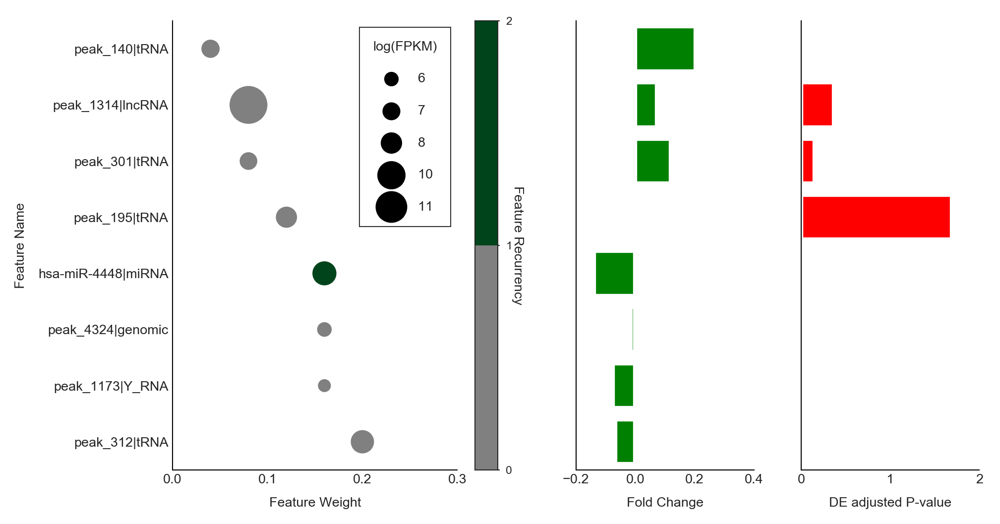

In [938]:
fig

In [775]:
np.arange(np.min(dataframe_rpkm.rpkm),
          np.max(dataframe_rpkm.rpkm),
          (np.max(dataframe_rpkm.rpkm)-np.min(dataframe_rpkm.rpkm))/5)

array([ 7.0959828 ,  8.07775185,  9.0595209 , 10.04128995, 11.023059  ])

In [780]:
np.arange(nums_retain)

array([0, 1, 2, 3, 4, 5, 6, 7])

In [791]:
dataframe_rpkm.rpkm[::-1]

0     7.925632
1     7.939900
2    12.004828
3     7.703390
4     9.651918
5     7.095983
6    10.985287
7    10.225593
Name: rpkm, dtype: float64

In [774]:
np.max(dataframe_rpkm.rpkm)

12.004828047618105

In [769]:
dataframe_rpkm

,name,rpkm
7,peak_140|tRNA,10.225593
6,peak_1314|lncRNA,10.985287
5,peak_301|tRNA,7.095983
4,peak_195|tRNA,9.651918
3,hsa-miR-4448|miRNA,7.703390
2,peak_4324|genomic,12.004828
1,peak_1173|Y_RNA,7.939900
0,peak_312|tRNA,7.925632


## my own effort1

In [271]:
 rcParams["legend.borderpad"]

0.4

In [909]:
feature_weight_table = pd.concat(( feature_weight_table,(feature_weight_table.iloc[:,:-1] !=0).sum(axis=1)),axis=1)
#display(feature_weight_table)
selected_table = feature_weight_table.iloc[:,nums_retain-1:]
selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]
#display(detable.loc[selected_feature])
deselected = -np.log10(detable.loc[selected_feature].iloc[np.argsort(feature_weight)].padj)
#print (deselected)
#print (selected_feature.shape[0])
nums_retain = min(selected_feature.shape[0],nums_retain)
selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]
#display(selected_table)
featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
#feature_weight = np.array(feature_weight_table.sum(axis=1))
feature_weight = np.array(selected_table.iloc[:,0])
fc = np.array(selected_table.iloc[:,1])
fc = fc[np.argsort(-feature_weight)]
recurrence = np.array(selected_table.iloc[:,2])
recurrence = recurrence[np.argsort(-feature_weight)]
rpkm = np.array(rpkmtable.mean(axis=1))
rpkm = rpkm[np.argsort(-feature_weight)]

featurename = featurename[np.argsort(-feature_weight)]
#display(selected_table,featurename,rpkm)
selected_feature = selected_feature[np.argsort(-feature_weight)]
feature_weight = -np.sort(-feature_weight)
featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
dataframe.weight  =  pd.to_numeric(dataframe.weight)
dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])

TypeError: unhashable type: 'numpy.ndarray'

In [910]:
compare_group='Normal-CRC'
preprocess_method='filter.null.Norm_CPM_top.Batch_RUV.domains_combined'

In [911]:
if sequencing_type =='short':
    tmptable = cpmtable[compare_group]
elif sequencing_type =='long':
    tmptable = rpkmtable[compare_group]
detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                   ,index_col=0) 
detable

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,7.488493,-0.214997,0.133000,-1.616512,0.105984,0.288235
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,452.175696,-0.231315,0.120180,-1.924728,0.054263,0.215302
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,5143.791326,0.019364,0.133298,0.145273,0.884496,0.936268
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,281.174797,-0.013084,0.078822,-0.165993,0.868162,0.927611
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,52856.881813,-0.024768,0.075903,-0.326312,0.744188,0.852440
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,40.015681,-0.208661,0.107014,-1.949850,0.051194,0.211427
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,4809.769292,-0.096757,0.109228,-0.885829,0.375709,0.573031
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,2693.231943,-0.081324,0.089073,-0.912999,0.361243,0.560043
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,1523.610254,0.008237,0.105139,0.078344,0.937554,0.968368
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,118.717513,-0.197010,0.096692,-2.037495,0.041600,0.198330


In [913]:
plt.rcParams['figure.dpi'] = 300
matplotlib.rcParams['axes.linewidth'] = 0.5
selected_features = {}
count = 0
scalefactor=np.array([0.6,0.6,0.5])*300
feature_weight_table=feature_matrix[compare_group]
detable=detable
nums_retain=10                 
#original_index=original_index[compare_group]
rpkmtable=tmptable
compare_group=compare_group
scalefactor=scalefactor[0]

feature_weight_table = pd.concat(( feature_weight_table,(feature_weight_table.iloc[:,:-1] !=0).sum(axis=1)),axis=1)
#display(feature_weight_table)
selected_table = feature_weight_table.iloc[:,nums_retain-1:]
selected_feature = original_index[np.where(selected_table.iloc[:,0]!=0)]
#display(detable.loc[selected_feature])
deselected = -np.log10(detable.loc[selected_feature].iloc[np.argsort(feature_weight)].padj)
#print (deselected)
#print (selected_feature.shape[0])
nums_retain = min(selected_feature.shape[0],nums_retain)
selected_table = selected_table.iloc[np.where(selected_table.iloc[:,0]!=0)]
#display(selected_table)
featurename = np.array(selected_table.index)#np.array([selected_table.index[i].split('|')[0] for  i in range(selected_table.shape[0])])
#feature_weight = np.array(feature_weight_table.sum(axis=1))
feature_weight = np.array(selected_table.iloc[:,0])
fc = np.array(selected_table.iloc[:,1])
fc = fc[np.argsort(-feature_weight)]
recurrence = np.array(selected_table.iloc[:,2])
recurrence = recurrence[np.argsort(-feature_weight)]
rpkm = np.array(rpkmtable.mean(axis=1))
rpkm = rpkm[np.argsort(-feature_weight)]

featurename = featurename[np.argsort(-feature_weight)]
#display(selected_table,featurename,rpkm)
selected_feature = selected_feature[np.argsort(-feature_weight)]
feature_weight = -np.sort(-feature_weight)
featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),feature_weight.reshape(-1,1)),axis=1),columns=['name','weight'])
dataframe.weight  =  pd.to_numeric(dataframe.weight)
dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
dataframe_.fc  =  pd.to_numeric(dataframe_.fc)
#dataframe__= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),recurrence.reshape(-1,1)),axis=1),columns=['name','recurrence'])
#dataframe__.recurrence  =  pd.to_numeric(dataframe__.recurrence)
dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),np.log2(rpkm).reshape(-1,1)),axis=1),columns=['name','rpkm'])
dataframe_rpkm.rpkm  =  pd.to_numeric(dataframe_rpkm.rpkm)
dataframe_de= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),deselected.reshape(-1,1)),axis=1),columns=['name','DE_padj'])
dataframe_de.DE_padj  =  pd.to_numeric(dataframe_de.DE_padj)
#display(dataframe_rpkm)
dataframe_ = dataframe_.iloc[::-1]
dataframe_rpkm = dataframe_rpkm.iloc[::-1]
dataframe_de =  dataframe_de.iloc[::-1]
fig, (ax, ax1,ax2) = plt.subplots(1,3, figsize=(7,4),gridspec_kw = {'width_ratios':[2, 1,1]})
#scalefactor=0.1
#print (dataframe_rpkm.shape)
print (recurrence)
#cmaps = sns.cubehelix_palette(10, start=0.1,rot=-0.2)
#ax.scatter(dataframe.weight, np.arange(nums_retain),
 #           c = np.array(sns.cubehelix_palette(10, start=0.1,rot=-0.2))[recurrence-1], s=(dataframe_rpkm.rpkm)*scalefactor)
#cmap = plt.get_cmap("viridis")
cmap = plt.cm.BuGn#"viridis"
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
cmaplist[0] = (.5,.5,.5,1.0)
# create the new map
cmaps = cmap.from_list('Custom cmap', cmaplist, cmap.N)
# define the bins and normalize
bounds = np.linspace(0,recurrence.max(),recurrence.max()+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
im = ax.scatter(dataframe.weight, np.arange(nums_retain),cmap=cmaps,norm=norm,
            c = recurrence-1, s=(((dataframe_rpkm.rpkm)/6.0-0.5)*10)**2)
cbar =f.colorbar(im, ax=ax)
cbar.set_label('Feature Recurrency',weight='bold')
#ax.set_xlabel("weight",fontsize=30,fontdict=dict(weight='bold'))
#ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
ax.set_yticks(np.arange(10))
ax.set_yticklabels(featurename)
if sequencing_type =='short':
    mattype = 'Log CPM'
elif sequencing_type =='long':
    mattype = 'Log RPKM'
#make a legend:
# pws = np.round(np.array([np.min(dataframe_rpkm.rpkm),np.percentile(dataframe_rpkm.rpkm,0.2),
#                np.percentile(dataframe_rpkm.rpkm,0.4),np.percentile(dataframe_rpkm.rpkm,0.6),
#                np.percentile(dataframe_rpkm.rpkm,0.8),np.max(dataframe_rpkm.rpkm)]),2)
interval = np.max(dataframe_rpkm.rpkm) - np.min(dataframe_rpkm.rpkm)
ratiointer = interval/8
pws = set(np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm),ratiointer),0).astype(int))
for pw in pws:
    ax.scatter([], [], s=((pw/6.0-0.5)*10)**2, c="k",label=str(pw))


#ax.legend(h[1:], l[1:])
#ax.set_yticklabels(np.arange(5,11)/10,fontticklabel)
#ax.set_xticklabels(np.concatenate((np.arange(1,10),np.arange(10,60,10))).astype('str'),fontticklabel)

pyplot.draw()
ax = std_plot(ax,'Feature Weight','Feature Name',None,'log CPM',borderpad=1,labelspacing=1.5,handletextpad=1,cbar=cbar,cbarlabel='Feature Recurrency',xlim=[0,0.3])
#h,l = ax.get_legend_handles_labels()
#l,h = zip(*sorted(zip(l,h))) #, key=lambda t: int(t[0])
#ax.legend(h, l)
#mpl.rcParams['title_fontsize']=6
#ax.legend(h[1:], l[1:], labelspacing=1.2, title=mattype, borderpad=1,  fontsize=20,
#            frameon=True, framealpha=0.6, edgecolor="k", facecolor="w",prop={'size':25,'weight':'bold'})
sns.barplot(ax=ax1,data=dataframe_,y='name',x='fc',color='g',saturation=1)
#sns.barplot(ax=ax2,data=dataframe_de,y='name',x='DE_padj',color='r',saturation=1)

pyplot.draw()
#ax1.get_yaxis().set_ticks([])
ax1.set_yticks([])
ax1 = std_plot(ax1,'Fold Change','',None,moveyaxis=True)
sns.barplot(ax=ax2,data=dataframe_de,y='name',x='DE_padj',color='r',saturation=1)
pyplot.draw()
ax2 = std_plot(ax2,'DE adjusted P-value','',None,None)
#ax2.set_yticks([])
#plt.setp(fig, linewidth=2.0)
#f.tight_layout()


TypeError: unhashable type: 'numpy.ndarray'

In [746]:
pws

{6, 7, 8, 9, 10}

In [719]:
l

('10', '7', '8', '9')

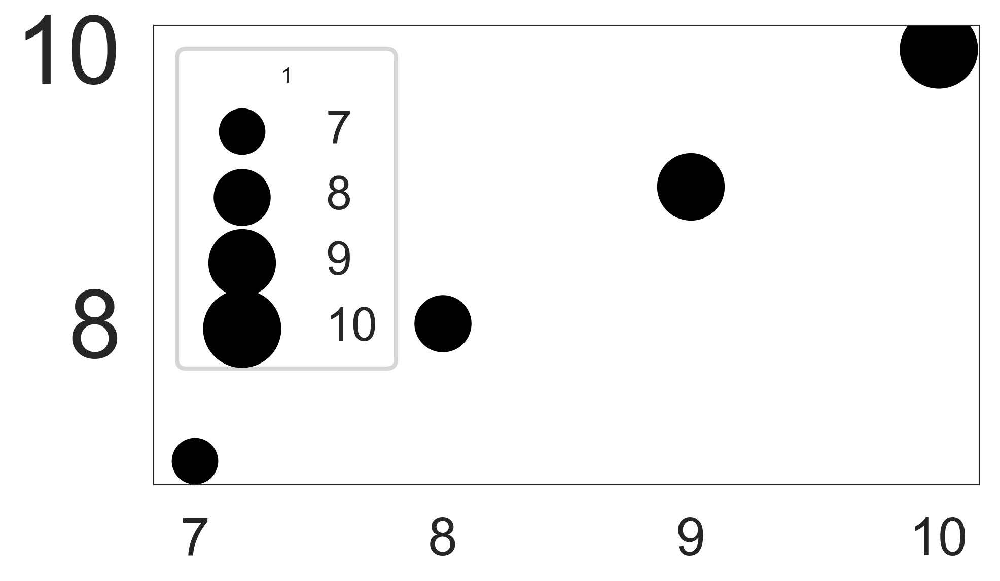

In [707]:
fig,ax=plt.subplots(figsize=(7,4))
for pw in pws:
    ax.scatter(pw, pw, s=((pw/6.0-0.5)*30)**2, c="k",label=str(pw))
h,l = ax.get_legend_handles_labels()
l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) #, key=lambda t: t[0])
ax.legend(h,l,title="1")#h[1:],l[1:],

In [711]:
int(l[1])

8

In [689]:
sorted(zip(l,h), key=lambda t: t[0])

[('10', <matplotlib.collections.PathCollection at 0x7fba5dbe7278>),
 ('7', <matplotlib.collections.PathCollection at 0x7fba5dbe75c0>),
 ('8', <matplotlib.collections.PathCollection at 0x7fba5dbddb70>),
 ('9', <matplotlib.collections.PathCollection at 0x7fba5dbddf60>)]

In [676]:
image_link('demo_.pdf')

In [701]:
sorted([10,11,2,3,6,5])

[2, 3, 5, 6, 10, 11]

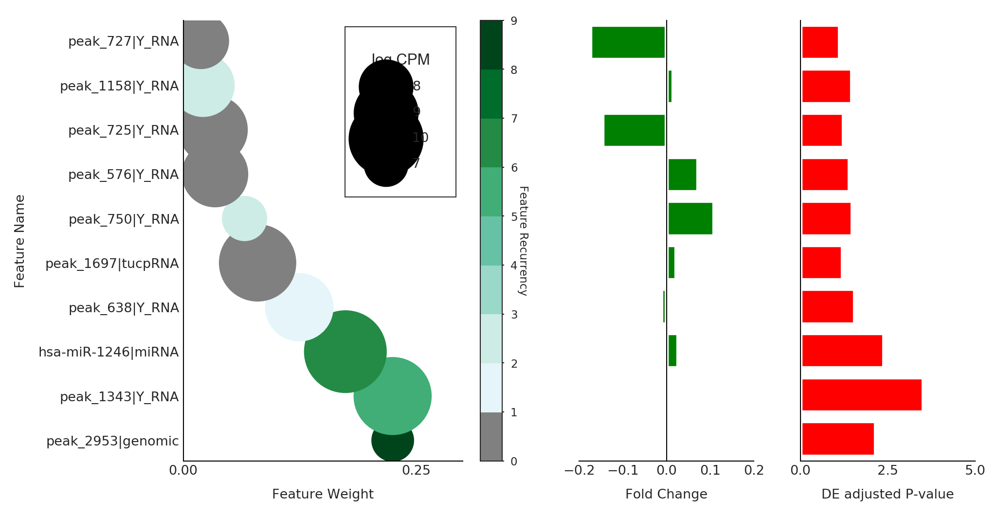

In [670]:
ax1.spines['left'].set_position(('data',0))
fig

In [661]:
cbar.ax.tick_params(direction='out', pad=3,width=0.5,length=1)

In [662]:
ax.set_xlabel

<bound method Axes.set_xlabel of <matplotlib.axes._subplots.AxesSubplot object at 0x7fba5ee89160>>

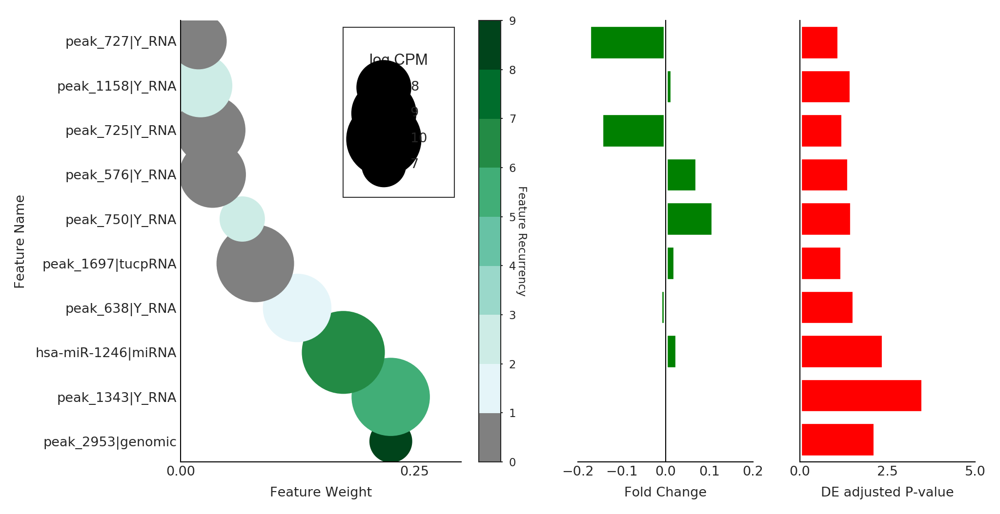

In [663]:
fig

In [640]:
ax1.spines['left'].set_position(('data',0))
ax2.spines['left'].set_position(('data',0))

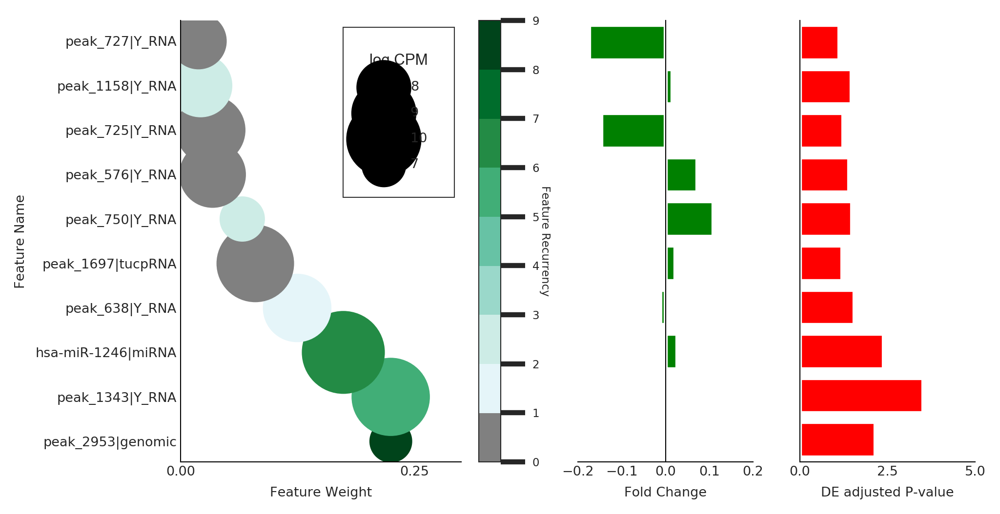

In [641]:
fig

In [635]:
cbar.ax.get_yticks()

array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ])

In [637]:
list(cbar.ax.get_yticklabels())

[Text(1, 0.0, '0'),
 Text(1, 0.1111111111111111, '1'),
 Text(1, 0.2222222222222222, '2'),
 Text(1, 0.3333333333333333, '3'),
 Text(1, 0.4444444444444444, '4'),
 Text(1, 0.5555555555555556, '5'),
 Text(1, 0.6666666666666666, '6'),
 Text(1, 0.7777777777777777, '7'),
 Text(1, 0.8888888888888888, '8'),
 Text(1, 1.0, '9')]

In [629]:
cbar.ax.locator_params("y",)

In [633]:
ax.locator_params("x",5)

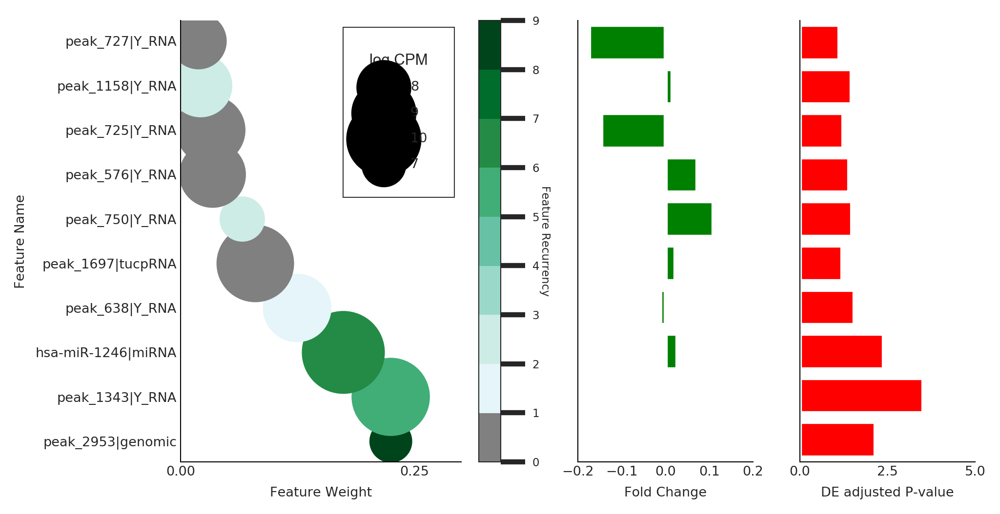

In [634]:
fig

In [573]:
cbar.ax.spines['top'].set_visible(False)
cbar.ax.spines['right'].set_visible(False)
cbar.ax.spines['bottom'].set_visible(False)
cbar.ax.spines['left'].set_visible(False)

In [590]:
ax.spines['top'].set_color('r')

In [595]:
image_link('demo_.pdf')

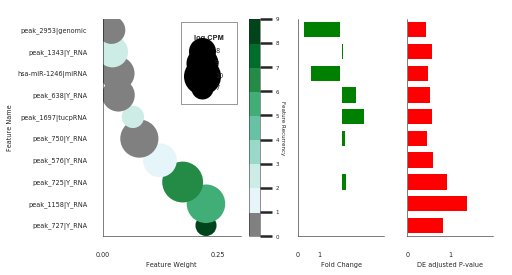

In [591]:
fig

In [493]:
ax.legend_.get_frame()._linewidth=0.5
ax.legend_.get_frame()._linewidth

0.5

In [495]:
vars(ax.spines['bottom'])

{'_stale': False,
 'stale_callback': <function matplotlib.artist._stale_axes_callback(self, val)>,
 '_axes': <matplotlib.axes._subplots.AxesSubplot at 0x7fbaaa1a60b8>,
 'figure': <Figure size 504x288 with 4 Axes>,
 '_transform': <matplotlib.transforms.BlendedGenericTransform at 0x7fbaab9dfef0>,
 '_transformSet': True,
 '_visible': True,
 '_animated': False,
 '_alpha': None,
 'clipbox': None,
 '_clippath': None,
 '_clipon': True,
 '_label': '',
 '_picker': None,
 '_contains': None,
 '_rasterized': None,
 '_agg_filter': None,
 '_mouseover': False,
 'eventson': False,
 '_oid': 0,
 '_propobservers': {},
 '_remove_method': None,
 '_url': None,
 '_gid': None,
 '_snap': None,
 '_sketch': None,
 '_path_effects': [],
 '_sticky_edges': _XYPair(x=[], y=[]),
 '_in_layout': True,
 '_hatch_color': (0.15, 0.15, 0.15, 1.0),
 '_fill': True,
 '_original_edgecolor': '.15',
 '_edgecolor': (0.15, 0.15, 0.15, 1.0),
 '_original_facecolor': 'none',
 '_facecolor': (0.0, 0.0, 0.0, 0.0),
 '_us_dashes': (None, No

In [582]:
image_link('demo_.pdf')

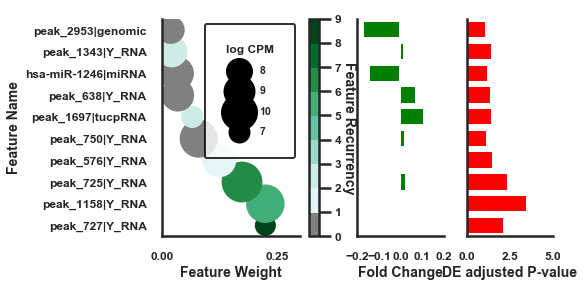

In [442]:
f

In [414]:
np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm),ratiointer),0).astype(int)

array([ 7,  7,  8,  8,  9,  9, 10, 10])

In [423]:
dataframe.weight

0    0.224797
1    0.224695
2    0.173985
3    0.124552
4    0.079766
5    0.065808
6    0.034096
7    0.032081
8    0.021243
9    0.018977
Name: weight, dtype: float64

In [422]:
featurename

array(['peak_2953|genomic', 'peak_1343|Y_RNA', 'hsa-miR-1246|miRNA',
       'peak_638|Y_RNA', 'peak_1697|tucpRNA', 'peak_750|Y_RNA',
       'peak_576|Y_RNA', 'peak_725|Y_RNA', 'peak_1158|Y_RNA',
       'peak_727|Y_RNA'], dtype='<U18')

In [407]:
pws

{7, 8, 9, 10}

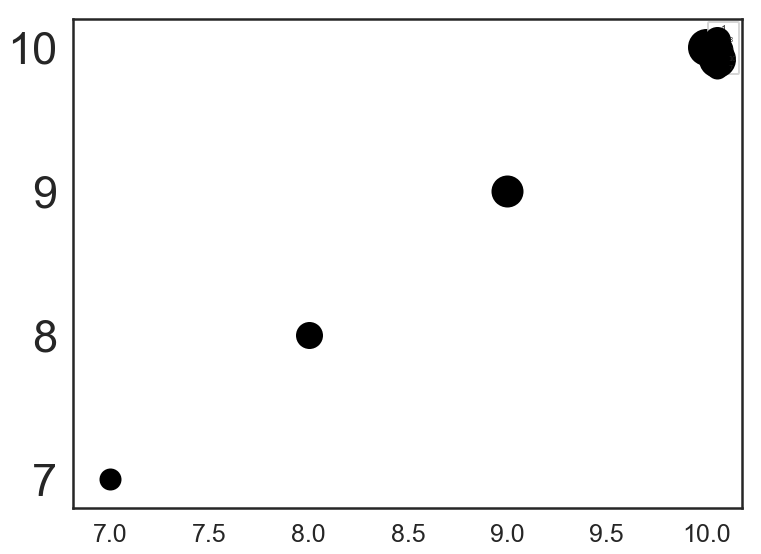

In [472]:
fig,ax=plt.subplots(figsize=(12,9))
for pw in pws:
    ax.scatter(pw, pw, s=((pw/6.0-0.5)*30)**2, c="k",label=str(pw))
h,l = ax.get_legend_handles_labels()
ax.legend(title="1",prop=fontlegend)


In [401]:
np.max(dataframe_rpkm.rpkm)

10.766289584851329

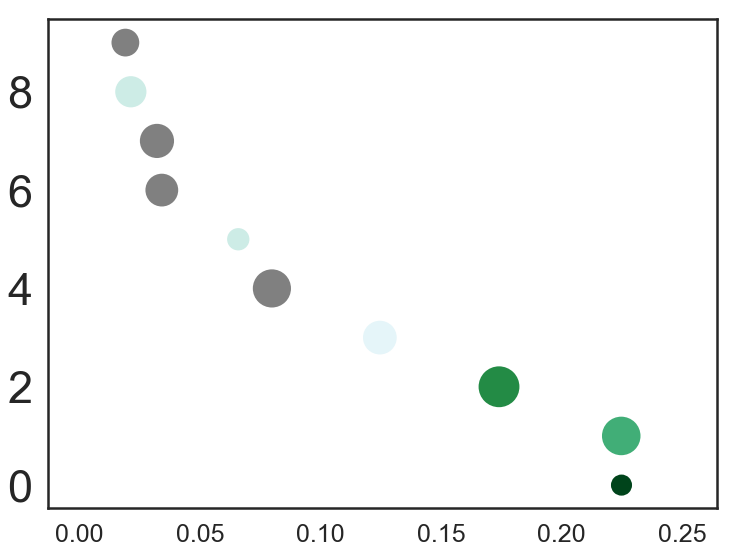

In [389]:
fig,ax=plt.subplots(figsize=(12,9))
im = ax.scatter(dataframe.weight, np.arange(nums_retain),cmap=cmaps,norm=norm,
            c = recurrence-1, s=(((dataframe_rpkm.rpkm)/6.0-0.5)*30)**2)

In [390]:
featurename

array(['peak_2953|genomic', 'peak_1343|Y_RNA', 'hsa-miR-1246|miRNA',
       'peak_638|Y_RNA', 'peak_1697|tucpRNA', 'peak_750|Y_RNA',
       'peak_576|Y_RNA', 'peak_725|Y_RNA', 'peak_1158|Y_RNA',
       'peak_727|Y_RNA'], dtype='<U18')

In [281]:
rcParams["legend.frameon"]

True

In [210]:
np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer)

array([ 5.57472564,  6.60259755,  7.63046946,  8.65834136,  9.68621327,
       10.71408518])

In [213]:
np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer),0)

array([ 6.,  7.,  8.,  9., 10., 11.])

In [146]:
h,l = ax.get_legend_handles_labels()

In [150]:
print(l)

[]


In [145]:
dataframe_rpkm.rpkm

0     6.893883
1     8.190146
2     7.332291
3     9.308703
4    10.714085
5     8.709743
6     5.574726
7     9.038049
8     5.633510
9     6.752476
Name: rpkm, dtype: float64

In [294]:
vars(cbar)

{'mappable': <matplotlib.collections.PathCollection at 0x7fbaa98c2518>,
 'ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fbab12596d8>,
 'alpha': None,
 'callbacksSM': <matplotlib.cbook.CallbackRegistry at 0x7fbaa9b196d8>,
 '_A': None,
 'norm': <matplotlib.colors.Normalize at 0x7fbab12595c0>,
 'cmap': <matplotlib.colors.LinearSegmentedColormap at 0x7fbaaa2162e8>,
 'colorbar': None,
 'update_dict': {'array': False},
 'values': None,
 'boundaries': None,
 'extend': 'neither',
 '_inside': slice(0, None, None),
 'spacing': 'uniform',
 'orientation': 'vertical',
 'drawedges': False,
 'filled': True,
 'extendfrac': None,
 'extendrect': False,
 'solids': <matplotlib.collections.QuadMesh at 0x7fbab0190c88>,
 'lines': [],
 'outline': <matplotlib.patches.Polygon at 0x7fbab01901d0>,
 'patch': <matplotlib.patches.Polygon at 0x7fbaa9b199e8>,
 'dividers': None,
 '_manual_tick_data_values': None,
 'ticklocation': 'right',
 '_label': 'Feature Recurrency',
 '_labelkw': {'weight': 'bold'},
 'stale': T

In [348]:
ax.get_xticklabels().set_rotation(30)

AttributeError: 'silent_list' object has no attribute 'set_rotation'

In [364]:
for tick in ax.get_xticklabels():
    tick.set_rotation(30)

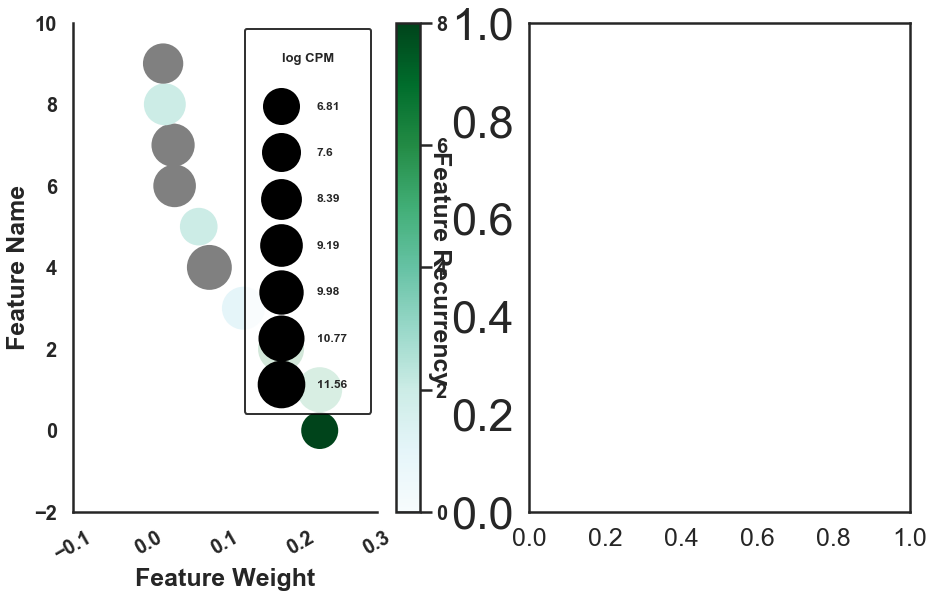

In [365]:
fig

In [357]:
ax.get_xlabel.set_rotaion(30)

AttributeError: 'function' object has no attribute 'set_rotaion'

In [346]:
cbar.ax.get_yticklabels().se labelpad

<bound method _AxesBase.ticklabel_format of <matplotlib.axes._subplots.AxesSubplot object at 0x7fbaab384c18>>

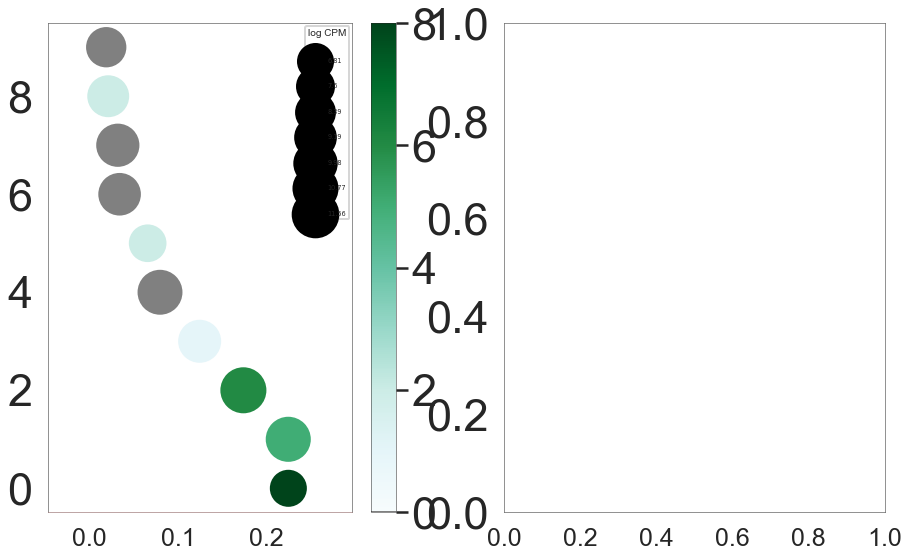

In [522]:
#matplotlib.rcParams['lines.linewidth']=0.001
fig,(ax,ax1)=subplots(1,2,figsize=(15,9))
im=ax.scatter(dataframe.weight, np.arange(nums_retain),cmap=cmaps,#norm=norm,
            c = recurrence-1, s=(dataframe_rpkm.rpkm)*scalefactor)
cbar =fig.colorbar(im, ax=ax)
#cbar.set_label('Feature Recurrency',weight='bold')
interval = np.max(dataframe_rpkm.rpkm) - np.min(dataframe_rpkm.rpkm)
ratiointer = interval/5
pws = np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer),2)
for pw in pws:
    ax.scatter([], [], s=pw*scalefactor, c="k",label=str(pw))
#h,l = ax.get_legend_handles_labels()
#ax.legend(labelspacing=1.2, borderpad=1)
l = ax.legend(title="log CPM",labelspacing=3,prop=fontlegend,handletextpad=1)
ax.spines['bottom'].set_color('#000000')
#ax = std_plot(ax,'Feature Weight','Feature Name',None,'log CPM',borderpad=2,cbar=cbar,cbarlabel='Feature Recurrency')
#pyplot.draw()
#locator, formatter = cbar._get_ticker_locator_formatter()
#ticks, ticklabels, offset_string = cbar._ticker(locator, formatter)
#cbar.set_label('Feature Recurrency',fontdict = fontlabel,Rotation=270,labelpad=25)
#cbar.ax.set_yticks(cbar.ax.get_yticks())
#cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(),fontticklabel)
#list(cbar.ax.get_yticklabels())
#ax = std_plot(ax,'Feature Weight','Feature Name',None,'log CPM',None)
#h[1:], l[1:], 
#fontsize=20,frameon=True, framealpha=0.6, edgecolor="k", facecolor="w",prop={'size':25,'weight':'bold'}

In [515]:
ax.spines['bottom'].set_color('#00000')

(0.15, 0.15, 0.15, 1.0)

In [338]:
ticklabels

['0', '1', '2', '3', '4', '5', '6', '7', '8']

In [312]:
fontticklabel

{'family': 'Arial', 'weight': 'bold', 'size': 20}

In [307]:
ticklabels

['0', '2', '4', '6', '8']

In [303]:
locator, formatter = cbar._get_ticker_locator_formatter()
ticks, ticklabels, offset_string = cbar._ticker(locator, formatter)

In [178]:
PWS = [int(round(pw)) for pw in pws]

In [225]:
np.round(np.arange(np.min(dataframe_rpkm.rpkm),np.max(dataframe_rpkm.rpkm)+ratiointer,ratiointer),2)

array([ 5.57,  6.6 ,  7.63,  8.66,  9.69, 10.71])

In [173]:
round?

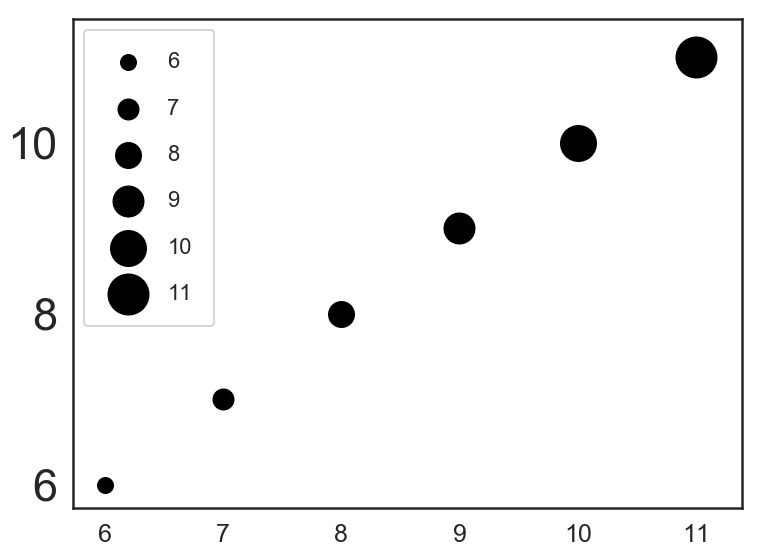

In [208]:
fig,ax=subplots(figsize=(12,9))
for pw in PWS:
    ax.scatter(pw, pw, s=((pw/min(PWS)-0.5)*30)**2, c="k",label=str(pw))
ax.legend(labelspacing=1.2, borderpad=1)

In [133]:
recurrence

array([4, 9, 6, 4, 2, 1, 2, 1, 1, 1])

No handles with labels found to put in legend.
No handles with labels found to put in legend.


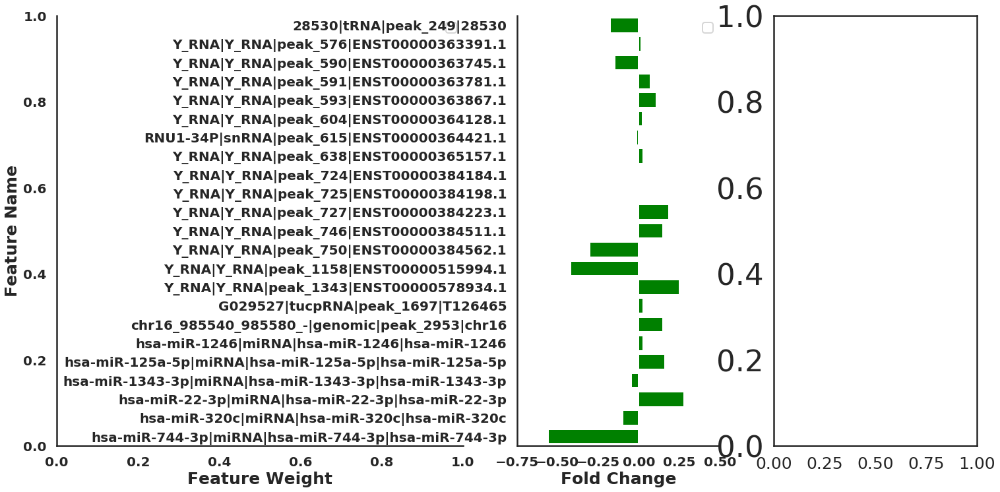

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [115]:
feature_weight_table = feature_matrix[compare_group]
feature_weight_table = pd.concat(( feature_weight_table,(feature_weight_table.iloc[:,:-1] !=0).sum(axis=1)),axis=1)
fc = np.array(selected_table.iloc[:,1])
feature_weight = np.array(selected_table.iloc[:,0])
fc = fc[np.argsort(-feature_weight)]
selected_table = feature_weight_table.iloc[:,9:]
featurename = np.array(selected_table.index)
dataframe_= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),fc.reshape(-1,1)),axis=1),columns=['name','fc'])
f, (ax, ax1,ax2) = plt.subplots(1,3, figsize=(10*2.5,12),gridspec_kw = {'width_ratios':[2, 1,1]})
sns.barplot(ax=ax1,data=dataframe_,y='name',x='fc',color='g',saturation=1)
ax = std_plot(ax,'Feature Weight','Feature Name',None)
ax1 = std_plot(ax1,'Fold Change','',None)

## expression value of selected feature in TCGA data

In [957]:
tcga_dataset = 'tcga_crc'
tcga_cpm = pd.read_table('output/'+tcga_dataset+
                         '/matrix_processing/filter.null.Norm_CPM.Batch_null.transcript.txt',index_col=0)
#tcga_cpm = pd.read_table('output/'+tcga_dataset+
#                        '/count_matrix/transcript.txt',index_col=0)

selectedfeature = selected_features['Normal-CRC']
selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]

sample_class_tcga = pd.read_table('data/'+tcga_dataset+'/sample_classes.txt',index_col=0)
selectedfeature_overlap = selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]
testtable = tcga_cpm.loc[selectedfeature_overlap]

appended_table = []
for i in range(testtable.shape[0]):
    appended_table.append(pd.DataFrame(np.concatenate((np.array(sample_class_tcga.loc[testtable.columns]).reshape(-1,1),
                            np.array(testtable.iloc[i].T).reshape(-1,1),
              np.repeat(testtable.index[i].split('|')[2],testtable.shape[1]).reshape(-1,1)),axis=1)))
appended_table=  pd.concat(appended_table, axis=0)
appended_table.columns = ['class','value','gene']
appended_table.value = np.log2(pd.to_numeric(appended_table.value)+0.001)
appended_table['class'][appended_table['class']!='Normal'] ='Cancer'

sys.path.append('bin')
#from statannot import *#add_stat_annotation
import statannot

fig,ax=plt.subplots(1,figsize=(selectedfeature_overlap.shape[0]*4,8))

x = 'gene'
y = 'value'
hue = 'class'
sns.boxplot(ax=ax,data=appended_table, x=x, y=y, hue=hue)
add_stat_annotation(ax=ax, data=appended_table, x=x, y=y, hue=hue,
                    boxPairList=np.array([((selectedfeature_overlap[i].split('|')[2],'Normal'),
           (selectedfeature_overlap[i].split('|')[2],'Cancer')) 
          for i in range(selectedfeature_overlap.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
ax = std_plot(ax,'Gene','Expression Value',None)

ModuleNotFoundError: No module named 'statannot'

## ROC: selected feature classification result

In [513]:
def find_metrics_best_for_shuffle(fpr,tpr):
    '''
    used for shuffle roc plot
    '''
    a = 1 - fpr 
    b = tpr
    Sensitivity = b
    Specificity = a
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    auc = sklearn.metrics.auc(a,b)
    thres = 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def get_probs_split(filename,interpolatednum=10000,confidence=0.95):
    '''
    get probs from split
    use interpolation to calculate CI
    '''
    xvals = np.linspace(0, 1, interpolatednum)
    with h5py.File(filename,'r') as f:
        predictions =  f['predictions'][:]
        train_index =  f['train_index'][:]
        label = f['labels'][:]
    probs,labels,interpolatedvalue = {},{},{}
    for i in range(predictions.shape[0]):
        probs[i] = predictions[i][~train_index[i]]
        labels[i] = label[~train_index[i]]
        interpolatedvalue[i] = np.interp(xvals,plot_roc( probs[i],labels[i])[1],plot_roc( probs[i],labels[i])[2] )
    interarray = np.array([interpolatedvalue[i]  for i in range(predictions.shape[0])])
    mean,minimum,maximum = np.ndarray([interpolatednum]),np.ndarray([interpolatednum]),np.ndarray([interpolatednum])
    for i in range(interpolatednum):
        mean[i],minimum[i],maximum[i] = mean_confidence_interval(interarray[:,i],confidence)
    return np.concatenate((np.zeros(1),mean,np.ones(1))),np.concatenate((np.zeros(1),minimum,np.ones(1))),\
np.concatenate((np.zeros(1),maximum,np.ones(1))),interpolatednum+2
def plot_roc(prob,label):
    fpr, tpr, _ = roc_curve(label, prob)
    roc_auc = sklearn.metrics.auc(fpr, tpr)
    return roc_auc,fpr, tpr
def find_metrics_best(label,expressionlevel):
    posinum = np.sum(label)
    neganum = label.shape[0] - np.sum(label)
    a,b,c= roc_curve(label,expressionlevel) #fpr tpr threshold
    fp = a*neganum
    tp = b*posinum
    tn = (1-a)*neganum
    fn = (1-b)*posinum
    #Sensitivity = tp/(tp+fn) 
    #Specificity = tn/(tn+fp) 
    Sensitivity = b
    Specificity = 1 - a
    PPV = tp/(tp+fp) 
    NPV = tn/(tn+fn) 
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    mcc_mean = (tp*tn-fp*fn)/(((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))**0.5)
    F1_score = 2*tp/(2*tp+fn+fp)
    auc = sklearn.metrics.auc(a,b)
    acc = (tp+tn)/(tp+tn+fn+fp)
    distoleftup = (a**2+(1-b)**2)**0.5# to the left up
    #print ("AUC:" +str(auc)) 
    thres = int(label.shape[0]/10.) if int(label.shape[0]/10.)>0 else 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres],np.argsort(-mcc_mean)[:thres],np.argsort(-F1_score)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def get_auc_stats(root_path,sample_path):
    '''
    sample_path:hccpath,stagepath
    '''
    auc_metrics_jack = {}
    auc_metrics_split = {}
    for i in os.listdir(root_path+sample_path):
        #print (i)
        try:
            print (i, ' file found')
            if i.split('.')[-1] == 'shuffle_split':
                auc_metrics_split[i] = h5py.File(root_path+sample_path+i+'/evaluation.shuffle_split.h5')
            else:
                with h5py.File(root_path+sample_path+i+'/evaluation.leave_one_out.h5','r') as f:
                    predictions =  f['predictions'][:]
                    train_index =  f['train_index'][:]
                    auc_metrics_jack[i]  = predictions[~train_index]
        except:
            print (i, ' file not found')
            print ('files in the directory: ',os.listdir(root_path+sample_path+i))
    return auc_metrics_jack,auc_metrics_split
def get_speci_sensi(filename,spe_criteria=0.99):
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    total_nums = mean.shape[0]
    index = round(total_nums *(1-spe_criteria))
    return mean[index],minimum[index],maximum[index]

In [521]:
def plot_shuffle(ax,filename,show_metrics=False,savefigure=False,title=None,
                 spe_criter=0.99,savepath=savepath,savefig=True,
                 compare_group=None,markers_file=None,marker_roc_ind = np.array([0]),markername=None):
    '''
    samplepath: hccpath
    filename: 'logistic_regression.100.robust.stratified_shuffle_split/evaluation.stratified_shuffle_split.h5'
    '''  
    if markers_file is not None:
        markers_auc = {}
        for i in range(markers_file.shape[0]):
            mean,_,_,interpolatednum = get_probs_split(markers_file[i])
            xvals = np.linspace(0, 1, interpolatednum)  
            auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
            if np.isin(i,marker_roc_ind):
               # print (markername[marker_roc_ind[i]],marker_roc_ind[i])
                ax.plot(xvals,mean,linewidth=2.5,color=np.array(Category20c[20]).reshape(4,-1).T.ravel()[i],label=markername[i]+' AUC: '+str(np.round(auc,3)))
            markers_auc[i],_,_ = find_metrics_best_for_shuffle(xvals,mean)
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    xvals = np.linspace(0, 1, interpolatednum)
    ax.fill_between(xvals,minimum,maximum,where=(minimum<=maximum),color='b',alpha=0.1)   
    auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
    candidatevalue = auc
    numind = np.ceil((1-spe)/(1./(interpolatednum-2))).astype('int')
    ax.plot(xvals,mean,linewidth=4,color=Category20c[20][0],label='candidate AUC: '+str(np.round(auc,3)))
    ax.plot(xvals,minimum,linewidth=1,color='b')
    ax.plot(xvals,maximum,linewidth=1,color='b')
    h,l = ax.get_legend_handles_labels()
    legend = ax.legend(h,l)
    sen_criter = get_speci_sensi(filename,spe_criteria=spe_criter)[0]
    if show_metrics:
        if sen+0.2<=0.95:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe, sen+0.2),
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=6.5),
            )
        else:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe+0.05, sen-0.2),
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=6.5),
            )
        ax.annotate('Sensitivity '+str('%0.4s'%sen), xy=( 1-spe,sen), xytext=(1-spe+0.1, sen-0.1),
            arrowprops=dict(facecolor='black', shrink=0.1,width=1.5,headwidth=6.5),
            )
    ax.annotate('Sensitivity '+str('%0.4s'%sen_criter), xy=( 1-spe_criter,sen_criter), xytext=(1-spe_criter+0.1, sen_criter),
        arrowprops=dict(facecolor='black', shrink=0.8,width=1.5,headwidth=6.5),
        )
    ax = std_plot(ax,'False Positive Rate','True Positive Rate',title,'Marker',legendsort=False,borderpad=0.4,handletextpad=0.4)
    ax.plot([0,1],[0,1], linewidth=2,alpha=0.6,color='gray',linestyle='--')
    #ax.set_yticklabels(np.arange(0,12,2)/10,fontticklabel)
    #ax.set_xticklabels(np.arange(0,12,2)/10,fontticklabel)
    if savefig:
        fig.savefig(savepath+compare_group+'_ROC.eps', bbox_inches='tight')
    #return mean,minimum,maximum,interpolatednum
    
    return markers_auc,candidatevalue

In [621]:
markers_file = return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),de=False)
markers_auc = {}
for i in range(markers_file.shape[0]):
    mean,_,_,interpolatednum = get_probs_split(markers_file[i])
    xvals = np.linspace(0, 1, interpolatednum)  
    auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
    if np.isin(i,marker_roc_ind):
       # print (markername[marker_roc_ind[i]],marker_roc_ind[i])
        ax.plot(xvals,mean,linewidth=2.5,color='gray',label=markername[i]+' AUC: '+str(np.round(auc,3)))
    markers_auc[i],_,_ = find_metrics_best_for_shuffle(xvals,mean)

In [534]:
mean,_,_,interpolatednum = get_probs_split(markers_file[0])
xvals = np.linspace(0, 1, interpolatednum) 
auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean)

In [556]:
markers_file[0]

'output/scirep/evaluate_features/result/Normal-PRAD/control_markers_0/random_forest/evaluation.stratified_shuffle_split.h5'

In [610]:
with h5py.File(markers_file[0],'r') as f:
    predictions =  f['predictions'][:]
    train_index =  f['train_index'][:]
    label = f['labels'][:]

In [579]:
predictions

array([[0.35493386, 0.35493386, 0.73656206, ..., 0.55971105, 0.77025792,
        0.64022664],
       [0.2913493 , 0.2913493 , 0.76748561, ..., 0.4021079 , 0.79704311,
        0.55953325],
       [0.20081837, 0.20081837, 0.92318912, ..., 0.47599393, 0.80321051,
        0.38949673],
       ...,
       [0.19657033, 0.19657033, 0.86624269, ..., 0.62305373, 0.86082496,
        0.73001424],
       [0.24376764, 0.24376764, 0.8880056 , ..., 0.0702659 , 0.81476699,
        0.52631654],
       [0.33002658, 0.33002658, 0.68967272, ..., 0.00491228, 0.98781603,
        0.5101489 ]])

In [585]:
train_index

array([[False,  True,  True, ...,  True,  True,  True],
       [ True, False,  True, ...,  True, False,  True],
       [ True,  True, False, ...,  True, False,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True, False, ..., False,  True, False],
       [ True,  True,  True, ..., False,  True,  True]])

In [622]:
predictions[0]

array([0.35493386, 0.35493386, 0.73656206, 0.12024237, 0.32641017,
       0.14256261, 0.3410801 , 0.56093377, 0.45547508, 0.66620014,
       0.12024237, 0.14256261, 0.14256261, 0.3410801 , 0.14256261,
       0.76256561, 0.17000608, 0.34741858, 0.14256261, 0.14256261,
       0.34741858, 0.14256261, 0.13096498, 0.13096498, 0.72538855,
       0.12024237, 0.14256261, 0.3410801 , 0.32641017, 0.14256261,
       0.74630062, 0.73447602, 0.12024237, 0.73529359, 0.12024237,
       0.72538855, 0.78737135, 0.75159664, 0.56093377, 0.74630062,
       0.74712982, 0.78737135, 0.77025792, 0.354237  , 0.78737135,
       0.77025792, 0.66620014, 0.14256261, 0.76256561, 0.75159664,
       0.76998004, 0.75188773, 0.74712982, 0.76088292, 0.75159664,
       0.38271285, 0.35493386, 0.77025792, 0.74712982, 0.71779179,
       0.75188773, 0.74630062, 0.38271285, 0.75188773, 0.74630062,
       0.78737135, 0.56093377, 0.75188773, 0.34741858, 0.74630062,
       0.74630062, 0.75188773, 0.32641017, 0.78737135, 0.75188

In [623]:
train_index[0]

array([False,  True,  True,  True,  True,  True, False,  True,  True,
        True, False,  True, False, False, False,  True,  True,  True,
       False,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False,  True,
        True, False,  True,  True, False, False, False,  True,  True,
       False,  True,  True,  True,  True])

In [606]:
predictions[0][~train_index[0]]

array([0.35493386, 0.3410801 , 0.12024237, 0.14256261, 0.3410801 ,
       0.14256261, 0.14256261, 0.13096498, 0.56093377, 0.76256561,
       0.77025792, 0.75188773, 0.74630062, 0.78737135, 0.56093377,
       0.74712982, 0.76256561, 0.77025792])

In [611]:
label

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int32)

In [616]:
probs

array([0.35493386, 0.3410801 , 0.12024237, 0.14256261, 0.3410801 ,
       0.14256261, 0.14256261, 0.13096498, 0.56093377, 0.76256561,
       0.77025792, 0.75188773, 0.74630062, 0.78737135, 0.56093377,
       0.74712982, 0.76256561, 0.77025792])

In [617]:

probs = predictions[0][~train_index[0]]
labels = label[~train_index[0]]
plot_roc( probs,labels)

(1.0,
 array([0.   , 0.   , 0.   , 0.   , 0.125, 0.375, 0.75 , 1.   ]),
 array([0.1, 0.5, 0.8, 1. , 1. , 1. , 1. , 1. ]))

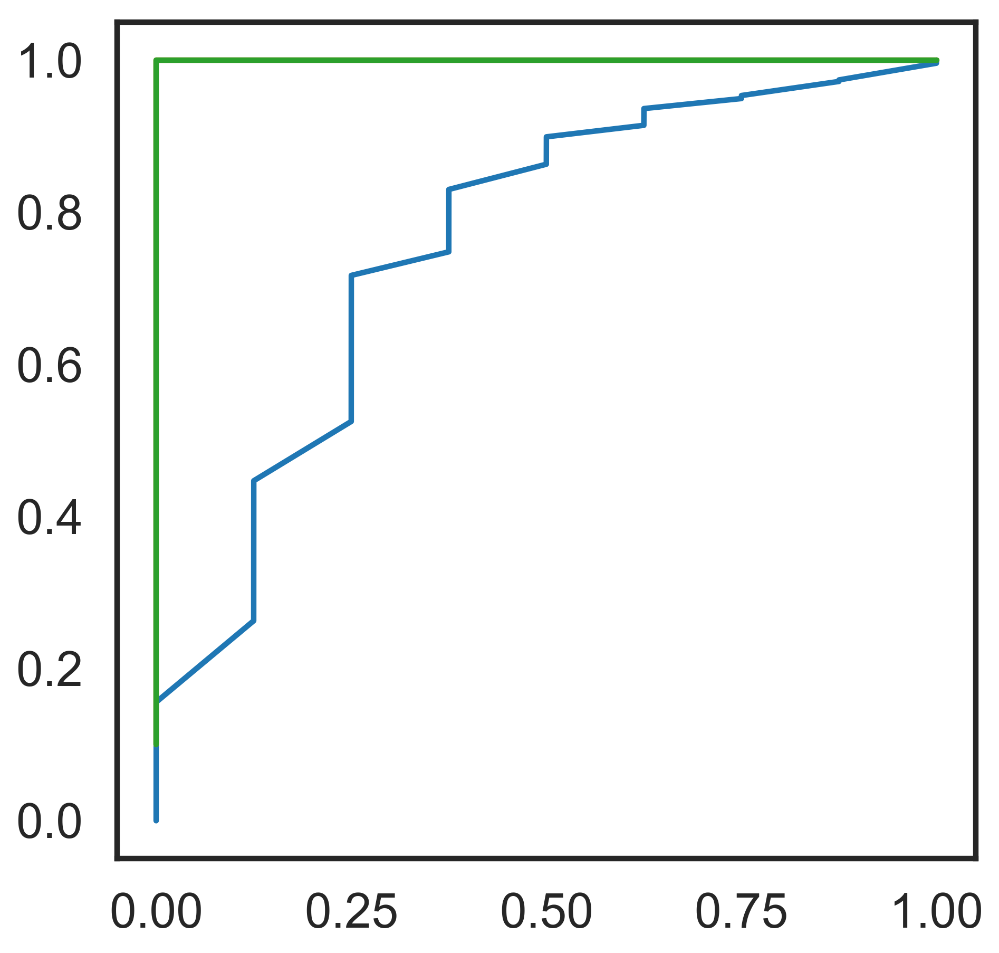

In [620]:
ax.plot(plot_roc( probs,labels)[1],plot_roc( probs,labels)[2],linewidth=2.5,)
fig

In [618]:
interpolatedvalue= np.interp(xvals,plot_roc( probs,labels)[1],plot_roc( probs,labels)[2] )

In [613]:
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [537]:
np.isin(0,marker_roc_ind['Normal-CRC'])

array(True)

In [545]:
xvals

array([0.00000000e+00, 9.99900010e-05, 1.99980002e-04, ...,
       9.99800020e-01, 9.99900010e-01, 1.00000000e+00])

In [554]:
xvals[100]

0.009999000099990002

In [546]:
mean

array([0.        , 0.156     , 0.15608561, ..., 0.9959824 , 1.        ,
       1.        ])

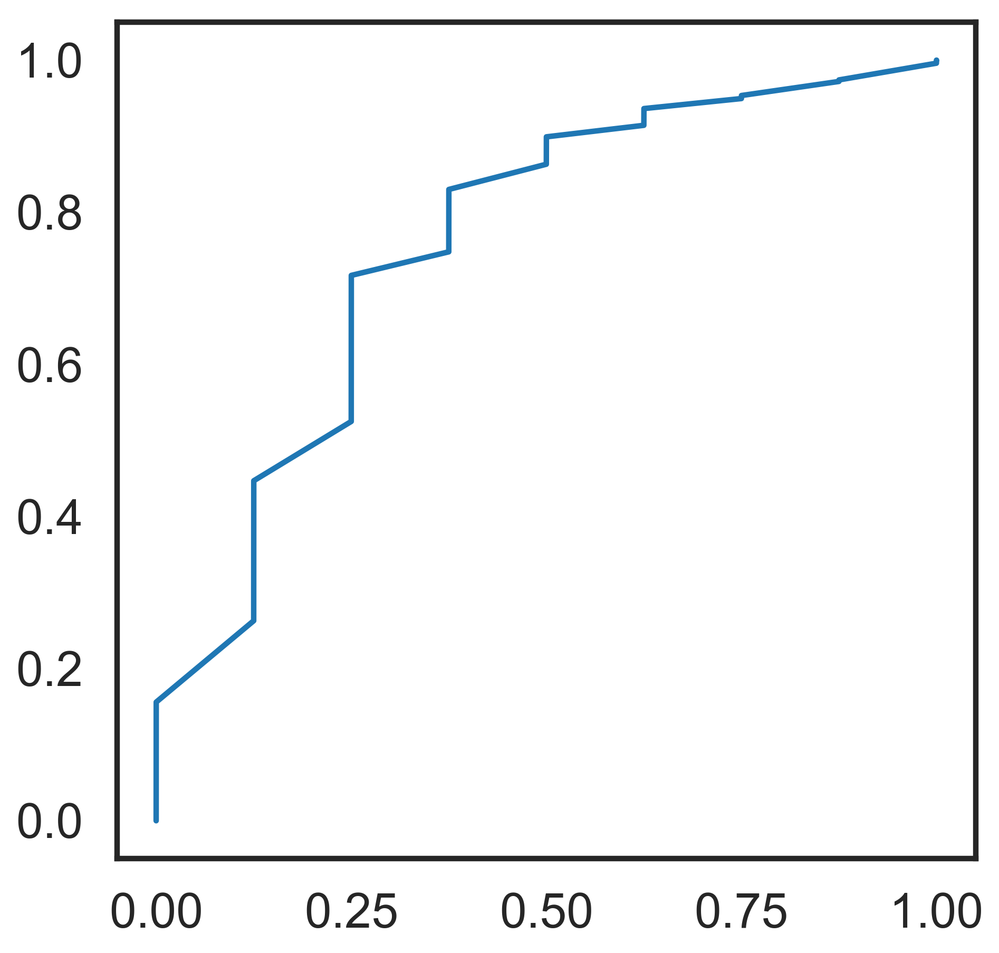

In [555]:
fig,ax =plt.subplots(figsize=(7,7))
ax.plot(xvals,mean,linewidth=2.5,)#color='gray',label=markername[i]+' AUC: '+str(np.round(auc,3)))


In [630]:
from ggplot import *
df = pd.DataFrame(dict(fpr = xvals, tpr = mean))
#+ geom_line() + geom_abline(linetype = 'dashed')
ggplot(df, aes(x = 'fpr', y = 'tpr')) + geom_point()+ geom_abline(linetype = 'dashed') + opts(panel.grid.major = none, panel.grid.minor = none)

#+ opts(panel.background = theme_rect(fill='white', colour='black'))


SyntaxError: keyword can't be an expression (<ipython-input-630-5ea70c65fba7>, line 4)

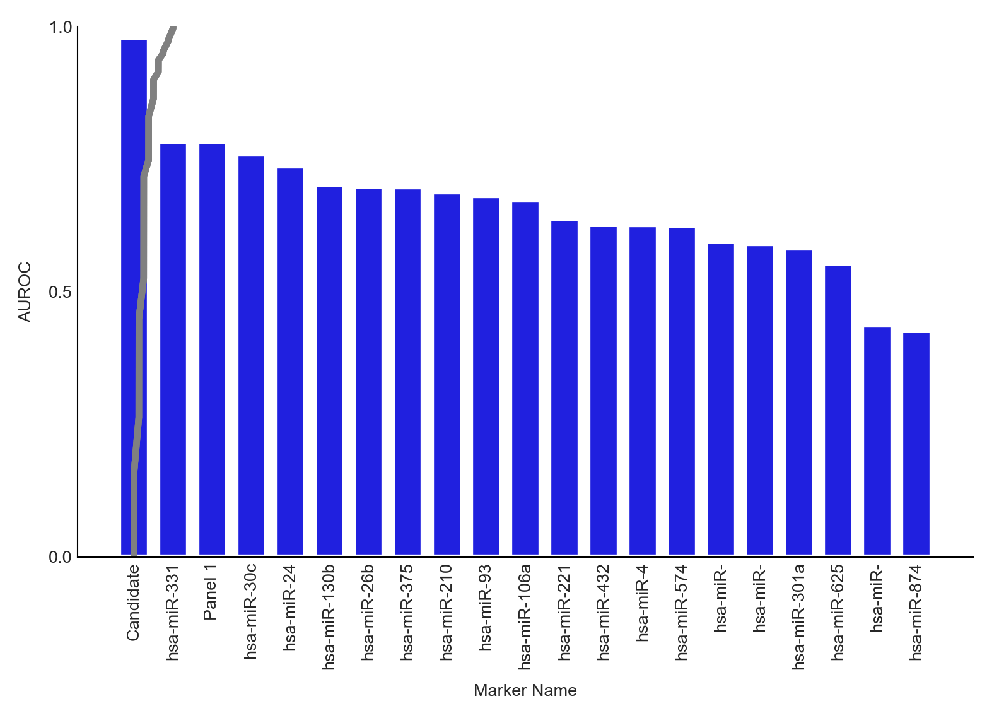

In [543]:
fig

In [523]:
def plot_shuffle(ax,filename,show_metrics=False,savefigure=False,title=None,
                 spe_criter=0.99,savepath=savepath,savefig=True,
                 compare_group=None,markers_file=None,marker_roc_ind = np.array([0]),markername=None):
    '''
    samplepath: hccpath
    filename: 'logistic_regression.100.robust.stratified_shuffle_split/evaluation.stratified_shuffle_split.h5'
    '''  
    if markers_file is not None:
        markers_auc = {}
        for i in range(markers_file.shape[0]):
            mean,_,_,interpolatednum = get_probs_split(markers_file[i])
            xvals = np.linspace(0, 1, interpolatednum)  
            auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
            if np.isin(i,marker_roc_ind):
               # print (markername[marker_roc_ind[i]],marker_roc_ind[i])
                ax.plot(xvals,mean,linewidth=2.5,color='gray',label=markername[i]+' AUC: '+str(np.round(auc,3)))
            markers_auc[i],_,_ = find_metrics_best_for_shuffle(xvals,mean)
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    xvals = np.linspace(0, 1, interpolatednum)
    ax.fill_between(xvals,minimum,maximum,where=(minimum<=maximum),color='b',alpha=0.1)   
    auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
    candidatevalue = auc
    numind = np.ceil((1-spe)/(1./(interpolatednum-2))).astype('int')
    ax.plot(xvals,mean,linewidth=2.5,color=Category20c[20][1],label='candidate AUC: '+str(np.round(auc,3)))
    ax.plot(xvals,minimum,linewidth=1,color='b')
    ax.plot(xvals,maximum,linewidth=1,color='b')
    h,l = ax.get_legend_handles_labels()
    legend = ax.legend(h,l)
    sen_criter = get_speci_sensi(filename,spe_criteria=spe_criter)[0]
    if show_metrics:
        if sen+0.2<=0.95:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe, sen+0.2),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=2.5),
            )
        else:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe+0.05, sen-0.2),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=2.5),
            )
        ax.annotate('Sensitivity '+str('%0.4s'%sen), xy=( 1-spe,sen), xytext=(1-spe+0.1, sen-0.1),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.1,width=1.5,headwidth=2.5),
            )
    ax.annotate('Sensitivity '+str('%0.4s'%sen_criter), xy=( 1-spe_criter,sen_criter), xytext=(1-spe_criter+0.1, sen_criter),size=6.5,
        arrowprops=dict(facecolor='black', shrink=0.8,width=1.5,headwidth=2.5),
        )
    ax = std_plot(ax,'False Positive Rate','True Positive Rate',title,'Marker',legendsort=False,borderpad=0.4,handletextpad=0.4)
    ax.plot([0,1],[0,1], linewidth=2,alpha=0.6,color='gray',linestyle='--')
    #ax.set_yticklabels(np.arange(0,12,2)/10,fontticklabel)
    #ax.set_xticklabels(np.arange(0,12,2)/10,fontticklabel)
    if savefig:
        fig.savefig(savepath+compare_group+'_ROC.eps', bbox_inches='tight')
    #return mean,minimum,maximum,interpolatednum
    
    return markers_auc,candidatevalue

In [514]:
def return_marker_file(dataset,compare_group,num,de=True):
    marker_file = np.array(['output/'+dataset+'/evaluate_features/result/'+compare_group+'/control_markers_'+str(i)+
                            '/random_forest/evaluation.stratified_shuffle_split.h5' for i in control_markers[compare_group].keys() ])
    if de==True:
        marker_file = np.concatenate((marker_file,np.array(['output/'+dataset+'/evaluate_features/result/'+dataset+'.de_selected_mx/'+compare_group+
                                                            '/random_forest/evaluation.stratified_shuffle_split.h5'])))
    return marker_file

In [515]:
marker_roc_ind = {}
marker_roc_ind['Normal-CRC'] = np.array([0,18])
marker_roc_ind['Normal-PAAD'] = np.array([0,1])
marker_roc_ind['Normal-PRAD'] = np.array([0,1])

In [526]:
shuffle_split_roc_file

'output/scirep/feature_selection/filter.viper_count.Norm_CPM.Batch_RUV.domains_combined/Normal-PRAD/random_forest.10.robust/'

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

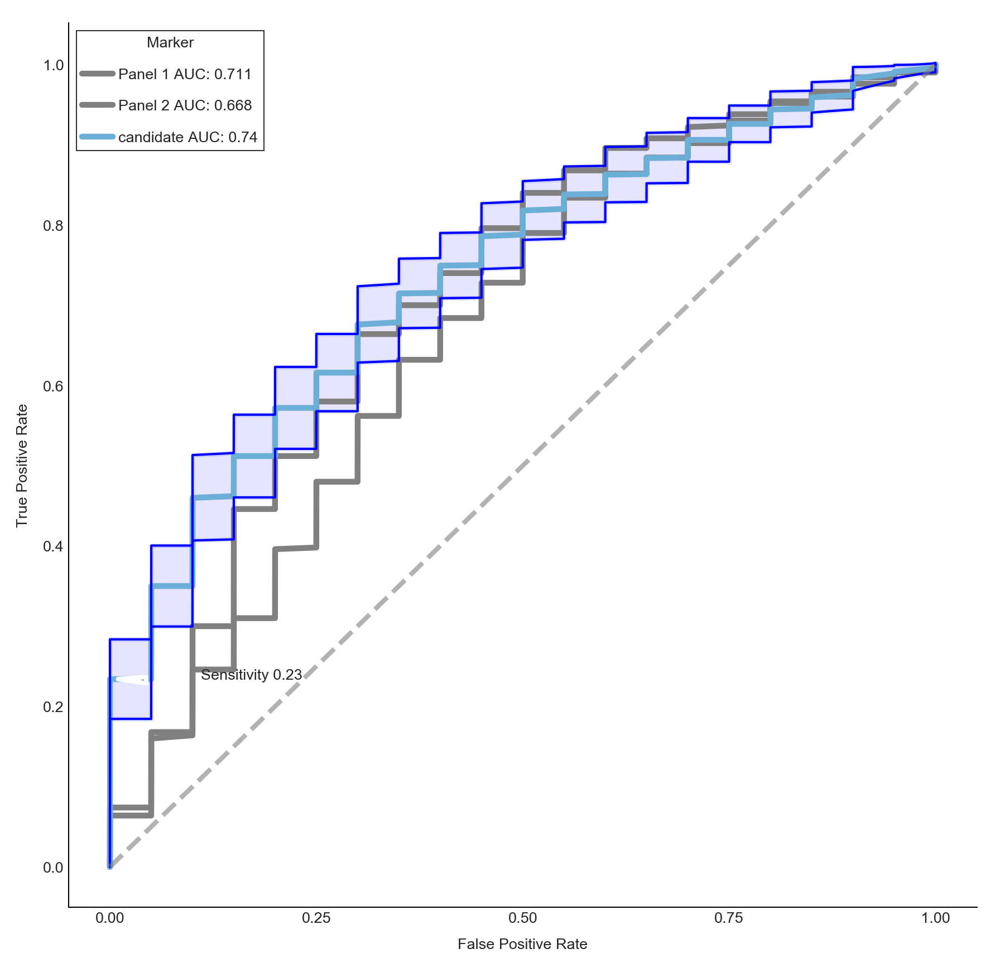

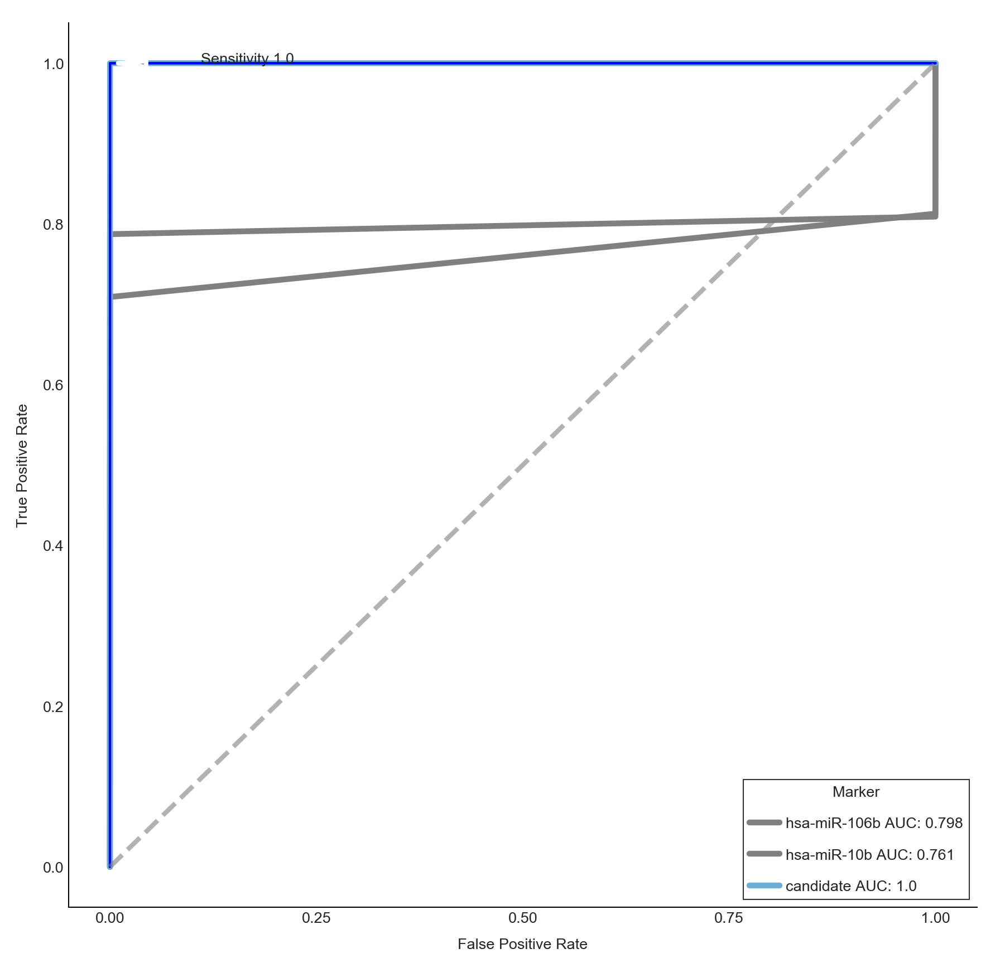

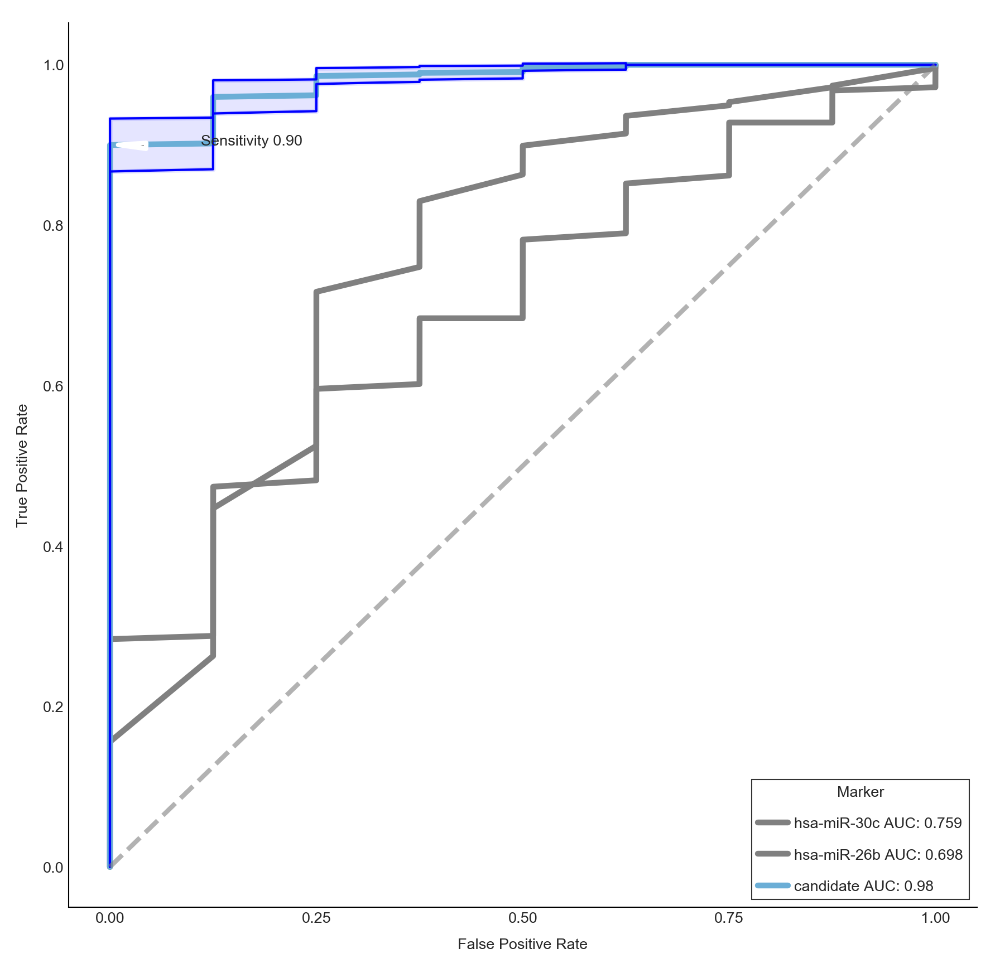

In [524]:
markers_auc = {}
candidatevalue={}
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    
    shuffle_split_roc_file = 'output/'+dataset+'/feature_selection/'+preprocess_method+'/'+compare_group+'/random_forest.10.robust/'
    fig,ax=plt.subplots(1,figsize=(7,7))
    #markername  = np.array([control_markers[compare_group][i][0] for i in control_markers[compare_group].keys()])
    markername  = {}
    count = 0
    for i in control_markers[compare_group].keys():
        tmpmarkers = np.unique(np.array([control_markers[compare_group][i][j][:-3] for j in range(control_markers[compare_group][i].shape[0])]))
        
        #print (tmpmarkers)
        if tmpmarkers.shape[0] >1:
            markername[i] = 'Panel '+str(count+1)
            count+=1
        else:
            markername[i] = tmpmarkers[0]
    #print (markername)
    ## TO DO: panel
    if compare_group=='Normal-CRC':
        markers_auc[compare_group],candidatevalue[compare_group] =  plot_shuffle(ax,shuffle_split_roc_file+'evaluation.stratified_shuffle_split.h5',
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),de=False)
                #markers_file=return_marker_file(dataset,compare_group,1,de=False)                        
                           ,title= None,marker_roc_ind =marker_roc_ind[compare_group],markername=markername)
    else:
        markers_auc[compare_group],candidatevalue[compare_group] = plot_shuffle(ax,shuffle_split_roc_file+'evaluation.stratified_shuffle_split.h5',
                     spe_criter=0.99,compare_group=compare_group,
                   markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),de=False)
                #markers_file=return_marker_file(dataset,compare_group,0,de=False)  
                         ,title= None,marker_roc_ind =marker_roc_ind[compare_group],markername=markername)
        

In [271]:
np.array([control_markers[compare_group][8][i][:-3] for i in range(control_markers[compare_group][8].shape[0])])


array(['hsa-miR-210', 'hsa-miR-210'], dtype='<U11')

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

,markers
panel 1,"hsa-miR-139,hsa-miR-21,hsa-miR-431,hsa-miR-431-,hsa-miR-92a,\n hsa-miR-92b"
panel 2,"hsa-miR-92a,hsa-miR-92b"


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


,markers
panel 1,"hsa-miR-106b,hsa-miR-10b"
panel 2,"hsa-miR-155,hsa-miR-21,hsa-miR-210"


[ 0  1  2  3  4  5  6  7  8  9 10 12 13 14 15 16 17 18]


,markers
panel 1,"hsa-let-7e,hsa-miR-1285,hsa-miR-30c"


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]



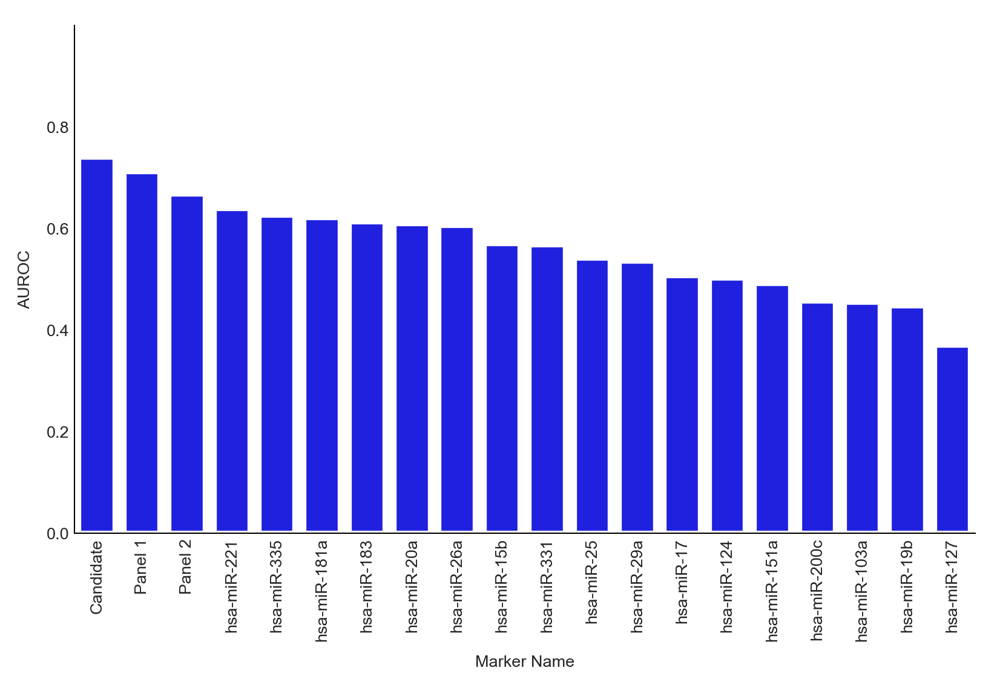

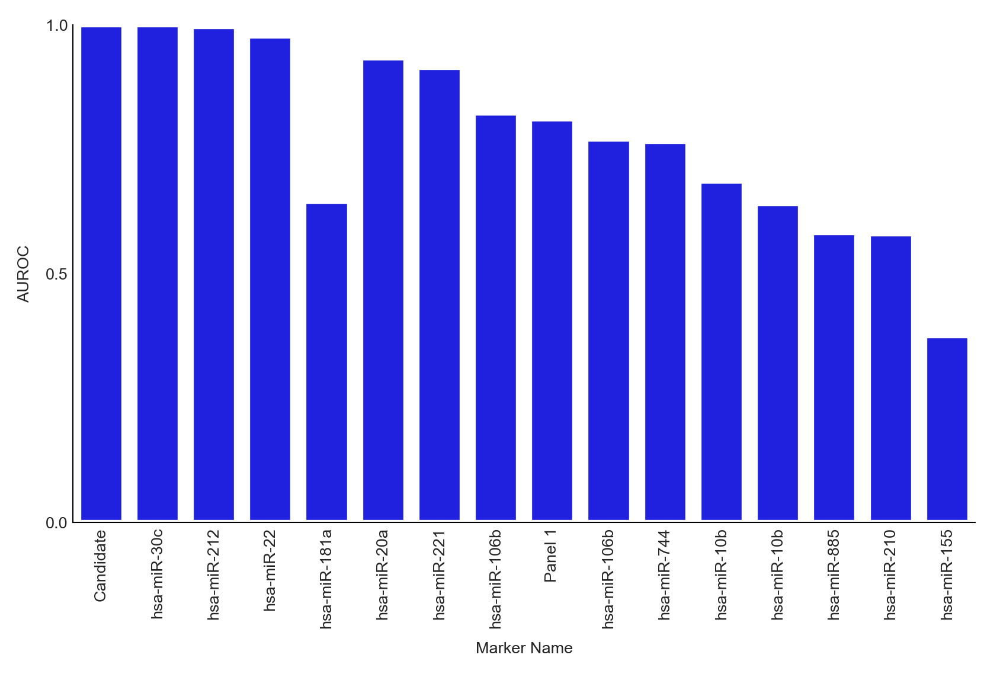

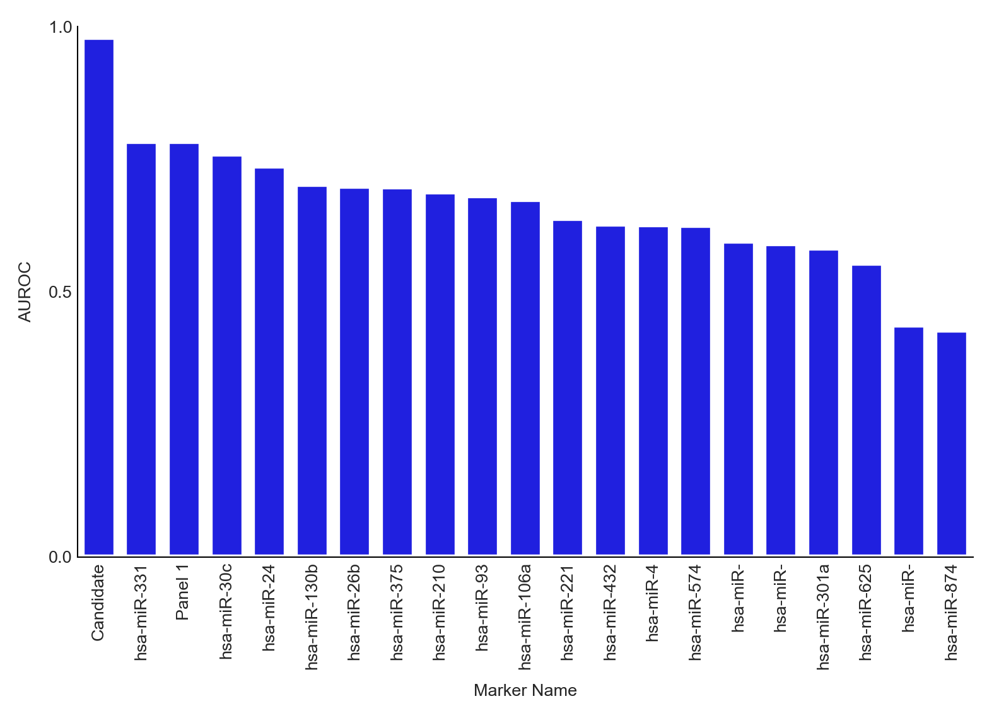

In [525]:
pd.set_option('display.max_colwidth', -1)
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    if len(control_markers[compare_group].keys())>0:
        #print (len(control_markers[compare_group].keys()),compare_group)
        #markernames  = np.concatenate((np.array(['Candidate']),np.array([control_markers[compare_group][i][0] for i in range(len(control_markers[compare_group].keys()))])))
        markernames = np.ndarray([len(control_markers[compare_group].keys())+1]).astype('str')
        markernames[0] = 'Candidate'
        count = 0
        count_=1
        panel_marker = []
        for i in control_markers[compare_group].keys(): 
            tmpmarkers = np.unique(np.array([control_markers[compare_group][i][j][:-3] for j in range(control_markers[compare_group][i].shape[0])]))
            #print (tmpmarkers)
            if tmpmarkers.shape[0] >1:
                markernames[count_] = 'Panel '+str(count+1)
                panel_marker.append(np.array2string(tmpmarkers,separator=',')[2:-2].replace("'", ""))
                count+=1
            else:
                markernames[count_] = tmpmarkers[0]
            count_+=1
        #print (markernames)
        if len(panel_marker) >0:
            panel_table = pd.DataFrame(panel_marker)
            panel_table.index = np.array(['panel '+str(i+1) for i in range(panel_table.shape[0])])
            panel_table.columns = ['markers']
            display(panel_table)
        selectedind = np.array([i for i in control_markers[compare_group].keys()])
        print (selectedind)
        
        aucall = np.concatenate((np.array([candidatevalue[compare_group]]),np.array([markers_auc[compare_group][i] for i in markers_auc[compare_group].keys()])))
        auctable =pd.DataFrame(np.concatenate((markernames.reshape(-1,1),aucall.reshape(-1,1)),axis=1))
        auctable.columns = ['Marker Name','AUROC']
        auctable.AUROC = pd.to_numeric(auctable.AUROC )
        auctable = auctable.sort_values('AUROC',ascending=0)
        #display(auctable)
        fig, ax = plt.subplots(1,figsize=(7, 4))
        #auctable.plot(kind='bar')
        sns.barplot(data=auctable,x='Marker Name',ci=None,y='AUROC',color='b')
        fig.tight_layout()
        ax.set_xticklabels(auctable.iloc[:,0],rotation=90,fontsize=20,weight='bold')
        ax = std_plot(ax,'Marker Name','AUROC',None,ylim=[0,1])
        #ax.set_ylim(0,1)
        #if savefig:
        fig.savefig(savepath+compare_group+'_marker_barplot.eps', bbox_inches='tight')

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

19 Normal-CRC


,markers
panel 0,"hsa-miR-92a-3p,hsa-miR-92b-3p,hsa-miR-92b-5p,hsa-miR-21-3p,\n hsa-miR-21-5p,hsa-miR-139-3p,hsa-miR-139-5p,hsa-miR-431-3p,\n hsa-miR-431-5sp"
panel 1,"hsa-miR-221-3p,hsa-miR-221-5p"
panel 2,"hsa-miR-15b-5p,hsa-miR-15b-3p"
panel 3,"hsa-miR-335-3p,hsa-miR-335-5p"
panel 4,"hsa-miR-92b-3p,hsa-miR-92b-5p,hsa-miR-92a-3p,hsa-miR-92a-5p"


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
18 Normal-PAAD


,markers
panel 0,"hsa-miR-106b-3p,hsa-miR-106b-5p"
panel 1,"hsa-miR-10b-3p,hsa-miR-10b-5p"
panel 2,"hsa-miR-21-5p,hsa-miR-21-3p"
panel 3,"hsa-miR-181a-3p,hsa-miR-181a-5p"
panel 4,"hsa-miR-22-5p,hsa-miR-22-3p"
panel 5,"hsa-miR-885-5p,hsa-miR-885-3p"
panel 6,"hsa-miR-744-5p,hsa-miR-744-3p"
panel 7,"hsa-miR-10b-3p,hsa-miR-10b-5p"
panel 8,"hsa-miR-106b-3p,hsa-miR-106b-5p"
panel 9,"hsa-miR-212-3p,hsa-miR-212-5p"


[ 0  1  2  3  4  5  6  7  8  9 10 12 13 14 15 16 17 18]
22 Normal-PRAD


,markers
panel 0,"hsa-miR-26b-3p,hsa-miR-26b-5p"
panel 1,"hsa-let-7e-3p,hsa-let-7e-5p,hsa-miR-30c-5p,hsa-miR-1285-3p"
panel 2,"hsa-miR-210-3p,hsa-miR-210-5p"
panel 3,"hsa-miR-221-3p,hsa-miR-221-5p"
panel 4,"hsa-miR-130b-3p,hsa-miR-130b-5p"


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]



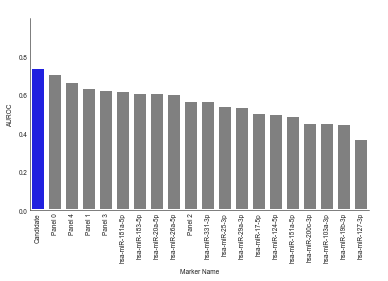

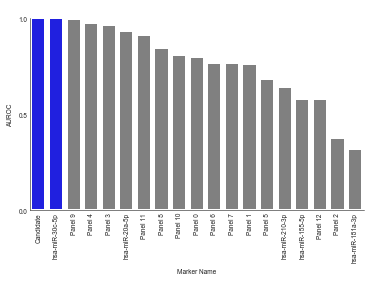

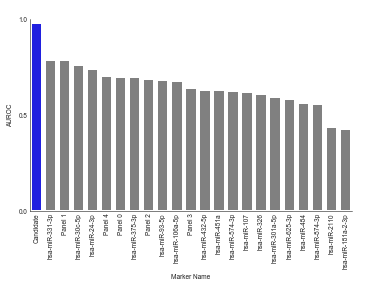

In [33]:
pd.set_option('display.max_colwidth', -1)
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    if len(control_markers[compare_group].keys())>0:
        print (len(control_markers[compare_group].keys()),compare_group)
        #markernames  = np.concatenate((np.array(['Candidate']),np.array([control_markers[compare_group][i][0] for i in range(len(control_markers[compare_group].keys()))])))
        markernames = np.ndarray([len(control_markers[compare_group].keys())+1]).astype('str')
        markernames[0] = 'Candidate'
        count = 0
        count_=1
        panel_marker = []
        for i in control_markers[compare_group].keys(): 
            if control_markers[compare_group][i].shape[0] >1:
                markernames[count_] = 'Panel '+str(count)
                panel_marker.append(np.array2string(control_markers[compare_group][i],separator=',')[2:-2].replace("'", ""))
                count+=1
            else:
                markernames[count_] = control_markers[compare_group][i][0]
            count_+=1
        #print (markernames)
        if len(panel_marker) >0:
            panel_table = pd.DataFrame(panel_marker)
            panel_table.index = np.array(['panel '+str(i) for i in range(panel_table.shape[0])])
            panel_table.columns = ['markers']
            display(panel_table)
        selectedind = np.array([i for i in control_markers[compare_group].keys()])
        print (selectedind)
        
        aucall = np.concatenate((np.array([candidatevalue[compare_group]]),np.array([markers_auc[compare_group][i] for i in markers_auc[compare_group].keys()])))
        auctable =pd.DataFrame(np.concatenate((markernames.reshape(-1,1),aucall.reshape(-1,1)),axis=1))
        auctable.columns = ['Marker Name','AUROC']
        auctable.AUROC = pd.to_numeric(auctable.AUROC )
        auctable = auctable.sort_values('AUROC',ascending=0)
        #display(auctable)
        fig, ax = plt.subplots(1,figsize=(7, 4))
        #auctable.plot(kind='bar')
        
        clrs = ['grey' if (x < max(np.array(auctable.AUROC))) else 'blue' for x in np.array(auctable.AUROC)]
        sns.barplot(data=auctable,x='Marker Name',y='AUROC',palette=clrs)
        fig.tight_layout()
        ax.set_xticklabels(auctable.iloc[:,0],rotation=90,fontsize=20,weight='bold')
        ax = std_plot(ax,'Marker Name','AUROC',None)
        ax.set_ylim(0,1)
        #if savefig:
        fig.savefig(savepath+compare_group+'_marker_barplot.eps', bbox_inches='tight')

In [29]:
savepath

'output/candidate/scirep/2019.1.9.23:17/'

## Cluster map

In [117]:
cpm_table_use['genetype'] = np.array([feature_matrix.index[i].split('|')[1] for i in range(feature_matrix.shape[0])])
pd.concat((sample_class_use.T,cpm_table_use)).to_csv('tmp.txt',sep='\t')
from clustergrammer_widget import Network, clustergrammer_widget
net = Network(clustergrammer_widget)
net.load_file('tmp.txt')

# cluster using default parameters
net.cluster(enrichrgram=True)

# make interactive widget
net.widget()

In [267]:
def open_file_or_stdout(filename):
    if filename == '-':
        return sys.stdout
    else:
        return open(filename, 'w')
def extract_feature_sequence(output_file,genome_dir,selected_features):
    from pyfaidx import Fasta
    from Bio.Seq import Seq

    fout = open_file_or_stdout(output_file)
    fastas = {}
    for feature in selected_features:
        gene_id, gene_type, gene_name, domain_id, transcript_id, start, end = feature.split('|')
        if gene_type=='miRNA':
            gene_type = 'mature_miRNA'
        start = int(start)
        end = int(end)
        if gene_type == 'genomic':
            gene_type = 'genome'
        if gene_type not in fastas:
            fastas[gene_type] = Fasta(os.path.join(genome_dir, 'fasta', gene_type + '.fa'))
        if gene_type == 'genome':
            chrom, gstart, gend, strand = gene_id.split('_')
            gstart = int(gstart)
            gend = int(gend)
            seq = fastas[gene_type][chrom][gstart:gend].seq
            if strand == '-':
                seq = str(Seq(seq).reverse_complement())
        else:
            seq = fastas[gene_type][transcript_id][start:end].seq
        seq = seq.upper()
        fout.write('>{}\n'.format(feature))
        fout.write(seq)
        fout.write('\n')
    fout.close()

In [268]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    extract_feature_sequence(savepath+compare_group+'_sequence.txt','/Share/home/shibinbin/projects/exSeek-dev/genome/hg38/',
                         selected_features[compare_group])

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

In [28]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    print ('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt')

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

output/scirep/matrix_processing/filter.null.Norm_CPM_top.Batch_RUV.domains_combined.txt
output/scirep/matrix_processing/filter.viper_count.Norm_SCnorm.Batch_RUV.domains_combined.txt
output/scirep/matrix_processing/filter.viper_count.Norm_CPM.Batch_RUV.domains_combined.txt



In [29]:
genename_remain = {}
best_processed_mx = {}

for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    best_processed_mx[compare_group] =pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt')
    genename_remain[compare_group] = np.array([best_processed_mx[compare_group].index[i].split('|')[0] for i
                            in range(best_processed_mx[compare_group].index.shape[0])])
    

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

In [519]:
control_markers = {}
control_markers['Normal-CRC'] = {}
control_markers['Normal-CRC'][0] = np.array(['hsa-miR-92a-3p','hsa-miR-92b-3p',
                                             'hsa-miR-92b-5p','hsa-miR-21-3p',
                                            'hsa-miR-21-5p','hsa-miR-139-3p',
                                            'hsa-miR-139-5p','hsa-miR-431-3p','hsa-miR-431-5sp'])
control_markers['Normal-CRC'][1] =np.array(['hsa-miR-20a-5p'])
control_markers['Normal-CRC'][2] =np.array(['hsa-miR-26a-5p'])
control_markers['Normal-CRC'][3] =np.array(['hsa-miR-124-5p'])
control_markers['Normal-CRC'][4] =np.array(['hsa-miR-183-5p'])
control_markers['Normal-CRC'][5] =np.array(['hsa-miR-221-3p','hsa-miR-221-5p'])
control_markers['Normal-CRC'][6] =np.array(['hsa-miR-200c-3p'])
control_markers['Normal-CRC'][7] =np.array(['hsa-miR-25-3p'])
control_markers['Normal-CRC'][8] =np.array(['hsa-miR-331-3p'])
control_markers['Normal-CRC'][9] =np.array(['hsa-miR-103a-3p'])
control_markers['Normal-CRC'][10] =np.array(['hsa-miR-127-3p'])
control_markers['Normal-CRC'][11] =np.array(['hsa-miR-151a-5p'])
control_markers['Normal-CRC'][12] =np.array(['hsa-miR-17-5p'])
control_markers['Normal-CRC'][13] =np.array(['hsa-miR-181a-5p'])
control_markers['Normal-CRC'][14] =np.array(['hsa-miR-19b-3p'])
control_markers['Normal-CRC'][15] =np.array(['hsa-miR-15b-5p','hsa-miR-15b-3p'])
control_markers['Normal-CRC'][16] =np.array(['hsa-miR-29a-3p'])
control_markers['Normal-CRC'][17] =np.array(['hsa-miR-335-3p','hsa-miR-335-5p'])
control_markers['Normal-CRC'][18] =np.array(['hsa-miR-92b-3p','hsa-miR-92b-5p','hsa-miR-92a-3p','hsa-miR-92a-5p'])

control_markers['Normal-PAAD'] = {}
control_markers['Normal-PAAD'][0] = np.array(['hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][1] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p'])
control_markers['Normal-PAAD'][2] = np.array(['hsa-miR-21-5p','hsa-miR-21-3p'])
control_markers['Normal-PAAD'][3] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PAAD'][4] = np.array(['hsa-miR-20a-5p'])
control_markers['Normal-PAAD'][5] = np.array(['hsa-miR-181a-3p','hsa-miR-181a-5p'])
control_markers['Normal-PAAD'][6] = np.array(['hsa-miR-181a-3p'])
control_markers['Normal-PAAD'][7] = np.array(['hsa-miR-22-5p','hsa-miR-22-3p'])
control_markers['Normal-PAAD'][8] = np.array(['hsa-miR-885-5p','hsa-miR-885-3p'])
control_markers['Normal-PAAD'][9] = np.array(['hsa-miR-744-5p','hsa-miR-744-3p'])
control_markers['Normal-PAAD'][10] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p'])
#control_markers['Normal-PAAD'][11] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PAAD'][12] = np.array(['hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][13] = np.array(['hsa-miR-155-5p'])
control_markers['Normal-PAAD'][14] = np.array(['hsa-miR-212-3p','hsa-miR-212-5p'])
control_markers['Normal-PAAD'][15] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p','hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][16] = np.array(['hsa-miR-221-5p','hsa-miR-221-3p'])
control_markers['Normal-PAAD'][17] = np.array(['hsa-miR-210-3p'])
control_markers['Normal-PAAD'][18] = np.array(['hsa-miR-21-5p','hsa-miR-21-3p','hsa-miR-210-3p','hsa-miR-155-5p'])

control_markers['Normal-PRAD'] = {}
control_markers['Normal-PRAD'][0] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PRAD'][1] = np.array(['hsa-miR-26b-3p','hsa-miR-26b-5p'])
control_markers['Normal-PRAD'][2] = np.array(['hsa-miR-451a'])
control_markers['Normal-PRAD'][3] = np.array(['hsa-miR-24-3p'])
control_markers['Normal-PRAD'][4] = np.array(['hsa-miR-874-3p'])
control_markers['Normal-PRAD'][5] = np.array(['hsa-miR-93-5p'])
control_markers['Normal-PRAD'][6] = np.array(['hsa-miR-106a-5p'])
control_markers['Normal-PRAD'][7] = np.array(['hsa-let-7e-3p','hsa-let-7e-5p','hsa-miR-30c-5p','hsa-miR-1285-3p'])
control_markers['Normal-PRAD'][8] = np.array(['hsa-miR-210-3p','hsa-miR-210-5p'])
control_markers['Normal-PRAD'][9] = np.array(['hsa-miR-221-3p','hsa-miR-221-5p'])
control_markers['Normal-PRAD'][10] = np.array(['hsa-miR-375-3p'])
control_markers['Normal-PRAD'][11] = np.array(['hsa-miR-107'])
control_markers['Normal-PRAD'][12] = np.array(['hsa-miR-130b-3p','hsa-miR-130b-5p'])
control_markers['Normal-PRAD'][13] = np.array(['hsa-miR-181a-2-3p'])
control_markers['Normal-PRAD'][14] = np.array(['hsa-miR-2110'])
control_markers['Normal-PRAD'][15] = np.array(['hsa-miR-301a-5p'])
control_markers['Normal-PRAD'][16] = np.array(['hsa-miR-326'])
control_markers['Normal-PRAD'][17] = np.array(['hsa-miR-331-3p'])
control_markers['Normal-PRAD'][18] = np.array(['hsa-miR-432-5p'])
control_markers['Normal-PRAD'][19] = np.array(['hsa-miR-484'])
control_markers['Normal-PRAD'][20] = np.array(['hsa-miR-574-3p'])
control_markers['Normal-PRAD'][21] = np.array(['hsa-miR-625-3p'])


In [32]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    for i in range(len(control_markers[compare_group].keys())):
        tmptab = best_processed_mx[compare_group].iloc[np.isin(genename_remain[compare_group],control_markers[compare_group][i])]
        tmptab.to_csv('control_markers/'+dataset+'/data/'+compare_group+'/control_markers_'+str(i)+'.txt',sep='\t')


HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

#CRC
miR-92-3p,miR-21,miR-139-3p,miR-431
miR-20a
miR-26a
miR-124-5p
miR-141
miR-183
miR-221
miR-200c
miR-25-3p
miR-331-3p
miR-103a-3p
miR-127-3p
miR-151a-5p
miR-17-5p
miR-181a-5p
miR-18a-5p
miR-18b-5p
miR18a
miR19a
miR19b
miR15b
miR29a
miR335
miR-92
miR-17-3p

#Pancreat
miR-106b
miR-10b
miR-21
miR-30c
miR-20a
miR-181a
miR-483
miR-let7a
miR-122
miR-22
miR-642
miR-885
miR-223
miR-744
miR-10b
miR-30c
miR-106b
hsa-miR-155-5p
miR-212
Panel(miR-10b, miR-106b)
miR-182
miR-16
miR-885
miR-22
miR-642
Panel (miR-885, miR-22, miR-642)
miR-221
Panel (miR-16, miR-196a)
miR-21
miR-210
miR-155
miR-196a
Panel (miR-21,miR-210, miR-155, miR-196a)

#prostate
miR-30c
miR-26b
miR-451
miR-223
miR-24
miR-874
miR-1274a
miR-1207-5p
miR-93
miR-106a
panel(let-7e,let-7c,miR-30c,miR-622 and miR-1285)
miR-21
miR-221
miRNA-375
miRNA-141
miR-1290
miR-375
miR-107
miR-130B
miR-141
miR-181a-2
miR-2110
miR-301A
miR-326
miR-331-3p
miR-432
miR-484
miR-574-3p
miR-625

pvalue annotation legend:
ns: 5.00e-02 < p <= 1.00e+09
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

hsa-miR-92a-3p_Healthy Control v.s. hsa-miR-92a-3p_Cancer: MWW RankSum two-sided P_val=1.665e-01 U_stat=4.018e+03
hsa-miR-20a-5p_Healthy Control v.s. hsa-miR-20a-5p_Cancer: MWW RankSum two-sided P_val=1.199e-02 U_stat=4.400e+03
hsa-miR-26a-5p_Healthy Control v.s. hsa-miR-26a-5p_Cancer: MWW RankSum two-sided P_val=8.555e-02 U_stat=4.132e+03
hsa-miR-124-5p_Healthy Control v.s. hsa-miR-124-5p_Cancer: MWW RankSum two-sided P_val=8.554e-02 U_stat=2.968e+03
hsa-miR-183-5p_Healthy Control v.s. hsa-miR-183-5p_Cancer: MWW RankSum two-sided P_val=3.859e-01 U_stat=3.844e+03
hsa-miR-221-3p_Healthy Control v.s. hsa-miR-221-3p_Cancer: MWW RankSum two-sided P_val=9.046e-01 U_stat=3.591e+03
hsa-miR-200c-3p_Healthy Control v.s. hsa-miR-200c-3p_Cancer: MWW RankSum two-sided P_val=6.827e-01 U_stat=3.688e+03
hsa-miR-25-3p_Healthy Control v.s. hs

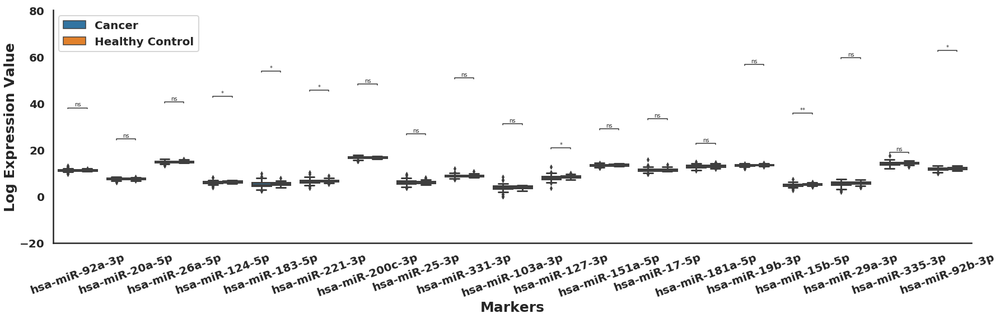

<Figure size 432x288 with 0 Axes>

In [35]:
original_mx_name=  np.array([original_mx.index[i].split('|')[2] for i in  range(original_mx.index.shape[0]) ])
markername  = np.array([control_markers['Normal-CRC'][i][0] for i in range(len(control_markers['Normal-CRC'].keys()))])
marker_mx = original_mx.iloc[np.isin(original_mx_name,markername)]
sampleindex = marker_mx.columns

featureindex = np.array([marker_mx.index[i].split('|')[2]  for i in range(marker_mx.index.shape[0])])
testtable = pd.DataFrame(np.concatenate((np.array(marker_mx).reshape(-1,1),
        np.repeat(np.array(sample_class.index),featureindex.shape[0]).reshape(-1,featureindex.shape[0]).T.reshape(-1,1),
   np.repeat(np.array(sample_class.label),featureindex.shape[0]).reshape(-1,featureindex.shape[0]).T.reshape(-1,1),
        np.repeat(np.array(featureindex),sampleindex.shape[0]).reshape(-1,1)),axis=1))
testtable.columns=['Expression value','Sample','Class','Feature']
testtable['Class'].iloc[np.where(testtable.Class !='Healthy Control')] ='Cancer'
testtable.iloc[:,0] = np.log2(np.array(testtable.iloc[:,0]).astype('float'))
x = 'Feature'
y = 'Expression value'
hue = 'Class'
        
fig, ax = plt.subplots(figsize=(25,8))
sns.boxplot(data = testtable,ax=ax,x=x,y=y,hue=hue)
#sns.stripplot(data =testtable,ax=ax,x=x,y=y,hue=hue,size=3, edgecolor='black')
ax.set_xticklabels(markername,rotation=20,fontsize=20)
#ax.set_yticklabels(['{:.1f}%'.format((i-1)*20) for i in range(10)],fontsize=20,fontweight='bold')

add_stat_annotation(ax=ax, data=testtable, x=x, y=y, hue=hue,
                    boxPairList=np.array([((markername[i],'Healthy Control'),(markername[i],'Cancer')) for i in range(markername.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
ax = std_plot(ax,'Markers','Log Expression Value',title=None)
fig.tight_layout()

In [266]:
def extract_featurefile(best_preprocess_methods):
    filename = []
    for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
        tmp='output/'+dataset+'/feature_selection/'+preprocess_method+'/'+compare_group+'/random_forest.10.robust/features.txt'
        filename.append(tmp)
    return np.array(filename)
np.savetxt('output/selected_feature/'+dataset+'/selected_features.txt',
           extract_featurefile(best_preprocess_methods),fmt='%s')

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

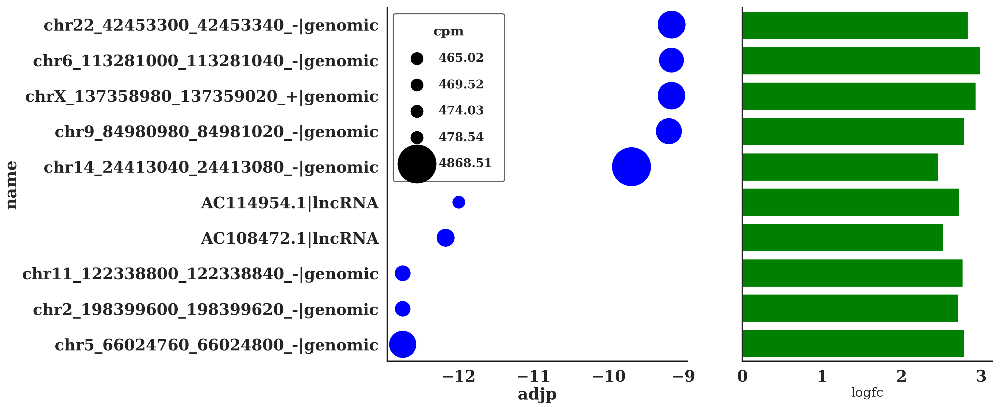

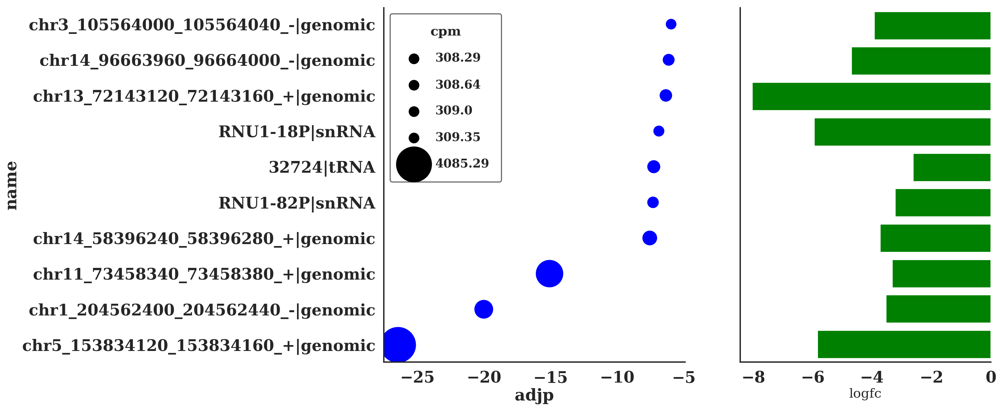

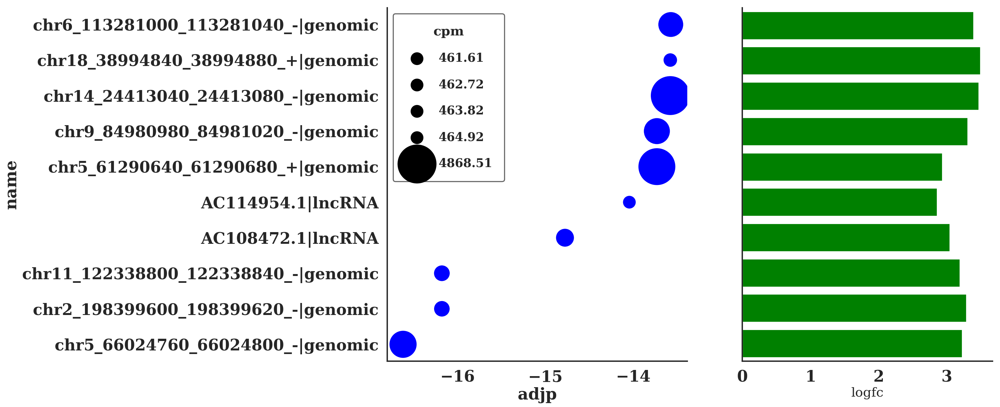

In [509]:
def DE_bar_plot(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)

    fig,ax=plt.subplots(1,3,figsize=(nums_retain*4,12))
    sns.barplot(ax=ax[0],data=dataframe,y='name',x='padj',color='r',saturation=1)
    ax[0].set_xlabel('log10 adjusted p value')
    sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='b',saturation=1)
    sns.barplot(ax=ax[2],data=dataframe,y='name',x='rpkm',color='g',saturation=1)
    #sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    if sequencing_type =='short':
        ax[2].set_xlabel('cpm')
    elif sequencing_type =='long':
        ax[2].set_xlabel('rpkm')
    plt.figure(linewidth=30.5)
    for i in range(3):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    ax[2].get_yaxis().set_ticks([])
    ax[2].set_ylabel('')
    fig.tight_layout()
    
def DE_bar_plot_(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)

    fig,ax=plt.subplots(1,2,figsize=(nums_retain*4,12))
    #sns.barplot(ax=ax[0],data=dataframe,y='name',x='padj',color='r',saturation=1)
    #for i in range(nums_retain):
        #display(pd.DataFrame(dataframe.iloc[i]).T)
    sns.stripplot(ax=ax[0],y='name',x='padj', data = dataframe, 
               palette="Set1", size=np.arange(100,200,10))#dataframe.rpkm[i])
    ax[0].set_xlabel('log10 adjusted p value')
    #sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='b',saturation=1)
    sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='g',saturation=1)
    #sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    ax[1].set_xlabel(mattype)
    plt.figure(linewidth=30.5)
    for i in range(2):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    #ax[2].get_yaxis().set_ticks([])
    #ax[2].set_ylabel('')
    fig.tight_layout()
def DE_bar_plot__(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)    
    #display(dataframe)
    f, (ax, ax1) = plt.subplots(1,2, figsize=(nums_retain*2,12),gridspec_kw = {'width_ratios':[1.2, 1]})
    scalefactor=1
    ax.scatter(dataframe.padj, np.arange(10),
                c = 'b', s=(dataframe.rpkm)*5, cmap="viridis")
    ax.set_xlabel("adjp",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(featurename)
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    #make a legend:
    pws = np.round(np.array([np.min(dataframe.rpkm),np.percentile(dataframe.rpkm,0.2),
                   np.percentile(dataframe.rpkm,0.4),np.percentile(dataframe.rpkm,0.6),
                   np.percentile(dataframe.rpkm,0.8),np.max(dataframe.rpkm)])*5,2)
    for pw in pws:
        ax.scatter([], [], s=pw*scalefactor, c="k",label=str(pw))
        
    h,l = ax.get_legend_handles_labels()
    ax.legend(h[1:], l[1:], labelspacing=1.2, title=mattype, borderpad=1, 
                frameon=True, framealpha=0.6, edgecolor="k", facecolor="w")
    sns.barplot(ax=ax1,data=dataframe,y='name',x='logfc',color='g',saturation=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax1.get_yaxis().set_ticks([])
    ax1.set_ylabel('')
    
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    if sequencing_type =='short':
        tmptable = cpm_table_origin
    elif sequencing_type =='long':
        tmptable = rpkm_table_origin
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0)
    DE_bar_plot__(detable,tmptable,nums_retain=10)